<a href="https://colab.research.google.com/github/JHyunjun/torch_Generative-Adversarial-Network/blob/main/250421_Delete_acd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
tf.config.list_physical_devices('GPU')
print("Available GPUs:", tf.config.list_physical_devices('GPU'))
# from tensorflow.python.client import device_lib
# print(device_lib.list_local_devices())

# tf.config.list_physical_devices('GPU')

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import time
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, BatchNormalization, Dropout, Flatten, Dense, TimeDistributed
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras.models import load_model
from tensorflow.keras.optimizers.schedules import ExponentialDecay


Available GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 4060 Laptop GPU, compute capability 8.9
Channel 0 (Current): min = -269.3, max = 159.4
Channel 1 (SOC): min = 13.0, max = 87.0
Channel 2 (Voltage): min = 615.7, max = 740.2
Channel 3 (△I): min = -226.0, max = 259.0
Final sequences shape: (5283, 60, 4)


c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

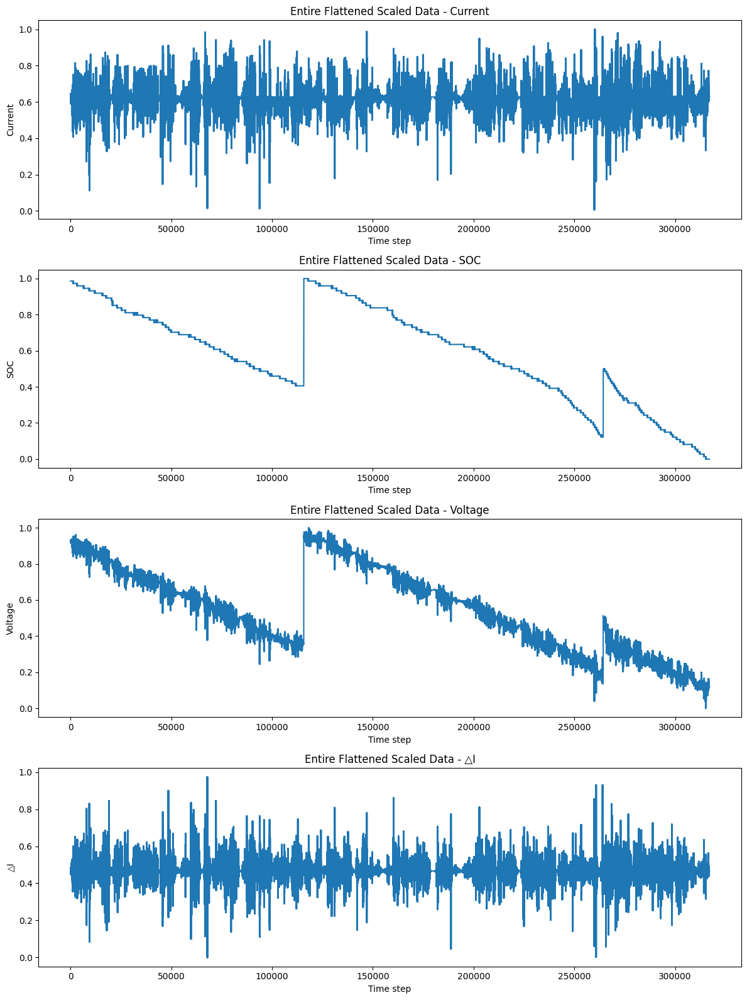

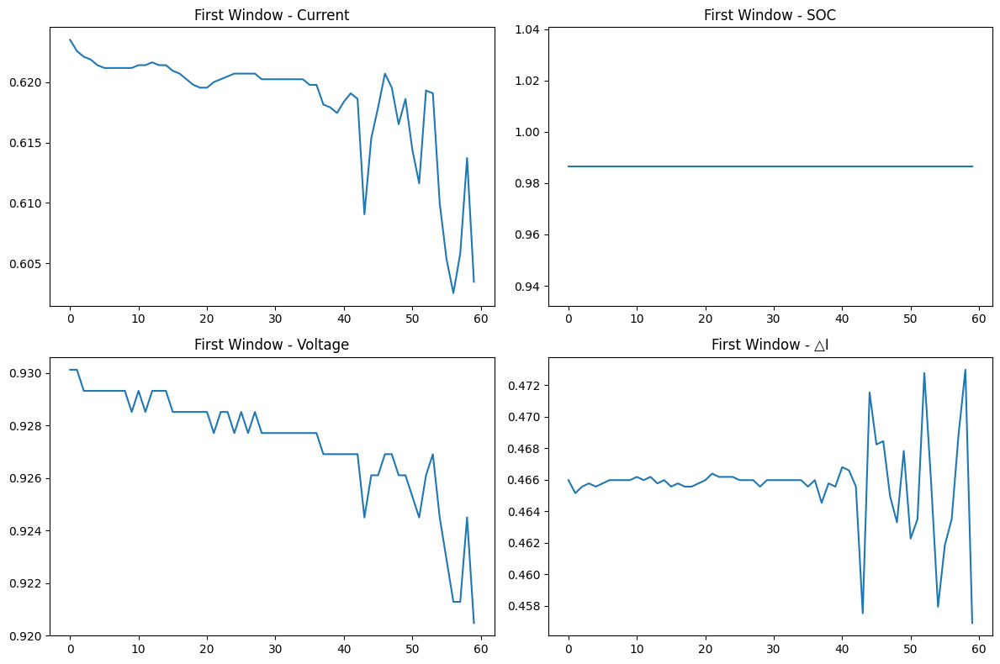

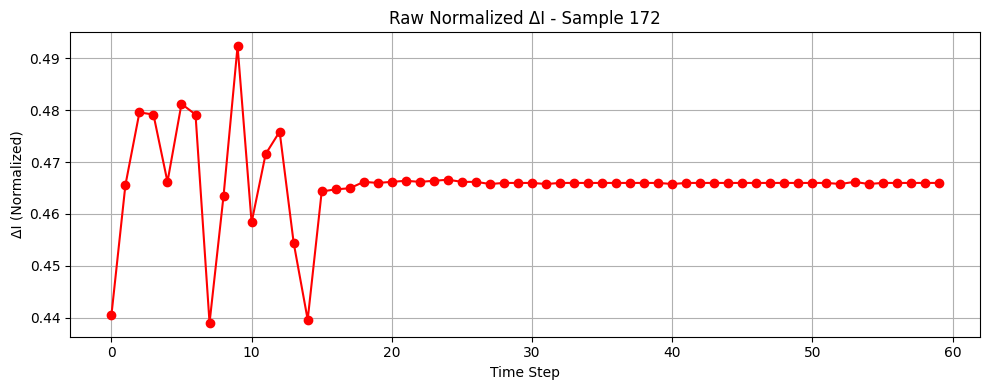

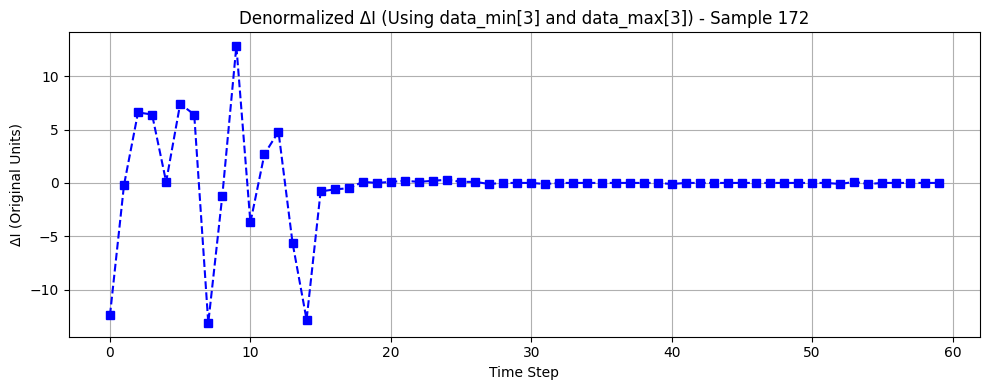

data_min[3] = -226.0 data_max[3] = 259.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

# Mixed precision 설정 (옵션)
tf.keras.mixed_precision.set_global_policy('mixed_float16')

############################################
# 1. 데이터 로드 및 전처리
############################################
def MinMaxScaler(data, data_min, data_max):
    return (data - data_min) / (data_max - data_min + 1e-7)

data_1_path = r"C:\Users\user\Desktop\JANG\code\AI\asd1_1.txt"
data_2_path = r"C:\Users\user\Desktop\JANG\code\AI\asd1_2.txt"
data_3_path = r"C:\Users\user\Desktop\JANG\code\AI\asd1_3.txt"
data_4_path = r"C:\Users\user\Desktop\JANG\code\AI\asd1_4.txt"

data1_1 = pd.read_csv(data_1_path, delimiter=",")
data1_2 = pd.read_csv(data_2_path, delimiter=",")
data1_3 = pd.read_csv(data_3_path, delimiter=",")
data1_4 = pd.read_csv(data_4_path, delimiter=",")

cols = ['Current', 'SOC', 'Voltage']
train_data1_1 = data1_1.iloc[:, [0, 2, 4]]
train_data1_2 = data1_2.iloc[:, [0, 2, 4]]
train_data1_3 = data1_3.iloc[:, [0, 2, 4]]
train_data1_4 = data1_4.iloc[:, [0, 2, 4]]

train_data1_1.columns = cols
train_data1_2.columns = cols
train_data1_3.columns = cols
train_data1_4.columns = cols

def quantize_soc(soc):
    soc_int = int(soc)
    if soc_int == 100:
        return 100
    if soc_int % 1 != 0:
        return soc_int - 1
    return soc_int

train_data1_1['SOC'] = train_data1_1['SOC'].apply(quantize_soc)
train_data1_2['SOC'] = train_data1_2['SOC'].apply(quantize_soc)
train_data1_3['SOC'] = train_data1_3['SOC'].apply(quantize_soc)
train_data1_4['SOC'] = train_data1_4['SOC'].apply(quantize_soc)

for df in [train_data1_1, train_data1_2, train_data1_3, train_data1_4]:
    df['△I'] = df['Current'].diff().fillna(0)

final_cols = ['Current', 'SOC', 'Voltage', '△I']
train_data1_1 = train_data1_1[final_cols]
train_data1_2 = train_data1_2[final_cols]
train_data1_3 = train_data1_3[final_cols]
train_data1_4 = train_data1_4[final_cols]

############################################
# 2. 데이터 스케일링 (전체 기준)
############################################
combined_data = pd.concat([train_data1_1, train_data1_2, train_data1_3, train_data1_4], ignore_index=True)
data_min = combined_data.min().values
data_max = combined_data.max().values

channel_names = ['Current', 'SOC', 'Voltage', '△I']
for idx, name in enumerate(channel_names):
    print(f"Channel {idx} ({name}): min = {data_min[idx]}, max = {data_max[idx]}")

train_scaled1_1 = MinMaxScaler(train_data1_1.values, data_min, data_max)
train_scaled1_2 = MinMaxScaler(train_data1_2.values, data_min, data_max)
train_scaled1_3 = MinMaxScaler(train_data1_3.values, data_min, data_max)
train_scaled1_4 = MinMaxScaler(train_data1_4.values, data_min, data_max)


############################################
# 3. 슬라이딩 윈도우 생성
############################################
window_size = 60
overlap_factor = 0.8

def create_sequences(data, window_size, overlap):
    stride = int(window_size * (1 - overlap))
    sequences = []
    for i in range(0, len(data) - window_size + 1, stride):
        sequences.append(data[i:i+window_size])
    return np.array(sequences)

train1_1_sequences = create_sequences(train_scaled1_1, window_size, overlap_factor)
train1_2_sequences = create_sequences(train_scaled1_2, window_size, overlap_factor)
train1_3_sequences = create_sequences(train_scaled1_3, window_size, overlap_factor)
train1_4_sequences = create_sequences(train_scaled1_4, window_size, overlap_factor)
test_sequences = train1_4_sequences

############################################
# 4. 최종 데이터 구성
############################################
final_sequences = np.concatenate([train1_1_sequences, train1_2_sequences, train1_3_sequences], axis=0)
print("Final sequences shape:", final_sequences.shape)
all_sequences = final_sequences
train_sequences = all_sequences

flat_sequences = final_sequences.reshape(-1, final_sequences.shape[-1])
feature_names = ['Current', 'SOC', 'Voltage', '△I']

plt.figure(figsize=(12, 16))
for i, col in enumerate(feature_names):
    plt.subplot(len(feature_names), 1, i+1)
    plt.plot(flat_sequences[:, i])
    plt.title(f'Entire Flattened Scaled Data - {col}')
    plt.ylabel(col)
    plt.xlabel('Time step')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
for i, col in enumerate(feature_names):
    plt.subplot(2, 2, i+1)
    plt.plot(final_sequences[0, :, i])
    plt.title(f"First Window - {col}")
plt.tight_layout()
plt.show()

############################################
# 5. Denorm 함수 정의 – 모든 채널에 대해 일반적인 역정규화
############################################
def denorm_feature(arr, feature_index):
    return arr * (data_max[feature_index] - data_min[feature_index] + 1e-7) + data_min[feature_index]

############################################
# 6. ΔI 채널에 대해 역정규화와 비교 Plotting
############################################
sample_index = 171

raw_delta = final_sequences[sample_index, :, 3]
denorm_delta_vals = denorm_feature(raw_delta, 3)

plt.figure(figsize=(10, 4))
plt.plot(raw_delta, marker='o', linestyle='-', color='red')
plt.title(f"Raw Normalized ΔI - Sample {sample_index+1}")
plt.xlabel("Time Step")
plt.ylabel("ΔI (Normalized)")
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(denorm_delta_vals, marker='s', linestyle='--', color='blue')
plt.title(f"Denormalized ΔI (Using data_min[3] and data_max[3]) - Sample {sample_index+1}")
plt.xlabel("Time Step")
plt.ylabel("ΔI (Original Units)")
plt.grid(True)
plt.tight_layout()
plt.show()

print("data_min[3] =", data_min[3], "data_max[3] =", data_max[3])


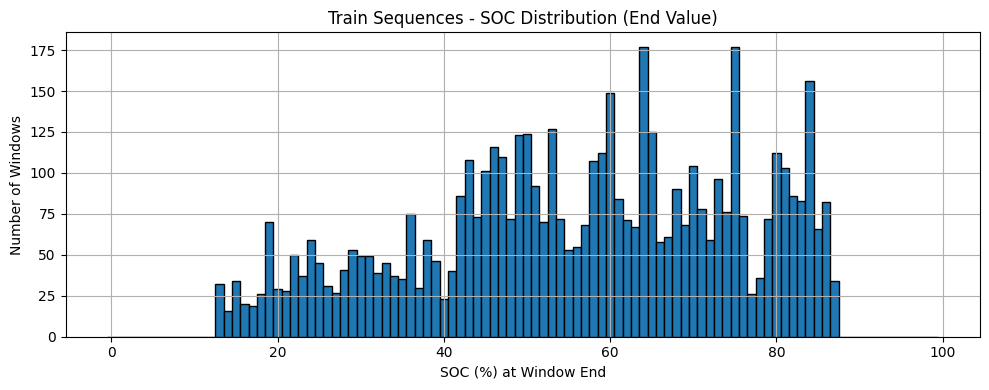

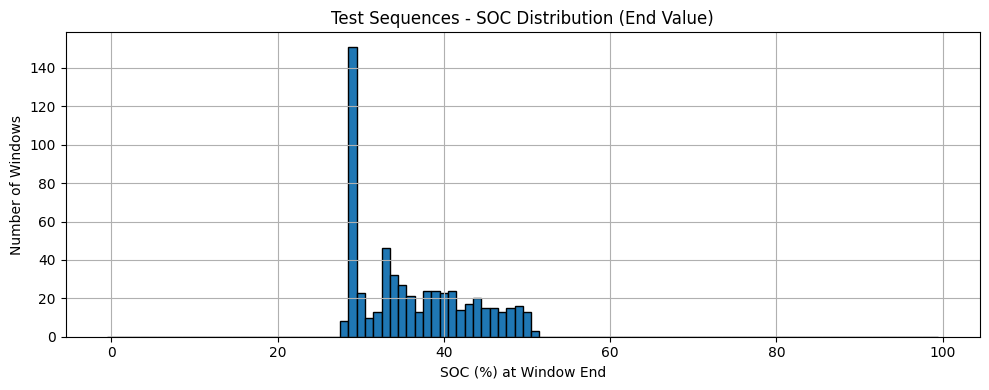

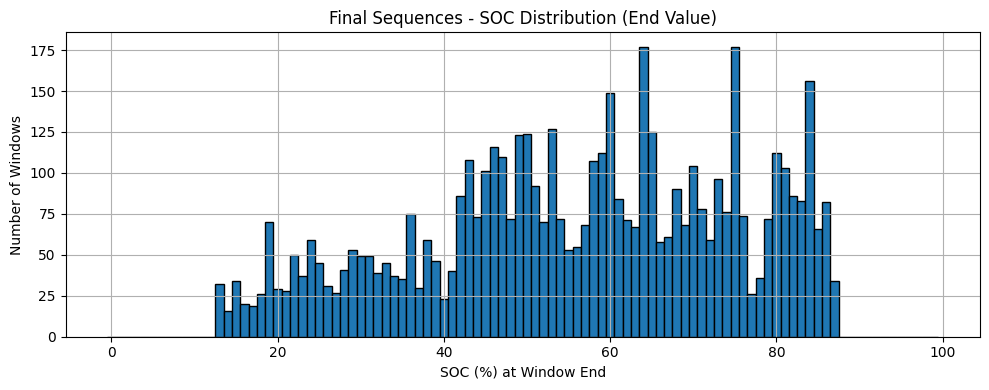

Train sequences: 윈도우가 하나도 없는 SOC 값 → [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
Test sequences: 윈도우가 하나도 없는 SOC 값 → [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
Final sequences: 윈도우가 하나도 없는 SOC 값 → [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
Train sequences count: 5283
Test sequences count:  580
Final sequences count: 5283


In [ ]:
def extract_end_soc(sequences):
    end_index = sequences.shape[1] - 1
    soc_index = feature_names.index('SOC')
    return sequences[:, end_index, soc_index]

def inverse_minmax(scaled_val, original_min, original_max):
    return scaled_val * (original_max - original_min + 1e-7) + original_min

soc_min = data_min[1]
soc_max = data_max[1]

train_soc_ends = inverse_minmax(extract_end_soc(train_sequences), soc_min, soc_max)
test_soc_ends  = inverse_minmax(extract_end_soc(test_sequences), soc_min, soc_max)
final_soc_ends = inverse_minmax(extract_end_soc(final_sequences), soc_min, soc_max)

def plot_real_soc_histogram(soc_ends, title):
    plt.figure(figsize=(10, 4))
    plt.hist(soc_ends, bins=np.arange(0, 101, 1), edgecolor='k', align='left')
    plt.title(title)
    plt.xlabel('SOC (%) at Window End')
    plt.ylabel('Number of Windows')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_real_soc_histogram(train_soc_ends, "Train Sequences - SOC Distribution (End Value)")
plot_real_soc_histogram(test_soc_ends, "Test Sequences - SOC Distribution (End Value)")
plot_real_soc_histogram(final_soc_ends, "Final Sequences - SOC Distribution (End Value)")

import numpy as np

# 가능한 SOC 범위 (0~100%)
all_socs = np.arange(0, 101)

def print_missing_socs(soc_ends, name):
    # soc_ends: 1D array of denormalized SOC (%)
    counts = np.bincount(soc_ends.astype(int), minlength=101)
    missing = all_socs[counts == 0]
    print(f"{name} sequences: 윈도우가 하나도 없는 SOC 값 → {missing.tolist()}")

# 이미 계산한 train_soc_ends, test_soc_ends, final_soc_ends 사용
print_missing_socs(train_soc_ends, "Train")
print_missing_socs(test_soc_ends,  "Test")
print_missing_socs(final_soc_ends, "Final")

print(f"Train sequences count: {train_sequences.shape[0]}")
print(f"Test sequences count:  {test_sequences.shape[0]}")
print(f"Final sequences count: {final_sequences.shape[0]}")


Teacher X shape: (5283, 60, 3)
Teacher Y shape: (5283, 60, 1)
1/1 [==============================] - 1s 638ms/step


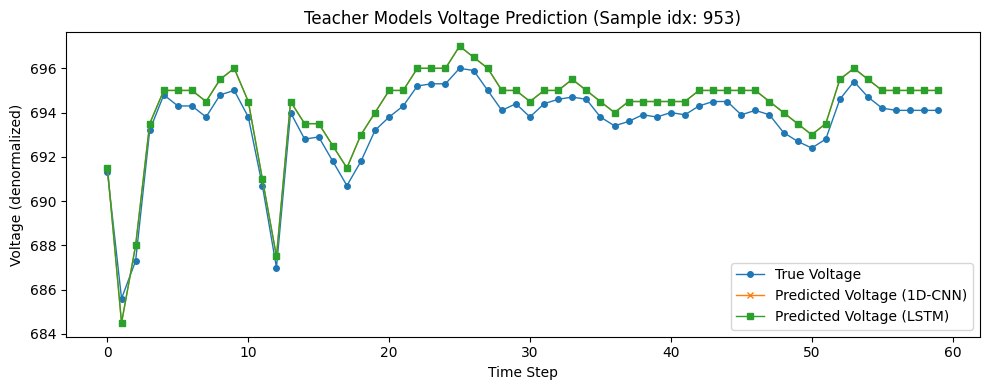

1/1 [==============================] - 0s 18ms/step


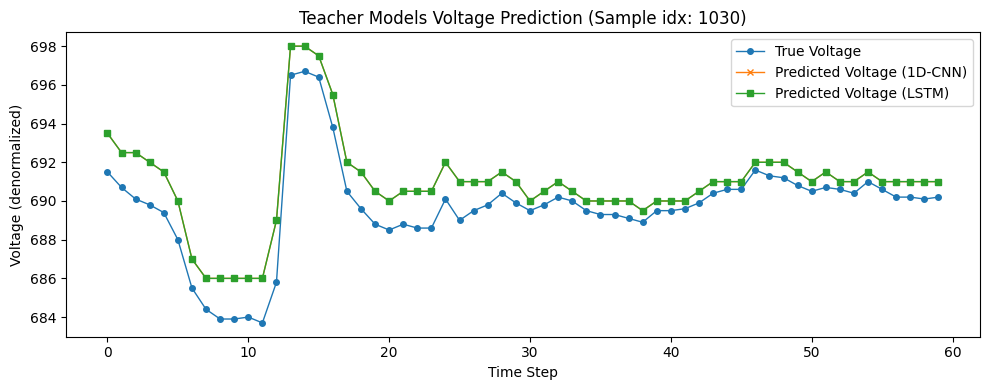

1/1 [==============================] - 0s 18ms/step


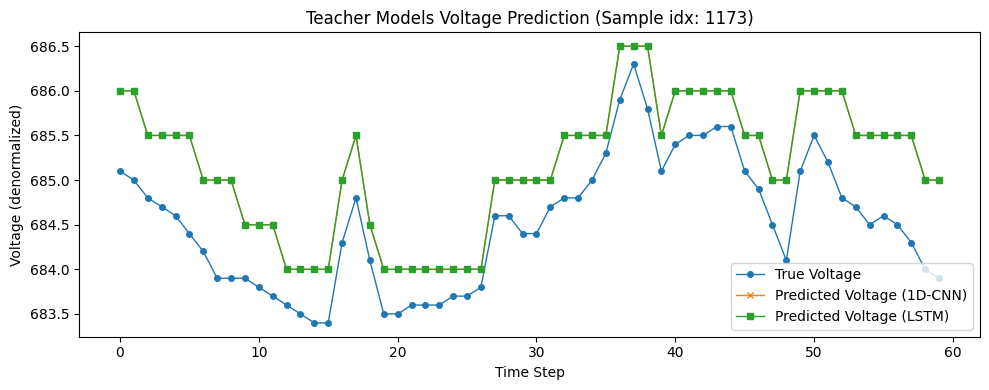

166/166 [==============================] - 1s 6ms/step


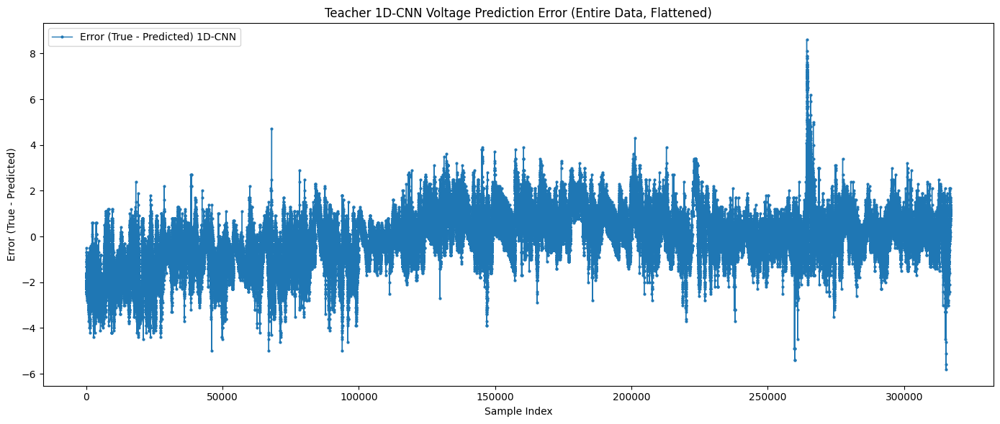

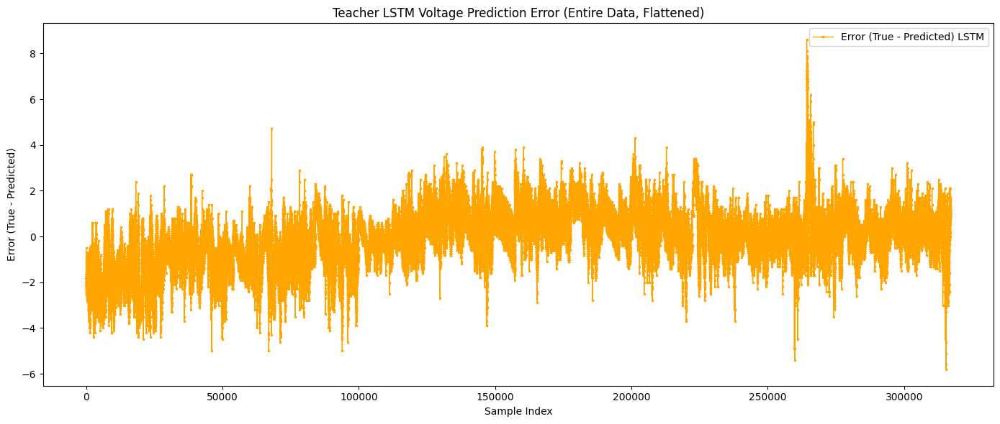

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, LSTM, TimeDistributed, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler

# Mixed precision 설정 (옵션)
tf.keras.mixed_precision.set_global_policy('mixed_float16')

############################################
# 3. Teacher 모델 학습 데이터 구성
############################################

# Teacher 모델 입력: 이제 [Current, SOC, △I]만 사용 (ΔV 제거)
teacher_X = all_sequences[..., [0, 1, 3]]  # shape: (N, window_size, 3)
teacher_Y = all_sequences[..., 2:3]         # shape: (N, window_size, 1)

print("Teacher X shape:", teacher_X.shape)
print("Teacher Y shape:", teacher_Y.shape)

############################################
# 4. Teacher 모델 정의 & 학습 (Learning Rate Decay 포함)
############################################

def lr_schedule(epoch, lr):
    if epoch > 0 and epoch % 100 == 0:
        return lr * 0.95
    return lr

lr_callback = LearningRateScheduler(lr_schedule, verbose=1)

# 4.2 LSTM Teacher 모델
# def build_teacher_lstm(input_shape):
#     inp = Input(shape=input_shape, dtype='float32')  # input_shape: (window_size, 3)
#     x = LSTM(128, return_sequences=True)(inp)
#     x = LSTM(128, return_sequences=True)(x)
#     x = LSTM(128, return_sequences=True)(x)
#     x = LSTM(32, return_sequences=True)(x)
#     out = TimeDistributed(Dense(1, activation='sigmoid'))(x)
#     model = Model(inp, out, name="Teacher_LSTM")
#     return model

# teacher_lstm = build_teacher_lstm((window_size, 3))
# teacher_lstm.summary()
# teacher_lstm.compile(optimizer=Adam(learning_rate=2e-4), loss='mse')

# history_lstm = teacher_lstm.fit(teacher_X, teacher_Y,
#                                 epochs=500,
#                                 batch_size=32,
#                                 callbacks=[lr_callback],
#                                 verbose=1)

# teacher_lstm.save("refined_lstm_deletedV_250418_Trainto.h5")
# print("LSTM Teacher model saved as refined_lstm_deletedV_250418_Trainto.h5")

teacher_lstm = tf.keras.models.load_model("refined_lstm_deletedV_250418_Trainto.h5")

teacher_1d = tf.keras.models.load_model("refined_lstm_deletedV_250418_Trainto.h5") ##############Trick


def denorm_vector(vec, feature_index, data_min, data_max):
    return vec * (data_max[feature_index] - data_min[feature_index] + 1e-7) + data_min[feature_index]

num_samples = teacher_X.shape[0]
random_indices = np.random.choice(num_samples, size=3, replace=False)

for idx in random_indices:
    sample_input = teacher_X[idx:idx+1]
    sample_true  = teacher_Y[idx:idx+1]

    pred_cnn = teacher_1d.predict(sample_input)
    pred_lstm = teacher_lstm.predict(sample_input)

    pred_cnn_flat = pred_cnn.reshape(-1)
    pred_lstm_flat = pred_lstm.reshape(-1)
    true_flat = sample_true.reshape(-1)

    true_denorm = denorm_vector(true_flat, 2, data_min, data_max)
    pred_cnn_denorm = denorm_vector(pred_cnn_flat, 2, data_min, data_max)
    pred_lstm_denorm = denorm_vector(pred_lstm_flat, 2, data_min, data_max)

    plt.figure(figsize=(10,4))
    plt.plot(true_denorm, label="True Voltage", marker='o', markersize=4, linewidth=1)
    plt.plot(pred_cnn_denorm, label="Predicted Voltage (1D-CNN)", marker='x', markersize=4, linewidth=1)
    plt.plot(pred_lstm_denorm, label="Predicted Voltage (LSTM)", marker='s', markersize=4, linewidth=1)
    plt.title(f"Teacher Models Voltage Prediction (Sample idx: {idx})")
    plt.xlabel("Time Step")
    plt.ylabel("Voltage (denormalized)")
    plt.legend()
    plt.tight_layout()
    plt.show()

pred_cnn = teacher_1d.predict(teacher_X)
pred_lstm = teacher_lstm.predict(teacher_X)
true_vals = teacher_Y

pred_cnn_flat = pred_cnn.reshape(-1)
pred_lstm_flat = pred_lstm.reshape(-1)
true_flat = true_vals.reshape(-1)

true_denorm = denorm_vector(true_flat, 2, data_min, data_max)
pred_cnn_denorm = denorm_vector(pred_cnn_flat, 2, data_min, data_max)
pred_lstm_denorm = denorm_vector(pred_lstm_flat, 2, data_min, data_max)

error_cnn = true_denorm - pred_cnn_denorm
error_lstm = true_denorm - pred_lstm_denorm

# 1D-CNN Teacher 모델 오차 플롯
plt.figure(figsize=(14,6))
plt.plot(error_cnn, label="Error (True - Predicted) 1D-CNN", marker='o', markersize=2, linewidth=1)
plt.title("Teacher 1D-CNN Voltage Prediction Error (Entire Data, Flattened)")
plt.xlabel("Sample Index")
plt.ylabel("Error (True - Predicted)")
plt.legend()
plt.tight_layout()
plt.show()

# LSTM Teacher 모델 오차 플롯
plt.figure(figsize=(14,6))
plt.plot(error_lstm, label="Error (True - Predicted) LSTM", marker='x', markersize=2, linewidth=1, color='orange')
plt.title("Teacher LSTM Voltage Prediction Error (Entire Data, Flattened)")
plt.xlabel("Sample Index")
plt.ylabel("Error (True - Predicted)")
plt.legend()
plt.tight_layout()
plt.show()


19/19 [==============================] - 0s 7ms/step


c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:57: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:68: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


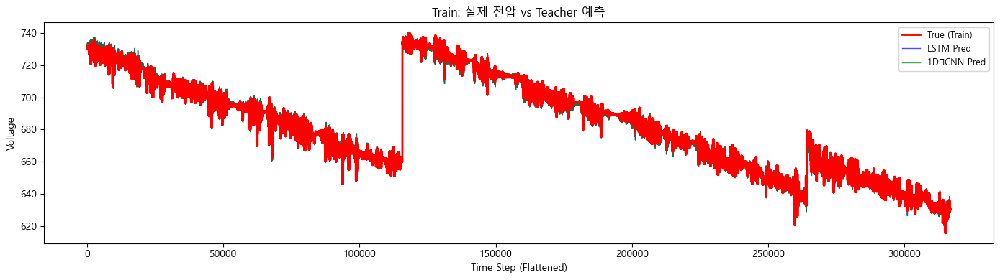

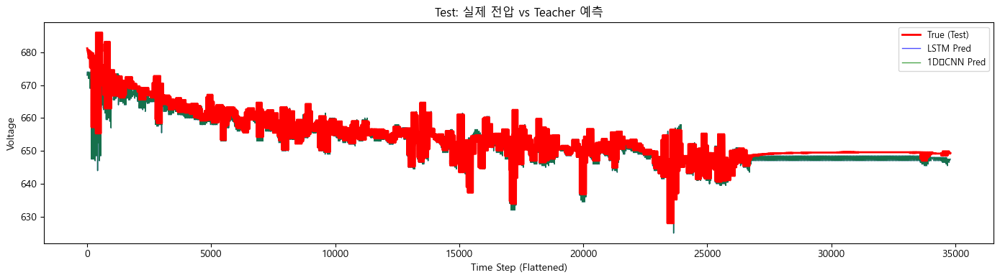

c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:80: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:89: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.


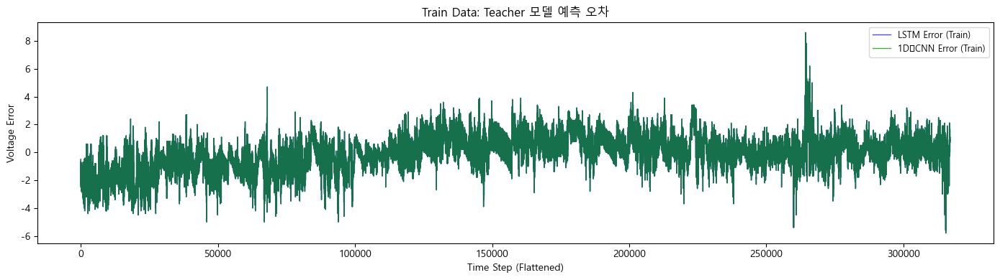

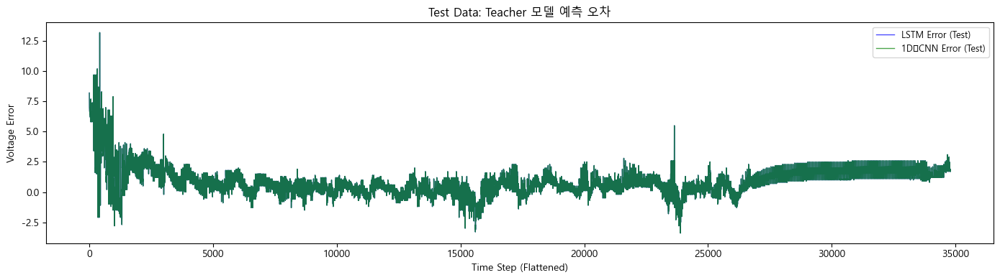

c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:154: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:179: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.


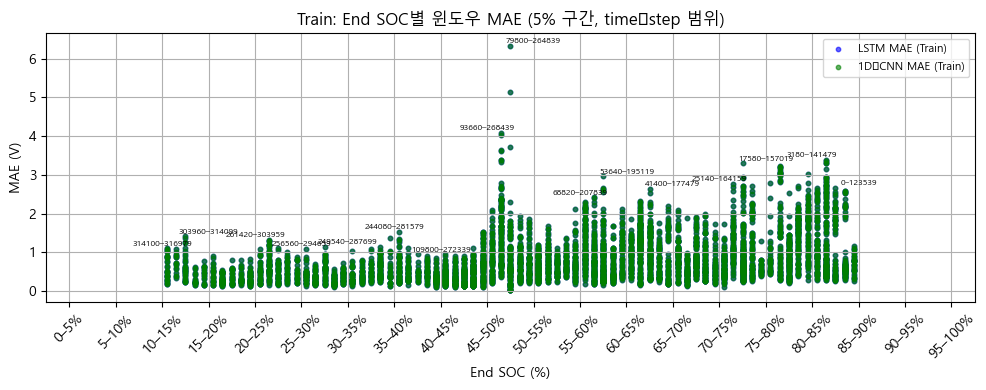

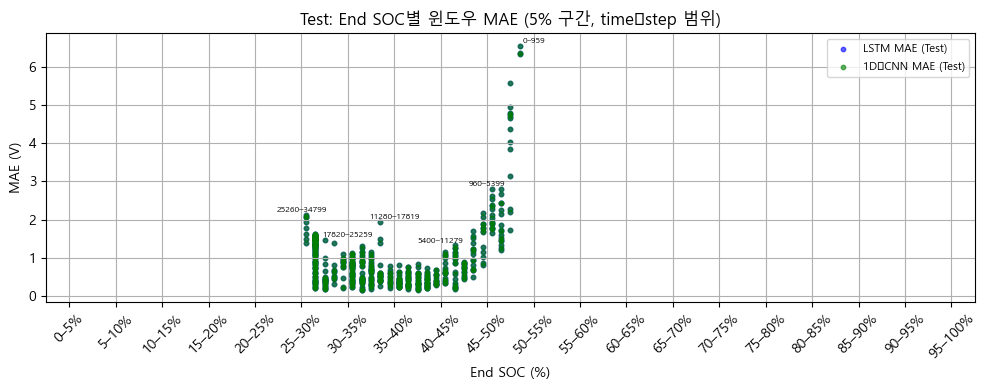

c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:214: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.


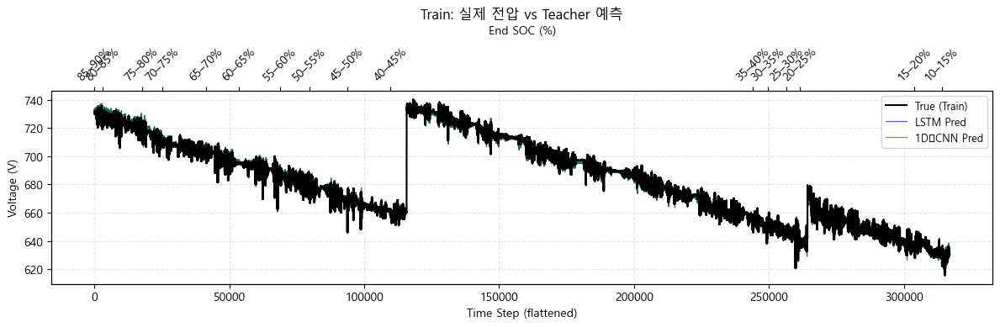

c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:244: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.


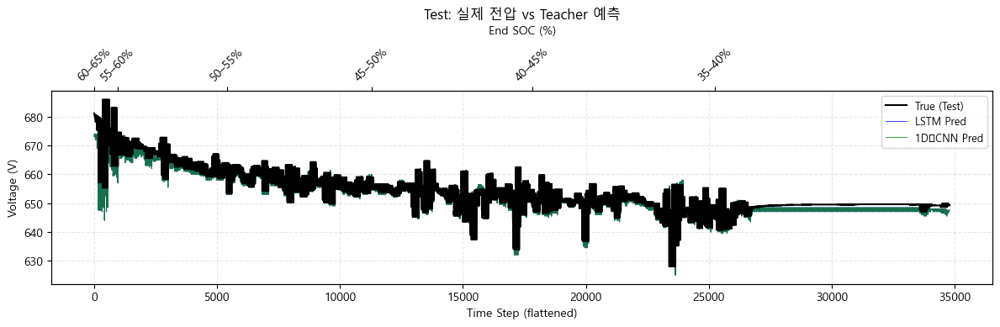

c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:279: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.


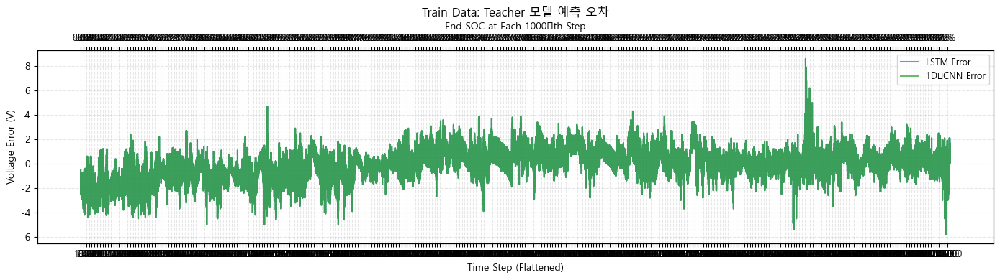

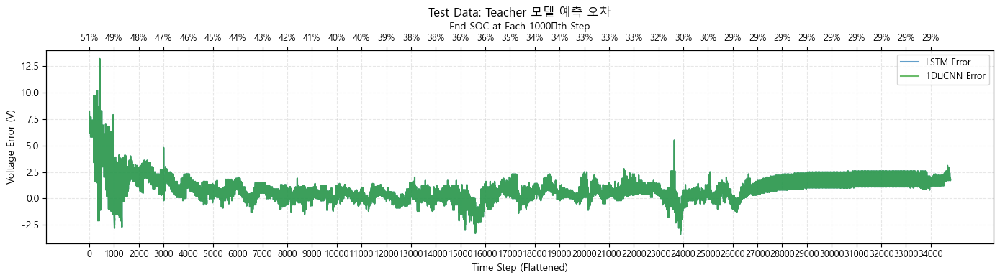

[TRAIN] Time steps 1000–4500:
  ▶ 포함된 윈도우 수       : 60
  ▶ 최솟값 End SOC (％)   : 84.00%
  ▶ 최댓값 End SOC (％)   : 86.00%
[TEST] Time steps 0–17500:
  ▶ 포함된 윈도우 수       : 292
  ▶ 최솟값 End SOC (％)   : 35.00%
  ▶ 최댓값 End SOC (％)   : 51.00%


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# 1) 폰트 파일 경로 – 윈도우의 맑은 고딕
font_path = r"C:\Windows\Fonts\malgun.ttf"
font_prop = fm.FontProperties(fname=font_path)

# 2) 전역 설정 적용
plt.rcParams['font.family'] = font_prop.get_name()
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐 방지

# train/test 데이터의 Teacher 입력/정답 준비
def prepare_teacher_data(seqs):
    X = seqs[..., [0,1,3]]  # Current, SOC, ΔI
    Y = seqs[..., 2:3]      # Voltage
    return X, Y

X_tr, Y_tr = prepare_teacher_data(train_sequences)
X_te, Y_te = prepare_teacher_data(test_sequences)

# 예측
pred_tr_lstm = teacher_lstm.predict(X_tr)
pred_tr_1d   = teacher_1d.predict(X_tr)
pred_te_lstm = teacher_lstm.predict(X_te)
pred_te_1d   = teacher_1d.predict(X_te)

# flatten & denorm
def denorm(arr, idx):
    return arr * (data_max[idx] - data_min[idx] + 1e-7) + data_min[idx]

true_tr = denorm(Y_tr.reshape(-1),    2)
lstm_tr = denorm(pred_tr_lstm.reshape(-1), 2)
cnn1d_tr= denorm(pred_tr_1d.reshape(-1),   2)

true_te = denorm(Y_te.reshape(-1),    2)
lstm_te = denorm(pred_te_lstm.reshape(-1), 2)
cnn1d_te= denorm(pred_te_1d.reshape(-1),   2)

# --- 오차 계산 ---
err_tr_lstm = true_tr - lstm_tr
err_tr_cnn  = true_tr - cnn1d_tr

err_te_lstm = true_te - lstm_te
err_te_cnn  = true_te - cnn1d_te

# Train 전체 시계열
plt.figure(figsize=(14,4))
plt.plot(true_tr,    label="True (Train)",    color='red',    linewidth=2.0, alpha=1.0, zorder=3)
plt.plot(lstm_tr,    label="LSTM Pred",       color='blue',   linewidth=1.0, alpha=0.7, zorder=2)
plt.plot(cnn1d_tr,   label="1D‑CNN Pred",     color='green',  linewidth=1.0, alpha=0.7, zorder=2)
plt.title("Train: 실제 전압 vs Teacher 예측")
plt.xlabel("Time Step (Flattened)")
plt.ylabel("Voltage")
plt.legend(fontsize=9)
plt.tight_layout()

# Test 전체 시계열
plt.figure(figsize=(14,4))
plt.plot(true_te,    label="True (Test)",     color='red',    linewidth=2.0, alpha=1.0, zorder=3)
plt.plot(lstm_te,    label="LSTM Pred",       color='blue',   linewidth=1.0, alpha=0.7, zorder=2)
plt.plot(cnn1d_te,   label="1D‑CNN Pred",     color='green',  linewidth=1.0, alpha=0.7, zorder=2)
plt.title("Test: 실제 전압 vs Teacher 예측")
plt.xlabel("Time Step (Flattened)")
plt.ylabel("Voltage")
plt.legend(fontsize=9)
plt.tight_layout()

plt.show()

# --- 오차 플롯도 색을 바꿔봅니다. ---
plt.figure(figsize=(14,4))
plt.plot(err_tr_lstm, label="LSTM Error (Train)", color='blue',  linewidth=1.0, alpha=0.7)
plt.plot(err_tr_cnn,  label="1D‑CNN Error (Train)", color='green', linewidth=1.0, alpha=0.7)
plt.title("Train Data: Teacher 모델 예측 오차")
plt.xlabel("Time Step (Flattened)")
plt.ylabel("Voltage Error")
plt.legend(fontsize=9)
plt.tight_layout()

plt.figure(figsize=(14,4))
plt.plot(err_te_lstm, label="LSTM Error (Test)",  color='blue',  linewidth=1.0, alpha=0.7)
plt.plot(err_te_cnn,  label="1D‑CNN Error (Test)",color='green', linewidth=1.0, alpha=0.7)
plt.title("Test Data: Teacher 모델 예측 오차")
plt.xlabel("Time Step (Flattened)")
plt.ylabel("Voltage Error")
plt.legend(fontsize=9)
plt.tight_layout()

plt.show()

import numpy as np
import matplotlib.pyplot as plt

# --- 1) 윈도우별 End SOC와 MAE 계산 (이전과 동일) ---
end_soc_tr = denorm(train_sequences[:, -1, 1], 1)
end_soc_te = denorm(test_sequences[:,  -1, 1], 1)

true_tr_mat  = denorm(Y_tr.reshape(-1),    2).reshape(-1, window_size)
lstm_tr_mat  = denorm(pred_tr_lstm.reshape(-1), 2).reshape(-1, window_size)
cnn1d_tr_mat = denorm(pred_tr_1d.reshape(-1),   2).reshape(-1, window_size)

true_te_mat  = denorm(Y_te.reshape(-1),    2).reshape(-1, window_size)
lstm_te_mat  = denorm(pred_te_lstm.reshape(-1), 2).reshape(-1, window_size)
cnn1d_te_mat = denorm(pred_te_1d.reshape(-1),   2).reshape(-1, window_size)

mae_tr_lstm  = np.mean(np.abs(true_tr_mat  - lstm_tr_mat),  axis=1)
mae_tr_cnn   = np.mean(np.abs(true_tr_mat  - cnn1d_tr_mat), axis=1)

mae_te_lstm  = np.mean(np.abs(true_te_mat  - lstm_te_mat),  axis=1)
mae_te_cnn   = np.mean(np.abs(true_te_mat  - cnn1d_te_mat), axis=1)

# --- 2) 각 윈도우의 flattened time-step 범위 계산 ---
n_tr_windows = len(end_soc_tr)
n_te_windows = len(end_soc_te)
start_tr = np.arange(n_tr_windows) * window_size
end_tr   = start_tr + window_size - 1
start_te = np.arange(n_te_windows) * window_size
end_te   = start_te + window_size - 1
import numpy as np
import matplotlib.pyplot as plt

# --- (이전까지 데이터 준비 코드는 그대로) ---

# 5% 단위로 SOC 구간 정의
bins = np.arange(0, 101, 5)
bin_labels = [f"{bins[i]}–{bins[i+1]}%" for i in range(len(bins)-1)]
bin_centers = (bins[:-1] + bins[1:]) / 2.0

# Train
plt.figure(figsize=(10,4))
plt.scatter(end_soc_tr, mae_tr_lstm, color='blue',  s=10, alpha=0.6, label='LSTM MAE (Train)')
plt.scatter(end_soc_tr, mae_tr_cnn,  color='green', s=10, alpha=0.6, label='1D‑CNN MAE (Train)')

for i in range(len(bins)-1):
    lo, hi = bins[i], bins[i+1]
    mask = (end_soc_tr >= lo) & (end_soc_tr < hi)
    if mask.any():
        min_idx = start_tr[mask].min()
        max_idx = end_tr[mask].max()
        y_pos = max(mae_tr_lstm[mask].max(), mae_tr_cnn[mask].max()) + 0.02  # 조금 위로 띄워
        plt.text(bin_centers[i], y_pos,
                 f"{min_idx}–{max_idx}",
                 fontsize=6, ha='center', va='bottom')

plt.xticks(bin_centers, bin_labels, rotation=45)
plt.xlim(0,100)
plt.title("Train: End SOC별 윈도우 MAE (5% 구간, time‑step 범위)")
plt.xlabel("End SOC (%)")
plt.ylabel("MAE (V)")
plt.legend(fontsize=8)
plt.grid(True)
plt.tight_layout()

# Test
plt.figure(figsize=(10,4))
plt.scatter(end_soc_te, mae_te_lstm, color='blue',  s=10, alpha=0.6, label='LSTM MAE (Test)')
plt.scatter(end_soc_te, mae_te_cnn,  color='green', s=10, alpha=0.6, label='1D‑CNN MAE (Test)')

for i in range(len(bins)-1):
    lo, hi = bins[i], bins[i+1]
    mask = (end_soc_te >= lo) & (end_soc_te < hi)
    if mask.any():
        min_idx = start_te[mask].min()
        max_idx = end_te[mask].max()
        y_pos = max(mae_te_lstm[mask].max(), mae_te_cnn[mask].max()) + 0.02
        plt.text(bin_centers[i], y_pos,
                 f"{min_idx}–{max_idx}",
                 fontsize=6, ha='center', va='bottom')

plt.xticks(bin_centers, bin_labels, rotation=45)
plt.xlim(0,100)
plt.title("Test: End SOC별 윈도우 MAE (5% 구간, time‑step 범위)")
plt.xlabel("End SOC (%)")
plt.ylabel("MAE (V)")
plt.legend(fontsize=8)
plt.grid(True)
plt.tight_layout()

plt.show()

fig, ax = plt.subplots(figsize=(12,4))
ax.plot(true_tr,    label="True (Train)",    color='black', linewidth=1.5, zorder=3)
ax.plot(lstm_tr,    label="LSTM Pred",       color='blue',  linewidth=0.8, alpha=0.7, zorder=2)
ax.plot(cnn1d_tr,   label="1D‑CNN Pred",     color='green', linewidth=0.8, alpha=0.7, zorder=2)
ax.set_xlabel("Time Step (flattened)")
ax.set_ylabel("Voltage (V)")
ax.set_title("Train: 실제 전압 vs Teacher 예측")
ax.legend(loc='upper right', fontsize=9)
ax.grid(True, linestyle='--', alpha=0.3)

# 위쪽 x축에 SOC 표시
ax2 = ax.twiny()
# 5% 구간별로 표시할 tick 위치(최소 time-step)와 레이블(SOC)
bins = np.arange(0,101,5)
bin_labels = [f"{bins[i]}–{bins[i+1]}%" for i in range(len(bins)-1)]
tick_positions = []
for lo, hi in zip(bins[:-1], bins[1:]):
    mask = (end_soc_tr >= lo) & (end_soc_tr < hi)
    if mask.any():
        tick_positions.append(start_tr[mask].min())  # 해당 구간 첫 윈도우의 time-step index
    else:
        tick_positions.append(np.nan)

# nan 제거
tick_positions, bin_labels = zip(*[(p,lab) for p,lab in zip(tick_positions,bin_labels) if not np.isnan(p)])

ax2.set_xticks(tick_positions)
ax2.set_xticklabels(bin_labels, rotation=45)
ax2.set_xlim(ax.get_xlim())
ax2.set_xlabel("End SOC (%)", labelpad=10)

plt.tight_layout()
plt.show()


# --- Test 데이터에 대해서도 동일하게 ---
fig, ax = plt.subplots(figsize=(12,4))
ax.plot(true_te,    label="True (Test)",     color='black', linewidth=1.5, zorder=3)
ax.plot(lstm_te,    label="LSTM Pred",       color='blue',  linewidth=0.8, alpha=0.7, zorder=2)
ax.plot(cnn1d_te,   label="1D‑CNN Pred",     color='green', linewidth=0.8, alpha=0.7, zorder=2)
ax.set_xlabel("Time Step (flattened)")
ax.set_ylabel("Voltage (V)")
ax.set_title("Test: 실제 전압 vs Teacher 예측")
ax.legend(loc='upper right', fontsize=9)
ax.grid(True, linestyle='--', alpha=0.3)

ax2 = ax.twiny()
tick_positions = []
for lo, hi in zip(bins[:-1], bins[1:]):
    mask = (end_soc_te >= lo) & (end_soc_te < hi)
    if mask.any():
        tick_positions.append(start_te[mask].min())
    else:
        tick_positions.append(np.nan)
tick_positions, bin_labels = zip(*[(p,lab) for p,lab in zip(tick_positions,bin_labels) if not np.isnan(p)])

ax2.set_xticks(tick_positions)
ax2.set_xticklabels(bin_labels, rotation=45)
ax2.set_xlim(ax.get_xlim())
ax2.set_xlabel("End SOC (%)", labelpad=10)

plt.tight_layout()
plt.show()

import numpy as np
import matplotlib.pyplot as plt

def plot_errors_with_soc(err_lstm, err_cnn, end_soc, window_size, title):
    t = np.arange(len(err_lstm))

    fig, ax = plt.subplots(figsize=(14, 4))
    ax.plot(t, err_lstm, label='LSTM Error',   color='tab:blue',  alpha=0.7)
    ax.plot(t, err_cnn,  label='1D‑CNN Error', color='tab:green', alpha=0.7)
    ax.set_title(title, fontsize=12)
    ax.set_xlabel('Time Step (Flattened)', fontsize=10)
    ax.set_ylabel('Voltage Error (V)',      fontsize=10)
    ax.legend(loc='upper right', fontsize=9)
    ax.grid(True, linestyle='--', alpha=0.3)

    # 아래축: 0, 1000, 2000, ... 단위로 눈금
    xt = np.arange(0, len(t), 1000)
    ax.set_xticks(xt)
    ax.set_xticklabels(xt, rotation=0, fontsize=9)

    # 윗축: 위와 동일한 위치에 End SOC 표시
    ax2 = ax.twiny()
    ax2.set_xlim(ax.get_xlim())
    # 윗축 눈금 위치를 아래축 xt와 동일하게
    ax2.set_xticks(xt)
    # 각 xt 위치의 윈도우 인덱스 계산
    win_idx = (xt // window_size).clip(0, len(end_soc)-1)
    # 대응하는 SOC 라벨
    soc_labels = [f"{end_soc[i]:.0f}%" for i in win_idx]
    ax2.set_xticklabels(soc_labels, fontsize=9)
    ax2.set_xlabel('End SOC at Each 1000‑th Step', fontsize=10)

    plt.tight_layout()
    plt.show()

# --- 호출 예시 ---

# Train 에러
plot_errors_with_soc(
    err_tr_lstm, err_tr_cnn, end_soc_tr, window_size,
    title="Train Data: Teacher 모델 예측 오차"
)

# Test 에러
plot_errors_with_soc(
    err_te_lstm, err_te_cnn, end_soc_te, window_size,
    title="Test Data: Teacher 모델 예측 오차"
)

def print_soc_in_range(start_ts, end_ts, mode='train'):
    """
    start_ts, end_ts: flattened time‑step 구간 (inclusive)
    mode: 'train' 또는 'test'

    내부적으로 아래 변수들을 사용합니다:
      - train: start_tr, end_tr, end_soc_tr
      - test : start_te, end_te, end_soc_te
    """
    if mode == 'train':
        starts = start_tr
        ends   = end_tr
        socs   = end_soc_tr
    elif mode == 'test':
        starts = start_te
        ends   = end_te
        socs   = end_soc_te
    else:
        raise ValueError("mode must be 'train' or 'test'")

    # 윈도우가 query 구간과 겹치는 조건:
    # starts <= end_ts AND ends >= start_ts
    mask = (starts <= end_ts) & (ends >= start_ts)
    sel_socs = socs[mask]

    if sel_socs.size > 0:
        print(f"[{mode.upper()}] Time steps {start_ts}–{end_ts}:")
        print(f"  ▶ 포함된 윈도우 수       : {sel_socs.size}")
        print(f"  ▶ 최솟값 End SOC (％)   : {sel_socs.min():.2f}%")
        print(f"  ▶ 최댓값 End SOC (％)   : {sel_socs.max():.2f}%")
    else:
        print(f"[{mode.upper()}] Time steps {start_ts}–{end_ts}: 겹치는 윈도우가 없습니다.")

# --- 사용 예시 ---
# train 구간 4000~4500
print_soc_in_range(1000, 4500, mode='train')

# test 구간 1000~1500
print_soc_in_range(000, 17500, mode='test')


In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Reshape, LeakyReLU, Conv1D, Input, Concatenate, Flatten
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.optimizers import Adam

# ------------------------------
# Hyper Parameters
# ------------------------------
feature_dim = 4        # [전류, SOC, 전압, ΔI]
latent_dim = 5         # 노이즈 차원
batch_size = 64
epochs = 5000
n_critic = 5
lambda_gp = 15.0
learning_rate = 2e-4

tf.keras.mixed_precision.set_global_policy('mixed_float16')

# Global batch counter for mode seeking loss
global_batch_counter = tf.Variable(0, trainable=False, dtype=tf.int32)

# ------------------------------
# Adaptive Teacher Loss Weighting Parameters (alpha, beta)
# ------------------------------
alpha = 5.0  # 초기 teacher loss weight 1 (1-D CNN)
beta  = 5.0  # 초기 teacher loss weight 2 (LSTM)
# target_teacher_loss = 0.03
# adjust_rate = 0.05  # 5% 조정

offset_lambda = 10.0  # Offset Loss에 곱할 가중치(필요에 따라 조절)

# ------------------------------
# Adaptive Gamma (ms_loss) and Seta (cond_loss) Parameters
# 총합이 2.0이 되도록 (균형이면 각각 1.0)
# ------------------------------
global_gamma = 1.0  # 초기 값
global_seta  = 1.0  # 초기 값
eps_balance = 1e-7  # 분모 안정화를 위한 상수

# ------------------------------
# 데이터 및 스케일러 (all_sequences, data_min, data_max) 는 이미 정의되어 있다고 가정
# 예: all_sequences.shape = (N, window_size, 4)
# window_size는 전역 변수로 정의됨

# ------------------------------
# Teacher 모델 (이미 학습되어 있고 freeze 상태)
# ------------------------------
# teacher_model = teacher_1d      # 1-D CNN Teacher
teacher_model = teacher_lstm
teacher_model_2 = teacher_lstm  # LSTM Teacher
teacher_model.trainable = False
teacher_model_2.trainable = False

def offset_loss(fake_series, real_series):
    """
    fake_series와 real_series에서 전압(인덱스 2) 채널에 대해서만
    전체 평균 차이를 제곱 오차로 계산하는 함수.
    fake_series, real_series shape: (batch, window_size, 4)
    """
    # 데이터 타입 정합: mixed precision 사용 시 발생할 수 있는 문제 해결
    real_series = tf.cast(real_series, fake_series.dtype)

    # 전압 채널만 추출 (인덱스 2)
    fake_voltage = fake_series[..., 2]  # shape: (batch, window_size)
    real_voltage = real_series[..., 2]  # shape: (batch, window_size)

    # 각 배치별로 전압의 평균을 계산 (각 샘플당 평균 전압)
    fake_voltage_mean = tf.reduce_mean(fake_voltage, axis=1, keepdims=True)  # (batch, 1)
    real_voltage_mean = tf.reduce_mean(real_voltage, axis=1, keepdims=True)  # (batch, 1)

    # 평균 전압 차이의 제곱 오차의 평균 (전체 배치 평균)
    return tf.reduce_mean(tf.abs(fake_voltage_mean - real_voltage_mean))

# ------------------------------
# Intermediate Teacher Models (추출: layer3 and layer4 outputs)
# ------------------------------
# teacher_model_intermediate = Model(
#     inputs=teacher_model.input,
#     outputs=[teacher_model.layers[3].output, teacher_model.layers[4].output],
#     name="Teacher_LSTM_Intermediate"
# )
teacher_model_2_intermediate = Model(
    inputs=teacher_model_2.input,
    outputs=[teacher_model_2.layers[4].output, teacher_model_2.layers[5].output],
    name="Teacher_LSTM2_Intermediate"
)

# ------------------------------
# Gradient Penalty 함수 (WGAN-GP)
# ------------------------------
@tf.function
def gradient_penalty(discriminator, real_samples, fake_samples):
    fake_samples = tf.cast(fake_samples, real_samples.dtype)
    b = tf.shape(real_samples)[0]
    alpha_gp = tf.random.uniform([b, 1, 1], 0.0, 1.0, dtype=real_samples.dtype)
    interpolated = alpha_gp * real_samples + (1 - alpha_gp) * fake_samples
    with tf.GradientTape() as gp_tape:
        gp_tape.watch(interpolated)
        pred = discriminator(interpolated, training=True)
    grads = gp_tape.gradient(pred, [interpolated])[0]
    grad_norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2]))
    gp = tf.reduce_mean((grad_norm - 1.0) ** 2)
    return gp

# ------------------------------
# Generator 모델
# ------------------------------
def get_condition(real_series):
    # real_series: (batch, window_size, feature_dim) → [전류, SOC, 전압, ΔI]
    # 윈도우의 마지막 SOC 값을 조건으로 복제
    soc = real_series[:, -1, 1]        # (batch,)
    soc = tf.expand_dims(soc, axis=1)    # (batch, 1)
    soc = tf.tile(soc, [1, window_size]) # (batch, window_size)
    soc = tf.expand_dims(soc, axis=-1)   # (batch, window_size, 1)
    return soc

def build_generator_cond(latent_dim, window_size):
    # 노이즈 입력: (window_size, latent_dim)
    noise_inp = Input(shape=(window_size, latent_dim))
    # 조건 입력: (window_size, 1)
    cond_inp = Input(shape=(window_size, 1))

    # Concatenate noise와 조건
    x = Concatenate(axis=-1)([noise_inp, cond_inp])  # (window_size, latent_dim+1)

    # 여러 개의 1D Conv 블록
    x = Conv1D(filters=64, kernel_size=3, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv1D(filters=64, kernel_size=3, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv1D(filters=64, kernel_size=3, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv1D(filters=64, kernel_size=3, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv1D(filters=64, kernel_size=3, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    # 최종 출력: 각 타임스텝마다 3개 값: [전류, ΔI, 전압]
    out = Dense(3, activation='sigmoid')(x)

    model = Model([noise_inp, cond_inp], out, name="Generator_1D")
    return model

def combine_output(dynamic, cond):
    # Generator의 출력(dynamic): (batch, window_size, 3) → [전류, ΔI, 전압]
    # cond: (batch, window_size, 1) → SOC
    current = dynamic[..., 0]    # 전류
    delta_i = dynamic[..., 1]    # ΔI
    voltage = dynamic[..., 2]    # 전압
    # cond를 dynamic과 동일한 dtype로 캐스팅
    soc = tf.cast(cond[..., 0], dynamic.dtype)
    # 최종 순서: [전류, SOC, 전압, ΔI]
    final = tf.stack([current, soc, voltage, delta_i], axis=-1)
    return final

generator_cond = build_generator_cond(latent_dim, window_size)

# ------------------------------
# Discriminator 모델
# ------------------------------
def build_discriminator(window_size):
    inp = Input(shape=(window_size, 3))  # [전류, ΔI, 전압]
    x = Conv1D(filters=32, kernel_size=3, padding='same')(inp)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv1D(filters=16, kernel_size=3, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv1D(filters=16, kernel_size=3, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Flatten()(x)
    out = Dense(1)(x)
    model = Model(inp, out, name="Discriminator_1D")
    return model

discriminator = build_discriminator(window_size)

# ------------------------------
# Optimizers and Dataset
# ------------------------------
generator_optimizer = Adam(learning_rate=learning_rate, beta_1=0.5, beta_2=0.9)
discriminator_optimizer = Adam(learning_rate=learning_rate, beta_1=0.5, beta_2=0.9)
dataset = tf.data.Dataset.from_tensor_slices(all_sequences.astype('float32')) \
            .shuffle(buffer_size=1024).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# ------------------------------
# denorm 함수 (전류: index=0, SOC: 1, 전압: 2, ΔI: 3)
# ------------------------------
def denorm_feature(arr, feature_index):
    return arr * (data_max[feature_index] - data_min[feature_index] + 1e-7) + data_min[feature_index]

# ------------------------------
# Correlation 기반 Mode Seeking Loss 함수
# ------------------------------
def correlation_coeff_batch(x, y, eps):
    x = tf.cast(x, eps.dtype)
    y = tf.cast(y, eps.dtype)
    x_mean = tf.reduce_mean(x, axis=1, keepdims=True)
    y_mean = tf.reduce_mean(y, axis=1, keepdims=True)
    cov = tf.reduce_mean((x - x_mean) * (y - y_mean), axis=1)
    std_x = tf.math.reduce_std(x, axis=1)
    std_y = tf.math.reduce_std(y, axis=1)
    corr = cov / (std_x * std_y + eps)
    return corr

# def mode_seeking_loss_corr(generator, cond, batch_size, latent_dim, window_size): #Correlation based mode seeking loss
#     eps = tf.cast(1e-7, cond.dtype)
#     noise1 = tf.random.normal([batch_size, window_size, latent_dim], dtype=cond.dtype)
#     noise2 = tf.random.normal([batch_size, window_size, latent_dim], dtype=cond.dtype)

#     out1 = combine_output(generator([noise1, cond], training=True), cond)
#     out2 = combine_output(generator([noise2, cond], training=True), cond)

#     out1_current = out1[..., 0]
#     out2_current = out2[..., 0]

#     corr = correlation_coeff_batch(out1_current, out2_current, eps)
#     loss = tf.reduce_mean(tf.abs(corr))
#     return loss

# def mode_seeking_loss_corr(generator, cond, batch_size, latent_dim, window_size): ######Differential Current MS GAN
#     noise1 = tf.random.normal([batch_size, window_size, latent_dim], dtype=cond.dtype)
#     noise2 = tf.random.normal([batch_size, window_size, latent_dim], dtype=cond.dtype)

#     out1 = combine_output(generator([noise1, cond], training=True), cond)
#     out2 = combine_output(generator([noise2, cond], training=True), cond)

#     out1_current = out1[..., 0]
#     out2_current = out2[..., 0]

#     diff1 = out1_current[:, 1:] - out1_current[:, :-1]
#     diff2 = out2_current[:, 1:] - out2_current[:, :-1]

#     loss = tf.reduce_mean(tf.abs(diff1 - diff2))

#     # 🔧 dtype 맞춰주기
#     return tf.cast(loss, cond.dtype)

# def mode_seeking_loss_corr(generator, cond, batch_size, latent_dim, window_size): # Correlation with Smoothing
#     eps = tf.cast(1e-7, cond.dtype)
#     smoothness_lambda = 0.5  # 🔧 튀는 정도를 얼마나 억제할지 조절 (0.0 ~ 1.0 사이 추천)

#     noise1 = tf.random.normal([batch_size, window_size, latent_dim], dtype=cond.dtype)
#     noise2 = tf.random.normal([batch_size, window_size, latent_dim], dtype=cond.dtype)

#     out1 = combine_output(generator([noise1, cond], training=True), cond)
#     out2 = combine_output(generator([noise2, cond], training=True), cond)

#     out1_current = out1[..., 0]  # (batch, window_size)
#     out2_current = out2[..., 0]

#     # (1) Correlation 기반 loss (다양성 유도)
#     corr = correlation_coeff_batch(out1_current, out2_current, eps)
#     corr_loss = tf.reduce_mean(tf.abs(corr))  # 기존과 동일

#     # (2) Smoothness Loss (Spike 방지용)
#     deriv1 = out1_current[:, 1:] - out1_current[:, :-1]
#     deriv2 = out2_current[:, 1:] - out2_current[:, :-1]

#     smoothness_loss = (tf.reduce_mean(tf.square(deriv1)) + tf.reduce_mean(tf.square(deriv2))) / 2.0

#     # (3) Hybrid Loss 구성
#     loss = corr_loss + smoothness_lambda * smoothness_loss
#     return tf.cast(loss, cond.dtype)

def mode_seeking_loss_corr(generator, cond, batch_size, latent_dim, window_size): ## Original MS
    dtype = cond.dtype
    eps = tf.cast(1e-7, dtype)

    noise1 = tf.random.normal([batch_size, window_size, latent_dim], dtype=dtype)
    noise2 = tf.random.normal([batch_size, window_size, latent_dim], dtype=dtype)

    out1 = combine_output(generator([noise1, cond], training=True), cond)
    out2 = combine_output(generator([noise2, cond], training=True), cond)

    current1 = tf.cast(out1[..., 0], dtype)  # (batch, window_size)
    current2 = tf.cast(out2[..., 0], dtype)

    delta_x = tf.reduce_mean(tf.abs(current1 - current2), axis=1)        # (batch,)
    delta_z = tf.reduce_mean(tf.abs(noise1 - noise2), axis=[1, 2])       # (batch,)

    ratio = delta_x / (delta_z + eps)                                    # (batch,)
    # ratio = delta_x
    loss = tf.reduce_mean(1.0 / (ratio + eps)) * 0.03                   # MSGAN style

    return tf.cast(loss, dtype)

# ------------------------------
# Condition-based Mode Seeking Loss 함수
# ------------------------------

def condition_mode_seeking_loss(generator, real_series, latent_dim, window_size):
    eps = tf.cast(1e-7, real_series.dtype)
    b = tf.shape(real_series)[0]
    num_pairs = b // 4
    indices = tf.random.shuffle(tf.range(b))
    selected_indices = indices[:2 * num_pairs]
    pair_indices = tf.reshape(selected_indices, (num_pairs, 2))

    def compute_pair_corr(pair):
        i = pair[0]
        j = pair[1]
        cond_i = get_condition(tf.expand_dims(real_series[i], axis=0))
        cond_j = get_condition(tf.expand_dims(real_series[j], axis=0))
        noise = tf.random.normal([1, window_size, latent_dim], dtype=real_series.dtype)
        out_i = combine_output(generator([noise, cond_i], training=True), cond_i)
        out_j = combine_output(generator([noise, cond_j], training=True), cond_j)
        current_i = out_i[..., 0]
        current_j = out_j[..., 0]
        corr = correlation_coeff_batch(current_i, current_j, eps)
        return tf.squeeze(tf.abs(corr), axis=0)

    pair_corrs = tf.map_fn(compute_pair_corr, pair_indices,
                            fn_output_signature=tf.TensorSpec(shape=(), dtype=real_series.dtype))
    loss = tf.reduce_mean(pair_corrs)
    return loss

# ------------------------------
# Training Step
# ------------------------------
# ΔI 채널만을 위한 역정규화 함수 (전류 채널의 범위만 사용; offset 없음)
def denorm_delta(tensor):
    return tensor * (data_max[0] - data_min[0] + 1e-7)

# 기존 역정규화 함수: 전류, SOC, 전압 등 (채널 0,1,2)
def denorm_feature(arr, feature_index):
    return arr * (data_max[feature_index] - data_min[feature_index] + 1e-7) + data_min[feature_index]

@tf.function
def train_step(real_series):
    # real_series: (batch, window_size, 4) → [전류, SOC, 전압, ΔI]
    cond = get_condition(real_series)  # (batch, window_size, 1)

    noise = tf.random.normal([tf.shape(real_series)[0], window_size, latent_dim],
                               dtype=real_series.dtype)
    latent_fake = generator_cond([noise, cond], training=True)
    fake_series = combine_output(latent_fake, cond)  # (batch, window_size, 4)

    # Discriminator expects input shape: (batch, window_size, 3)
    fake_for_disc = tf.stack([fake_series[..., 0],
                              fake_series[..., 3],
                              fake_series[..., 2]], axis=-1)
    real_for_disc = tf.stack([real_series[..., 0],
                              real_series[..., 3],
                              real_series[..., 2]], axis=-1)

    # ----- (1) Discriminator Update -----
    with tf.GradientTape() as tape:
        d_real = discriminator(real_for_disc, training=True)
        d_fake = discriminator(fake_for_disc, training=True)
        d_loss = tf.reduce_mean(d_fake) - tf.reduce_mean(d_real)
        gp = gradient_penalty(discriminator, real_for_disc, fake_for_disc)
        d_loss_total = d_loss + tf.cast(lambda_gp, d_loss.dtype) * tf.cast(gp, d_loss.dtype)
    gradients = tape.gradient(d_loss_total, discriminator.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(gradients, discriminator.trainable_variables))

    # ----- (2) Generator Update -----
    noise = tf.random.normal([tf.shape(real_series)[0], window_size, latent_dim],
                               dtype=real_series.dtype)
    with tf.GradientTape() as tape:
        latent_fake = generator_cond([noise, cond], training=True)
        fake_series = combine_output(latent_fake, cond)

        # Discriminator input reconstruction
        fake_for_disc = tf.stack([fake_series[..., 0],
                                  fake_series[..., 3],
                                  fake_series[..., 2]], axis=-1)
        d_fake = discriminator(fake_for_disc, training=True)
        g_adv_loss = -tf.reduce_mean(d_fake)

        # ----- Teacher Loss -----
        teacher_input_fake = tf.concat([
            fake_series[..., :1],                # 전류
            tf.cast(cond, fake_series.dtype),     # SOC
            fake_series[..., 3:4]                  # ΔI
        ], axis=-1)
        teacher_input_real = tf.concat([
            real_series[..., :1],
            tf.cast(get_condition(real_series), real_series.dtype),
            real_series[..., 3:4]
        ], axis=-1)
        teacher_features_fake = teacher_model_2_intermediate(teacher_input_fake, training=False)
        teacher_features_real = teacher_model_2_intermediate(teacher_input_real, training=False)
        teacher_loss = tf.reduce_mean(tf.abs(teacher_features_fake[0] - teacher_features_real[0]))
        teacher_loss_2 = tf.reduce_mean(tf.abs(teacher_features_fake[1] - teacher_features_real[1]))

        # ----- Mode Seeking Loss -----
        ms_loss = tf.cond(
            tf.equal(tf.math.mod(global_batch_counter, 1), 0),
            lambda: mode_seeking_loss_corr(generator_cond, cond, tf.shape(real_series)[0],
                                           latent_dim, window_size),
            lambda: tf.cast(0.0, real_series.dtype)
        )

        # ----- Condition-based Mode Seeking Loss -----
        cond_loss = tf.cond(
            tf.equal(tf.math.mod(global_batch_counter, 1), 0),
            lambda: condition_mode_seeking_loss(generator_cond, real_series, latent_dim, window_size),
            lambda: tf.cast(0.0, real_series.dtype)
        )

        # ----- Offset Loss -----
        offset_loss_val = offset_loss(fake_series, real_series)

        # ----- (수정된) Consistency Loss -----
        # 여기서, Generator가 출력한 전류와 ΔI를 각각 역정규화한 후, 전류의 차분과 ΔI를 동일 단위에서 비교한다.
        # 먼저, 전류 채널(인덱스 0)을 역정규화
        current_denorm = denorm_feature(fake_series[..., 0], 0)
        # computed ΔI (denorm 후 전류 차분)
        computed_delta_denorm = current_denorm[:, 1:] - current_denorm[:, :-1]
        # Generator가 출력한 ΔI 채널(인덱스 3)을 별도의 ΔI 역정규화 함수로 적용 (offset 없이 scaling)
        generated_delta_denorm = denorm_feature(fake_series[..., 3], 3)[:, 1:]
        consistency_loss = tf.reduce_mean(tf.abs(computed_delta_denorm - generated_delta_denorm))
        lambda_consistency = 1.0

        # 최종 Generator Loss
        g_loss_total = (
            g_adv_loss +
            tf.cast(alpha * teacher_loss, g_adv_loss.dtype) +
            tf.cast(beta * teacher_loss_2, g_adv_loss.dtype) +
            tf.cast(global_gamma * ms_loss, g_adv_loss.dtype) +
            tf.cast(global_seta * cond_loss, g_adv_loss.dtype) +
            tf.cast(offset_lambda * offset_loss_val, g_adv_loss.dtype) +
            tf.cast(lambda_consistency * consistency_loss, g_adv_loss.dtype)
        )

    gradients = tape.gradient(g_loss_total, generator_cond.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients, generator_cond.trainable_variables))

    global_batch_counter.assign_add(1)

    return (d_loss, g_loss_total, gp, teacher_loss, teacher_loss_2,
            ms_loss, g_adv_loss, cond_loss, offset_loss_val, consistency_loss)





Epoch 0 | lr: 0.000200 | D_Loss: 0.0665, GP: 0.2175, G_tot_Loss: 9.5703 | Adv Loss: 0.5698 | T_Loss1: 0.0509, T_Loss2: 0.0487 | MS_Loss: 1.3676 | Cond_Loss: 0.9962 | Consistency_Loss: 4.1367 | Offset_Loss: 0.1986 | alpha: 5.0000, beta: 5.0000 | gamma: 1.1571, seta: 0.8429
Epoch 500 | lr: 0.000181 | D_Loss: -0.1604, GP: 0.0007, G_tot_Loss: -0.5996 | Adv Loss: -1.9805 | T_Loss1: 0.0292, T_Loss2: 0.0219 | MS_Loss: 0.5176 | Cond_Loss: 0.3067 | Consistency_Loss: 0.1930 | Offset_Loss: 0.0109 | alpha: 3.8516, beta: 3.4160 | gamma: 1.2558, seta: 0.7442
Epoch 1000 | lr: 0.000155 | D_Loss: -0.1699, GP: 0.0008, G_tot_Loss: 0.8232 | Adv Loss: -0.5093 | T_Loss1: 0.0296, T_Loss2: 0.0222 | MS_Loss: 0.5059 | Cond_Loss: 0.2839 | Consistency_Loss: 0.1770 | Offset_Loss: 0.0106 | alpha: 3.8770, beta: 3.4336 | gamma: 1.2811, seta: 0.7189
Epoch 1500 | lr: 0.000140 | D_Loss: -0.1729, GP: 0.0009, G_tot_Loss: 2.4922 | Adv Loss: 1.1904 | T_Loss1: 0.0294, T_Loss2: 0.0222 | MS_Loss: 0.5054 | Cond_Loss: 0.2602 | C

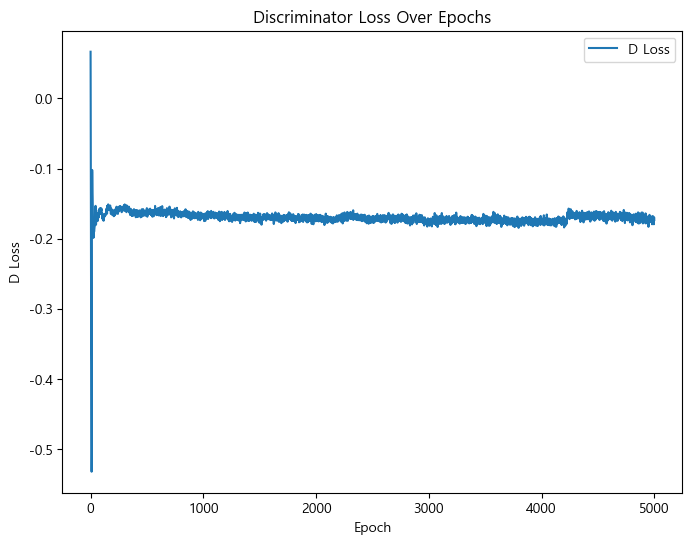

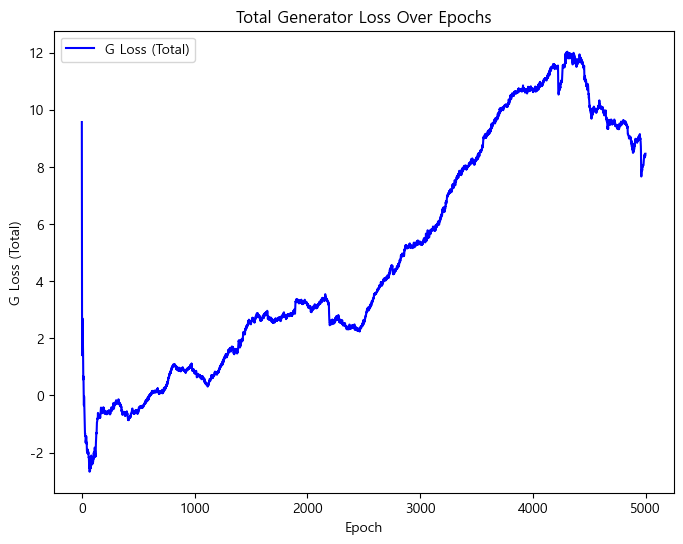

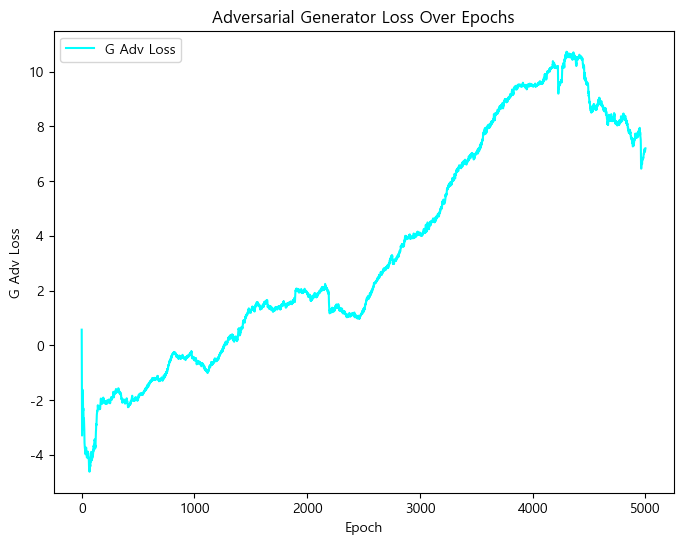

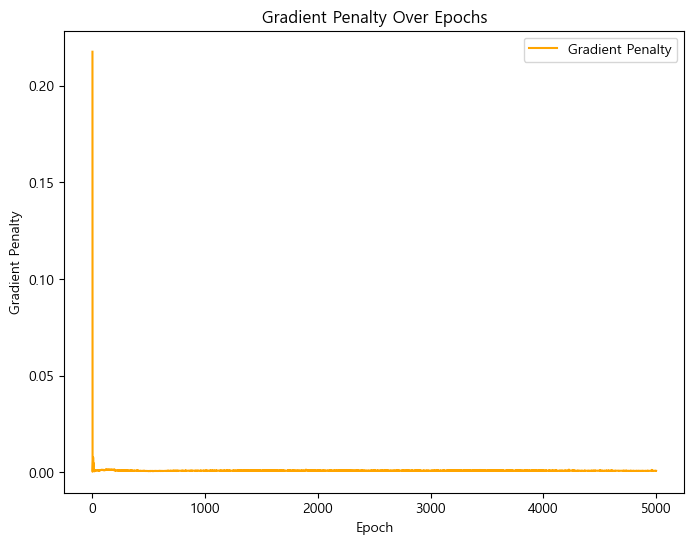

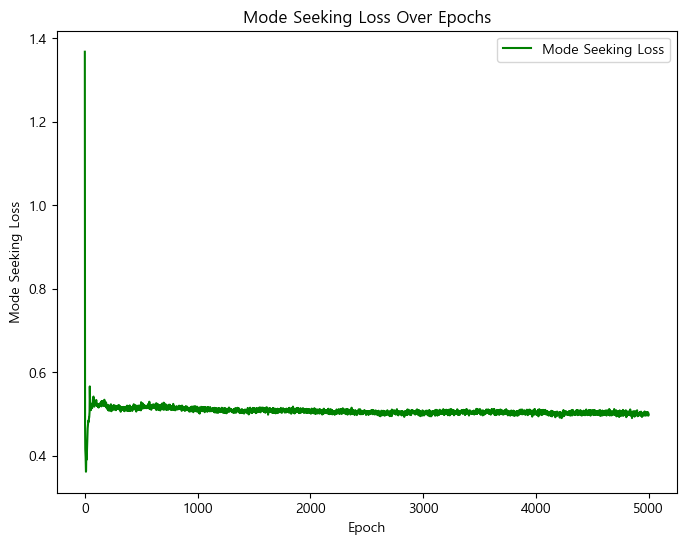

...

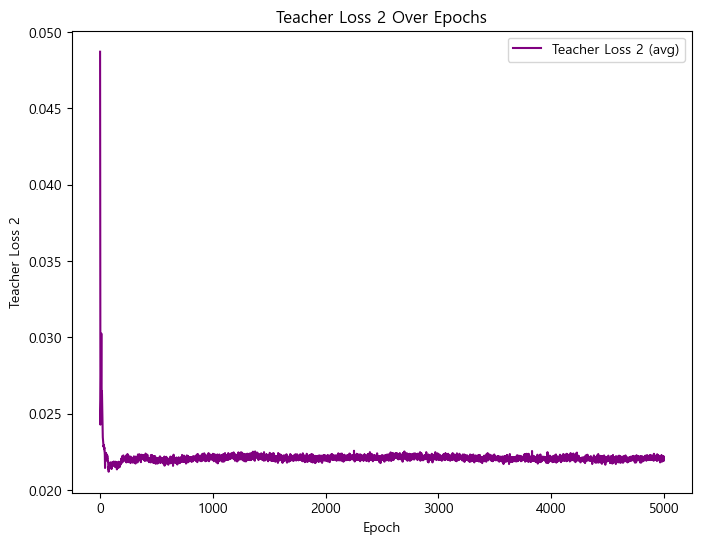

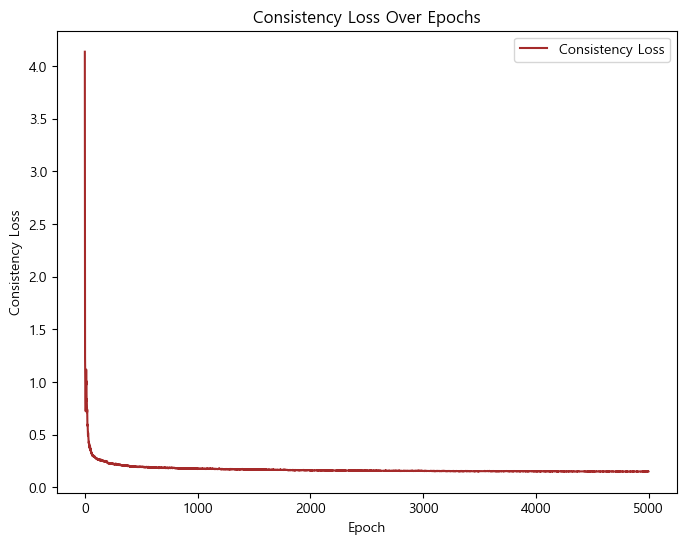

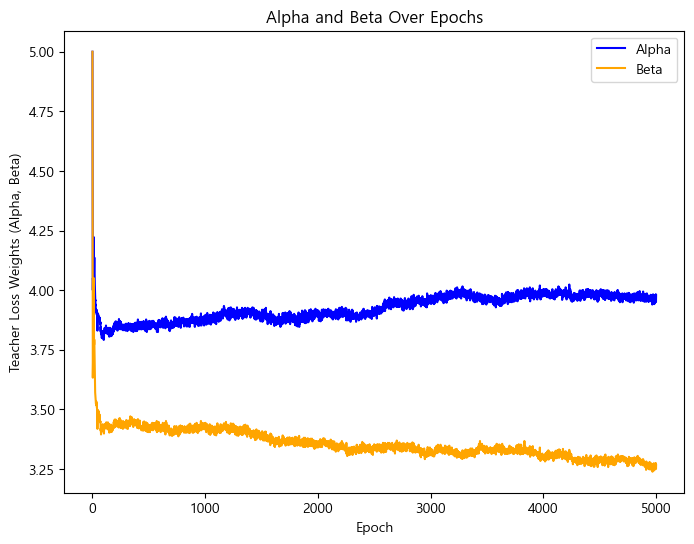

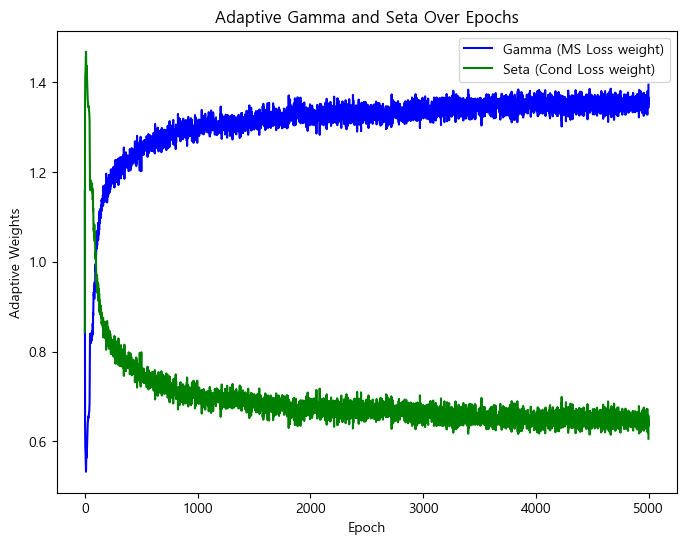

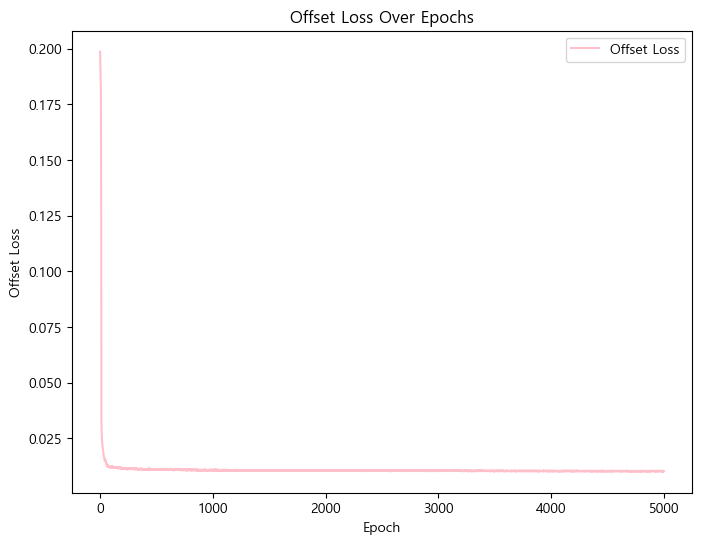

In [ ]:
# ------------------------------
# Training Loop with Adaptive Updates (Consistency Loss 추가)
# ------------------------------
initial_lr = learning_rate
decay_rate = 0.95
epoch_decay = 200

epoch_list = []
lr_list = []
d_loss_list = []
gp_list = []
g_loss_list = []
teacher_loss1_avg_list = []
teacher_loss2_avg_list = []
ms_loss_list = []
g_adv_loss_list = []
cond_loss_list = []
gamma_list = []
seta_list = []
offset_loss_list = []
consistency_loss_list = []  # Consistency Loss 저장 리스트

# 초기 이전 Teacher Loss 값 설정
prev_teacher_loss1 = 1.0
prev_teacher_loss2 = 1.0

checkpoint_dir = r"C:\Users\user\Desktop\JANG\code\AI\250420"

if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

global alpha, beta, global_gamma, global_seta
alpha_list = []
beta_list = []

for epoch in range(epochs):
    if epoch % epoch_decay == 0 and epoch != 0:
        new_lr = initial_lr * (decay_rate ** (epoch // epoch_decay))
        generator_optimizer.learning_rate.assign(new_lr)
        discriminator_optimizer.learning_rate.assign(new_lr)

    total_d = total_g = total_gp = 0.0
    total_teacher_loss1 = total_teacher_loss2 = 0.0
    total_ms_loss = total_g_adv_loss = total_cond_loss = 0.0
    total_offset_loss = 0.0
    total_consistency_loss = 0.0  # Consistency Loss 누적

    count = 0
    for real_batch in dataset:
        # train_step에서 10개 값을 반환 (마지막 값이 consistency_loss)
        (d_loss_val, g_loss_val, gp_val,
         teacher_loss_val, teacher_loss_val2,
         ms_loss_val, g_adv_loss_val, cond_loss_val,
         offset_loss_val, consistency_loss_val) = train_step(real_batch)

        total_d += d_loss_val
        total_g += g_loss_val
        total_gp += gp_val
        total_teacher_loss1 += teacher_loss_val
        total_teacher_loss2 += teacher_loss_val2
        total_ms_loss += ms_loss_val
        total_g_adv_loss += g_adv_loss_val
        total_cond_loss += cond_loss_val
        total_offset_loss += offset_loss_val
        total_consistency_loss += consistency_loss_val

        count += 1

    avg_d_loss = total_d / count
    avg_g_loss = total_g / count
    avg_gp = total_gp / count
    avg_teacher_loss1 = total_teacher_loss1 / count
    avg_teacher_loss2 = total_teacher_loss2 / count
    avg_ms_loss = total_ms_loss / count
    avg_g_adv_loss = total_g_adv_loss / count
    avg_cond_loss = total_cond_loss / count
    avg_offset_loss = total_offset_loss / count
    avg_consistency_loss = total_consistency_loss / count

    current_lr = generator_optimizer.learning_rate.numpy()

    # Adaptive update for alpha and beta (기존 로직)
    epsilon = 1e-7
    if epoch > 0:
        rel_change1 = (avg_teacher_loss1 - prev_teacher_loss1) / (prev_teacher_loss1 + epsilon)
        rel_change2 = (avg_teacher_loss2 - prev_teacher_loss2) / (prev_teacher_loss2 + epsilon)
        k = 0.5
        alpha = alpha * (1.0 + k * rel_change1)
        beta = beta * (1.0 + k * rel_change2)
    else:
        prev_teacher_loss1 = avg_teacher_loss1
        prev_teacher_loss2 = avg_teacher_loss2

    # Clamping
    lower_bound = 1.0
    upper_bound = 10.0
    alpha = min(max(alpha, lower_bound), upper_bound)
    beta  = min(max(beta, lower_bound), upper_bound)

    # Update prev teacher loss
    prev_teacher_loss1 = avg_teacher_loss1
    prev_teacher_loss2 = avg_teacher_loss2

    # Adaptive update for gamma and seta
    if (avg_ms_loss + avg_cond_loss) > eps_balance:
        global_gamma = 2.0 * (avg_ms_loss / (avg_ms_loss + avg_cond_loss + eps_balance))
        global_seta  = 2.0 * (avg_cond_loss / (avg_ms_loss + avg_cond_loss + eps_balance))
    else:
        global_gamma = 1.0
        global_seta  = 1.0

    # 리스트에 저장
    epoch_list.append(epoch)
    lr_list.append(current_lr)
    d_loss_list.append(avg_d_loss)
    gp_list.append(avg_gp)
    g_loss_list.append(avg_g_loss)
    teacher_loss1_avg_list.append(avg_teacher_loss1)
    teacher_loss2_avg_list.append(avg_teacher_loss2)
    ms_loss_list.append(avg_ms_loss)
    g_adv_loss_list.append(avg_g_adv_loss)
    cond_loss_list.append(avg_cond_loss)
    gamma_list.append(global_gamma)
    seta_list.append(global_seta)
    alpha_list.append(alpha)
    beta_list.append(beta)
    offset_loss_list.append(avg_offset_loss)
    consistency_loss_list.append(avg_consistency_loss)  # Consistency Loss 저장

    if epoch % 500 == 0:
        print(f"Epoch {epoch} | lr: {current_lr:.6f} | "
            f"D_Loss: {avg_d_loss:.4f}, GP: {avg_gp:.4f}, G_tot_Loss: {avg_g_loss:.4f} | "
            f"Adv Loss: {avg_g_adv_loss:.4f} | T_Loss1: {avg_teacher_loss1:.4f}, T_Loss2: {avg_teacher_loss2:.4f} | "
            f"MS_Loss: {avg_ms_loss:.4f} | Cond_Loss: {avg_cond_loss:.4f} | "
            f"Consistency_Loss: {avg_consistency_loss:.4f} | Offset_Loss: {avg_offset_loss:.4f} | "
            f"alpha: {alpha:.4f}, beta: {beta:.4f} | "
            f"gamma: {global_gamma:.4f}, seta: {global_seta:.4f}")

        checkpoint_path = os.path.join(checkpoint_dir, f"JSAE_generator_epoch_250420_{epoch}.h5")
        generator_cond.save(checkpoint_path)

    if epoch % 100 == 0:
        if np.isnan(avg_g_loss):
            print(f"Epoch {epoch}: G Loss is nan. Stopping training to avoid GPU overuse.")
            break

final_path = os.path.join(checkpoint_dir, "generator_final.h5")
generator_cond.save(final_path)
print("Generator model saved as generator_final.h5")

# ------------------------------
# Plotting
# ------------------------------
plt.figure(figsize=(8,6))
plt.plot(epoch_list, d_loss_list, label="D Loss")
plt.xlabel("Epoch")
plt.ylabel("D Loss")
plt.title("Discriminator Loss Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, g_loss_list, label="G Loss (Total)", color="blue")
plt.xlabel("Epoch")
plt.ylabel("G Loss (Total)")
plt.title("Total Generator Loss Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, g_adv_loss_list, label="G Adv Loss", color="cyan")
plt.xlabel("Epoch")
plt.ylabel("G Adv Loss")
plt.title("Adversarial Generator Loss Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, gp_list, label="Gradient Penalty", color="orange")
plt.xlabel("Epoch")
plt.ylabel("Gradient Penalty")
plt.title("Gradient Penalty Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, ms_loss_list, label="Mode Seeking Loss", color="green")
plt.xlabel("Epoch")
plt.ylabel("Mode Seeking Loss")
plt.title("Mode Seeking Loss Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, cond_loss_list, label="Condition-based Loss", color="magenta")
plt.xlabel("Epoch")
plt.ylabel("Condition-based Loss")
plt.title("Condition-based Mode Seeking Loss Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, teacher_loss1_avg_list, label="Teacher Loss 1 (avg)", color="red")
plt.xlabel("Epoch")
plt.ylabel("Teacher Loss 1")
plt.title("Teacher Loss 1 Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, teacher_loss2_avg_list, label="Teacher Loss 2 (avg)", color="purple")
plt.xlabel("Epoch")
plt.ylabel("Teacher Loss 2")
plt.title("Teacher Loss 2 Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, consistency_loss_list, label="Consistency Loss", color="brown")
plt.xlabel("Epoch")
plt.ylabel("Consistency Loss")
plt.title("Consistency Loss Over Epochs")
plt.legend()
plt.show()

# Plotting alpha and beta
plt.figure(figsize=(8,6))
plt.plot(epoch_list, alpha_list, label="Alpha", color="blue")
plt.plot(epoch_list, beta_list, label="Beta", color="orange")
plt.xlabel("Epoch")
plt.ylabel("Teacher Loss Weights (Alpha, Beta)")
plt.title("Alpha and Beta Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, gamma_list, label="Gamma (MS Loss weight)", color="blue")
plt.plot(epoch_list, seta_list, label="Seta (Cond Loss weight)", color="green")
plt.xlabel("Epoch")
plt.ylabel("Adaptive Weights")
plt.title("Adaptive Gamma and Seta Over Epochs")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.plot(epoch_list, offset_loss_list, label="Offset Loss", color="pink")
plt.xlabel("Epoch")
plt.ylabel("Offset Loss")
plt.title("Offset Loss Over Epochs")
plt.legend()
plt.show()


In [ ]:
print("data_min : ", data_min)
print("data_max : ", data_max)

data_min :  [-269.3   13.   615.7 -226. ]
data_max :  [159.4  87.  740.2 259. ]


Selected window indices: [ 151 4149 3105 2750 5263]
Loading generator model from: C:\Users\user\Desktop\JANG\code\AI\250420\JSAE_generator_epoch_250420_2500.h5


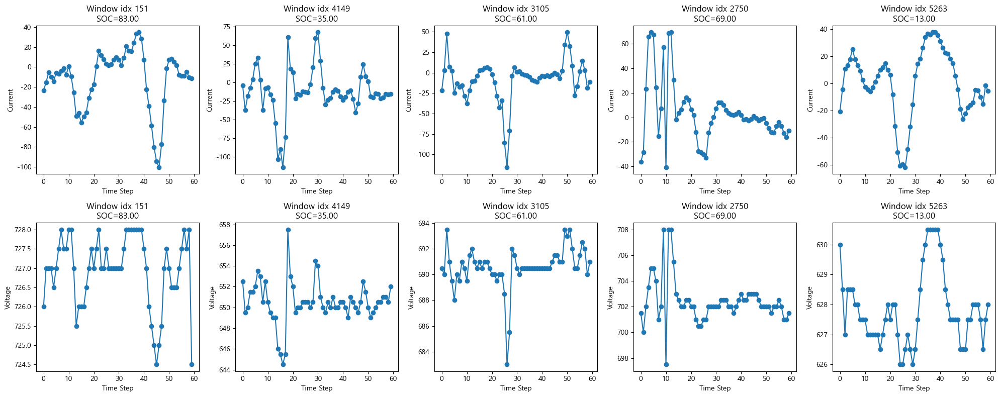

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# --- 전역 설정 ---
# all_sequences: (N, window_size, 4) → [전류, SOC, 전압, ΔI]
# window_size, latent_dim, data_min, data_max, generator_cond, get_condition, denormalize_feature 등이 이미 정의되어 있다고 가정

# 예시: 단일 Generator 모델 경로 (250317 모델)
generator_path = r"C:\Users\user\Desktop\JANG\code\AI\250420\JSAE_generator_epoch_250420_2500.h5"
# generator_path = r"C:\Users\user\Desktop\JANG\code\AI\250420\generator_final.h5"

# 원하는 윈도우 인덱스 랜덤 선택 (매 실행마다 변경)
random_indices = np.random.choice(len(all_sequences), size=5, replace=False)
print("Selected window indices:", random_indices)

# 단일 Generator 모델 로드
print(f"Loading generator model from: {generator_path}")
generator_model = load_model(generator_path)

# 고정 noise 샘플 (모든 조건에 동일하게 사용)
noise_fixed = tf.random.normal([1, window_size, latent_dim])

# 각 선택된 윈도우에서 SOC 추출 및 평균 계산
cond_list = []
soc_last_list = []  # 각 윈도우의 마지막 SOC (denormalized)
for idx in random_indices:
    real_window = all_sequences[idx]  # shape: (window_size, 4)
    # SOC 채널(인덱스 1) 추출 → shape: (window_size, 1)
    soc = real_window[:, 1:2]
    soc = soc[np.newaxis, ...]         # (1, window_size, 1)
    cond_list.append(soc)
    # 윈도우의 마지막 SOC 값 사용 (학습 시 사용한 조건과 동일)
    last_soc = soc[0, -1, 0]  # 마지막 time step의 SOC (scalar)
    last_soc_denorm = last_soc * (data_max[1] - data_min[1] + 1e-7) + data_min[1]
    soc_last_list.append(last_soc_denorm)

# 결과 저장: 각 선택된 윈도우에 대해 Generator가 생성한 전류와 전압 추출
# 생성된 최종 시퀀스의 ordering: [전류, SOC, 전압, ΔI]
results_current = []
results_voltage = []
for soc_cond in cond_list:
    # Generator 실행: Generator는 3채널 출력, ordering: [전류, ΔI, 전압]
    latent_output = generator_model([noise_fixed, soc_cond], training=False)  # (1, window_size, 3)
    generated_seq = combine_output(latent_output, soc_cond)  # (1, window_size, 4)
    # 전류 (index=0)와 전압 (index=2) 추출
    gen_current = generated_seq[0, :, 0].numpy()
    gen_voltage = generated_seq[0, :, 2].numpy()
    results_current.append(gen_current)
    results_voltage.append(gen_voltage)

# Denormalize: 전류는 인덱스 0, 전압은 인덱스 2 기준으로 복원
def denorm(arr, feature_index):
    # arr: 1D array (window_size,)
    return arr * (data_max[feature_index] - data_min[feature_index] + 1e-7) + data_min[feature_index]

results_current_denorm = []
results_voltage_denorm = []
for curr, volt in zip(results_current, results_voltage):
    denorm_current = denorm(curr, 0)
    denorm_voltage = denorm(volt, 2)
    results_current_denorm.append(denorm_current)
    results_voltage_denorm.append(denorm_voltage)

# 플롯: 2행 x 5열 subplot (첫 행: 전류, 두 번째 행: 전압)
num_windows = len(random_indices)
plt.figure(figsize=(num_windows * 4, 8))
for i, idx in enumerate(random_indices):
    # 전류 플롯 (첫 번째 행)
    plt.subplot(2, num_windows, i+1)
    plt.plot(results_current_denorm[i], marker='o', linestyle='-')
    plt.title(f"Window idx {idx}\nSOC={soc_last_list[i]:.2f}")
    plt.xlabel("Time Step")
    plt.ylabel("Current")

    # 전압 플롯 (두 번째 행)
    plt.subplot(2, num_windows, num_windows + i + 1)
    plt.plot(results_voltage_denorm[i], marker='o', linestyle='-')
    plt.title(f"Window idx {idx}\nSOC={soc_last_list[i]:.2f}")
    plt.xlabel("Time Step")
    plt.ylabel("Voltage")

plt.tight_layout()
plt.show()



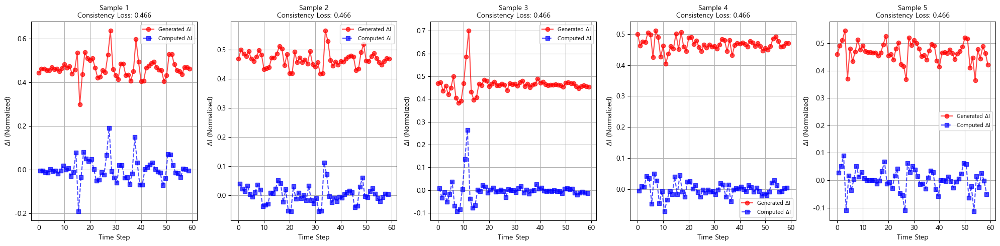

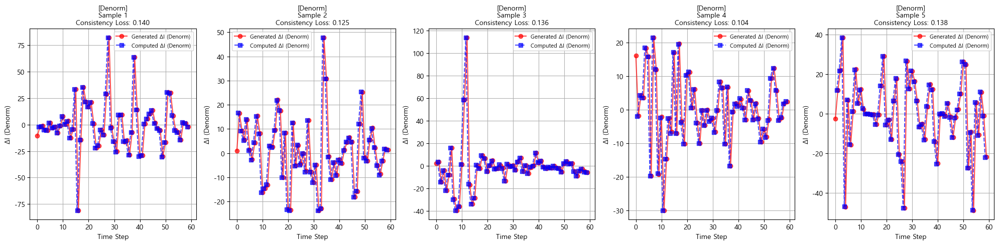

In [ ]:
# --- [샘플 수 설정 및 조건 텐서, 노이즈 생성] ---
num_samples = 5
target_soc = 50  # 예: 50% SOC

# SOC 스케일링: (target_soc - min) / (max - min)
soc_min_val = data_min[1]
soc_max_val = data_max[1]
scaled_soc = (target_soc - soc_min_val) / (soc_max_val - soc_min_val + 1e-7)

# condition 텐서 생성: shape (num_samples, window_size, 1)
cond = tf.ones((num_samples, window_size, 1), dtype=tf.float32) * scaled_soc

# 랜덤 Noise 생성: shape (num_samples, window_size, latent_dim)
noise = tf.random.normal([num_samples, window_size, latent_dim])

# --- (1) Generator 실행 및 결과 추출 (정규화된 결과 그대로 사용) ---
latent_output = generator_model([noise, cond], training=False)
# combine_output을 통해 최종 시퀀스 생성: [Current, SOC, Voltage, ΔI]
generated_seq = combine_output(latent_output, cond)

# 정규화된 전류와 ΔI 추출
gen_current = generated_seq[:, :, 0].numpy()  # shape: (num_samples, window_size)
gen_delta   = generated_seq[:, :, 3].numpy()  # shape: (num_samples, window_size)

# --- (2) 정규화된 전류로 np.diff 계산하여 computed ΔI 구하기 ---
calc_delta = np.diff(gen_current, axis=1)  # shape: (num_samples, window_size-1)

# --- (3) 정규화된 상태에서 플롯 ---
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, num_samples, figsize=(20, 5))
axes = axes.flatten()

for i in range(num_samples):
    ax = axes[i]

    # x축: 생성된 ΔI는 전체 window_size, np.diff 결과는 window_size-1 (중간 지점 맞춤)
    x_gen = np.arange(window_size)
    x_calc = np.arange(window_size - 1) + 0.5

    # 정규화 상태에서 생성된 ΔI와 계산된 ΔI 플롯 (정규화된 값 그대로)
    ax.plot(x_gen, gen_delta[i], marker='o', linestyle='-', color='red', alpha=0.7, label="Generated ΔI")
    ax.plot(x_calc, calc_delta[i], marker='s', linestyle='--', color='blue', alpha=0.7, label="Computed ΔI")

    # Consistency Loss 계산 (정규화된 값 기준)
    computed_delta = np.diff(gen_current[i], axis=0)        # (window_size-1,)
    generated_delta_aligned = gen_delta[i, 1:]               # (window_size-1,)
    consistency_loss = np.mean(np.abs(computed_delta - generated_delta_aligned))

    ax.set_title(f"Sample {i+1}\nConsistency Loss: {consistency_loss:.3f}", fontsize=10)
    ax.set_xlabel("Time Step", fontsize=10)
    ax.set_ylabel("ΔI (Normalized)", fontsize=10)
    ax.legend(fontsize=8)
    ax.grid(True)

plt.tight_layout()
plt.show()


# --- (4) unified_denorm 함수 정의 ---
# 전류, SOC, 전압 (feature_index: 0,1,2)는 일반적인 역정규화 수행
# ΔI (feature_index: 3)는 정규화 후 diff 결과이므로, 전류 채널의 범위를 사용 (+offset 없이)
def unified_denorm(arr, feature_index):
    if feature_index == 3:
        # ΔI 역변환: 전류의 범위만 사용
        range_val = data_max[0] - data_min[0] + 1e-7
        return arr * range_val
    else:
        range_val = data_max[feature_index] - data_min[feature_index] + 1e-7
        return arr * range_val + data_min[feature_index]

# --- (5) 역정규화된 값으로 변환 ---
gen_current_denorm = denorm(gen_current, 0)
gen_delta_denorm   = denorm(gen_delta, 3)
calc_delta_denorm  = np.diff(gen_current_denorm, axis=1)

# --- (6) 역정규화된 상태에서 플롯 ---
fig2, axes2 = plt.subplots(1, num_samples, figsize=(20, 5))
axes2 = axes2.flatten()

for i in range(num_samples):
    ax2 = axes2[i]

    x_gen = np.arange(window_size)
    x_calc = np.arange(window_size - 1) + 0.5

    # 역정규화된 결과로 생성된 ΔI와 계산된 ΔI 플롯
    ax2.plot(x_gen, gen_delta_denorm[i], marker='o', linestyle='-', color='red', alpha=0.7, label="Generated ΔI (Denorm)")
    ax2.plot(x_calc, calc_delta_denorm[i], marker='s', linestyle='--', color='blue', alpha=0.7, label="Computed ΔI (Denorm)")

    # 역정규화된 상태에서 Consistency Loss 계산
    computed_delta_dn = np.diff(gen_current_denorm[i], axis=0)
    generated_delta_aligned_dn = gen_delta_denorm[i, 1:]
    consistency_loss_denorm = np.mean(np.abs(computed_delta_dn - generated_delta_aligned_dn))

    ax2.set_title(f"[Denorm]\nSample {i+1}\nConsistency Loss: {consistency_loss_denorm:.3f}", fontsize=10)
    ax2.set_xlabel("Time Step", fontsize=10)
    ax2.set_ylabel("ΔI (Denorm)", fontsize=10)
    ax2.legend(fontsize=8)
    ax2.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
print("gen_delta stats: min =", np.min(gen_delta), "max =", np.max(gen_delta), "mean =", np.mean(gen_delta))
print("gen_delta dtype:", gen_delta.dtype)
print("gen_delta stats: min =", np.min(gen_delta), "max =", np.max(gen_delta), "mean =", np.mean(gen_delta))
print("Computed Delta stats: min =", np.min(calc_delta), "max =", np.max(calc_delta), "mean =", np.mean(calc_delta))


gen_delta stats: min = 0.2983 max = 0.7 mean = 0.4658
gen_delta dtype: float16
gen_delta stats: min = 0.2983 max = 0.7 mean = 0.4658
Computed Delta stats: min = -0.1895 max = 0.2651 mean = -0.0001969


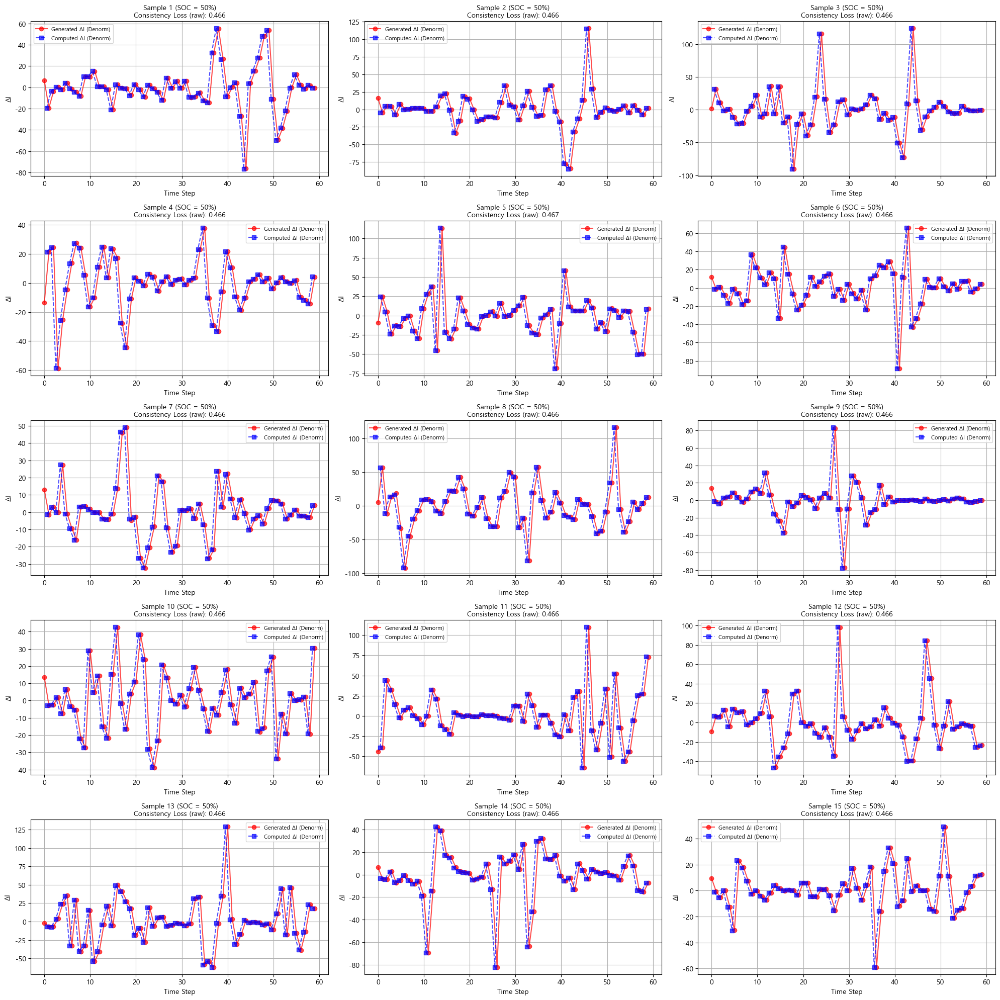

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# (데이터 전처리 및 모델 로드, all_sequences, data_min, data_max, window_size, latent_dim 등은 이미 정의되어 있다고 가정)

target_soc = 50    # 예: 50% SOC
num_samples = 15

# SOC 스케일링: (target_soc - min) / (max - min)
soc_min_val = data_min[1]
soc_max_val = data_max[1]
scaled_soc = (target_soc - soc_min_val) / (soc_max_val - soc_min_val + 1e-7)

# condition 텐서 생성: shape (num_samples, window_size, 1)
cond = tf.ones((num_samples, window_size, 1), dtype=tf.float32) * scaled_soc

# 랜덤 Noise 생성: shape (num_samples, window_size, latent_dim)
noise = tf.random.normal([num_samples, window_size, latent_dim])

# ------------------------------
# Generator 실행 및 결과 추출
# ------------------------------
# Generator 입력: [noise, condition]
latent_output = generator_model([noise, cond], training=False)
# combine_output을 통해 최종 시퀀스 생성: [Current, SOC, Voltage, ΔI]
generated_seq = combine_output(latent_output, cond)

# Generator가 생성한 Current와 ΔI 추출 (아직 역정규화하지 않은 raw 값, 정규화 상태)
gen_current = generated_seq[:, :, 0].numpy()  # shape: (num_samples, window_size)
gen_delta   = generated_seq[:, :, 3].numpy()    # shape: (num_samples, window_size)

# ------------------------------
# 전류 기반으로 np.diff를 사용해 계산한 ΔI 구하기
# ------------------------------
calc_delta = np.diff(gen_current, axis=1)  # shape: (num_samples, window_size-1)

# ------------------------------
# unified_denorm 함수 정의
# 전류, SOC, 전압 (feature_index 0,1,2): 일반적인 역정규화
# ΔI (feature_index 3): 정규화 후 diff 결과이므로, 전류 채널의 range만 사용 (오프셋 없이)

fig, axes = plt.subplots(5, 3, figsize=(20, 20))
axes = axes.flatten()

for i in range(num_samples):
    ax = axes[i]

    # x축: 생성된 ΔI는 window_size 포인트, np.diff 계산된 ΔI는 window_size-1 포인트 -> 중앙값 위치로 조정
    x_gen = np.arange(window_size)
    x_calc = np.arange(window_size - 1) + 0.5

    # Generated ΔI 역변환: unified_denorm 적용 (ΔI 채널: feature_index=3)
    gen_delta_denorm = denorm(gen_delta[i], 3)
    # Computed ΔI 역변환: np.diff한 raw 전류에 대해, 먼저 역정규화한 전류에서 차분을 계산
    # 즉, 먼저 역변환한 전류를 이용하여 계산
    gen_current_denorm = denorm(gen_current[i], 0)
    calc_delta_denorm = np.diff(gen_current_denorm, axis=0)

    # 플롯: denorm된 ΔI 값 출력
    ax.plot(x_gen, gen_delta_denorm, marker='o', linestyle='-', color='red', alpha=0.7, label="Generated ΔI (Denorm)")
    ax.plot(x_calc, calc_delta_denorm, marker='s', linestyle='--', color='blue', alpha=0.7, label="Computed ΔI (Denorm)")

    # Consistency Loss (raw 정규화 상태 기준)
    computed_delta_raw = np.diff(gen_current[i], axis=0)
    generated_delta_raw = gen_delta[i, 1:]
    consistency_loss_raw = np.mean(np.abs(computed_delta_raw - generated_delta_raw))

    ax.set_title(f"Sample {i+1} (SOC = {target_soc}%)\nConsistency Loss (raw): {consistency_loss_raw:.3f}", fontsize=10)
    ax.set_xlabel("Time Step", fontsize=10)
    ax.set_ylabel("ΔI", fontsize=10)
    ax.legend(fontsize=8)
    ax.grid(True)

# 사용하지 않는 subplot이 있으면 제거
for j in range(num_samples, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


Selected window indices: [1228 2591 4511 1986 2880]


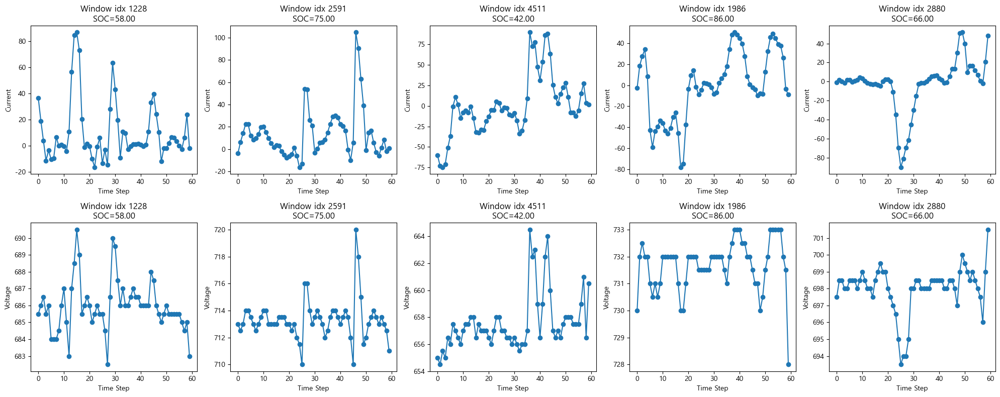

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# --- 전역 설정 ---
# all_sequences: (N, window_size, 4) → [전류, SOC, 전압, ΔI]
# window_size, latent_dim, data_min, data_max, generator_cond, get_condition, denormalize_feature 등이 이미 정의되어 있다고 가정

# 원하는 윈도우 인덱스 랜덤 선택 (매 실행마다 변경)
random_indices = np.random.choice(len(all_sequences), size=5, replace=False)
print("Selected window indices:", random_indices)

# 고정 noise 샘플 (모든 조건에 동일하게 사용)
noise_fixed = tf.random.normal([1, window_size, latent_dim])

# 각 선택된 윈도우에서 SOC 추출 및 평균 계산
cond_list = []
soc_last_list = []  # 각 윈도우의 마지막 SOC (denormalized)
for idx in random_indices:
    real_window = all_sequences[idx]  # shape: (window_size, 4)
    # SOC 채널(인덱스 1) 추출 → shape: (window_size, 1)
    soc = real_window[:, 1:2]
    soc = soc[np.newaxis, ...]         # (1, window_size, 1)
    cond_list.append(soc)
    # 윈도우의 마지막 SOC 값 사용 (학습 시 사용한 조건과 동일)
    last_soc = soc[0, -1, 0]  # 마지막 time step의 SOC (scalar)
    last_soc_denorm = last_soc * (data_max[1] - data_min[1] + 1e-7) + data_min[1]
    soc_last_list.append(last_soc_denorm)

def combine_output(dynamic, cond):
    # dynamic: (batch, window_size, 3) → [Current, ΔI, Voltage]
    # cond: (batch, window_size, 1) → SOC
    current = dynamic[..., 0]   # (batch, window_size)
    delta_i = dynamic[..., 1]   # (batch, window_size)
    voltage = dynamic[..., 2]   # (batch, window_size)
    # cond를 dynamic과 동일한 dtype으로 캐스팅 (예: float16)
    soc = tf.cast(cond[..., 0], dynamic.dtype)  # (batch, window_size)

    # 최종 순서: [Current, SOC, Voltage, ΔI]
    final = tf.stack([current, soc, voltage, delta_i], axis=-1)
    return final

# 결과 저장: 각 선택된 윈도우에 대해 Generator가 생성한 전류와 전압 추출
# 생성된 최종 시퀀스의 ordering: [전류, SOC, 전압, ΔI]
results_current = []
results_voltage = []
for soc_cond in cond_list:
    # Generator 실행: Generator는 3채널 출력, ordering: [전류, ΔI, 전압]
    latent_output = generator_model([noise_fixed, soc_cond], training=False)  # (1, window_size, 3)
    generated_seq = combine_output(latent_output, soc_cond)  # (1, window_size, 4)
    # 전류 (index=0)와 전압 (index=2) 추출
    gen_current = generated_seq[0, :, 0].numpy()
    gen_voltage = generated_seq[0, :, 2].numpy()
    results_current.append(gen_current)
    results_voltage.append(gen_voltage)

# Denormalize: 전류는 인덱스 0, 전압은 인덱스 2 기준으로 복원
def denorm(arr, feature_index):
    # arr: 1D array (window_size,)
    return arr * (data_max[feature_index] - data_min[feature_index] + 1e-7) + data_min[feature_index]

results_current_denorm = []
results_voltage_denorm = []
for curr, volt in zip(results_current, results_voltage):
    denorm_current = denorm(curr, 0)
    denorm_voltage = denorm(volt, 2)
    results_current_denorm.append(denorm_current)
    results_voltage_denorm.append(denorm_voltage)

# 플롯: 2행 x 5열 subplot (첫 행: 전류, 두 번째 행: 전압)
num_windows = len(random_indices)
plt.figure(figsize=(num_windows * 4, 8))
for i, idx in enumerate(random_indices):
    # 전류 플롯 (첫 번째 행)
    plt.subplot(2, num_windows, i+1)
    plt.plot(results_current_denorm[i], marker='o', linestyle='-')
    plt.title(f"Window idx {idx}\nSOC={soc_last_list[i]:.2f}")
    plt.xlabel("Time Step")
    plt.ylabel("Current")

    # 전압 플롯 (두 번째 행)
    plt.subplot(2, num_windows, num_windows + i + 1)
    plt.plot(results_voltage_denorm[i], marker='o', linestyle='-')
    plt.title(f"Window idx {idx}\nSOC={soc_last_list[i]:.2f}")
    plt.xlabel("Time Step")
    plt.ylabel("Voltage")

plt.tight_layout()
plt.show()


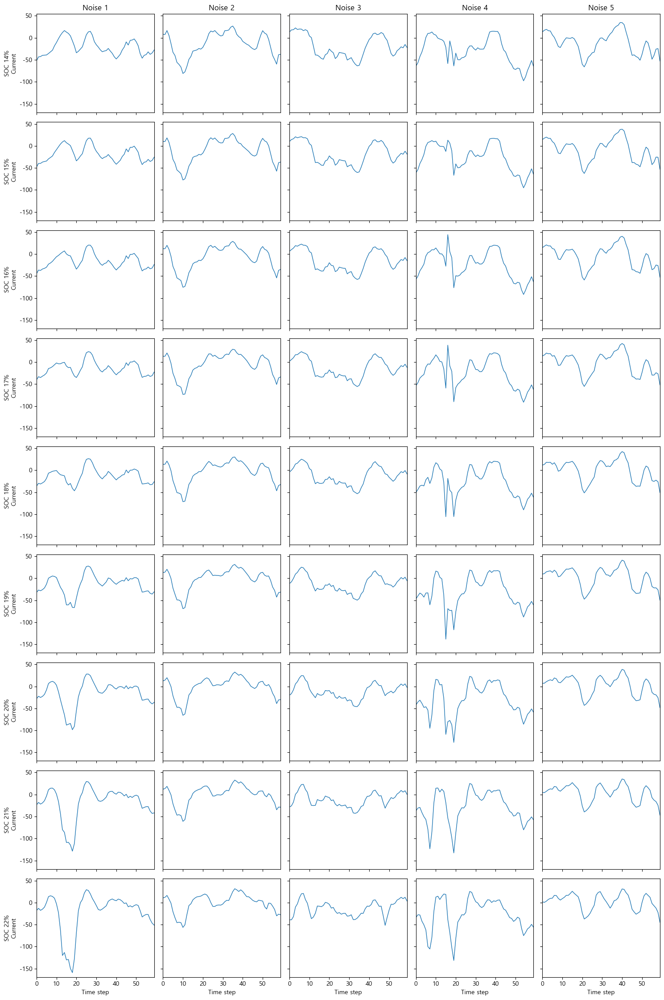

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# --- (0) 환경에 맞게 미리 정의되어 있어야 할 것들 ---
# window_size, latent_dim
# data_min, data_max: 채널별 min/max (numpy array, 길이 4)
# generator_model: [noise, cond] → (batch, window_size, 3)
# combine_output: generator output + cond → (batch, window_size, 4)
# denorm_feature: (배열, 채널인덱스) → 원단위 복원

# 마스킹된 SOC 리스트 예시
masked_socs = [14,15,16,17,18,19,20,21,22]

# 고정할 5개의 노이즈 샘플을 미리 뽑아두기
n_noise = 5
noise_fixed = tf.random.normal([n_noise, window_size, latent_dim])

def make_cond_batch(soc_value, window_size, data_min, data_max, batch_size):
    soc_norm = (soc_value - data_min[1]) / (data_max[1] - data_min[1] + 1e-7)
    return tf.fill([batch_size, window_size, 1], soc_norm)

# --- (1) 그리드 설정 ---
n_rows = len(masked_socs)
n_cols = n_noise

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*2.5), sharex=True, sharey=True)

for i, soc in enumerate(masked_socs):
    # 각 SOC에 대한 조건 배치
    cond_batch = make_cond_batch(soc, window_size, data_min, data_max, n_noise)
    # 생성
    latent_out = generator_model([noise_fixed, cond_batch], training=False)
    gen_seq = combine_output(latent_out, cond_batch).numpy()  # (n_noise, window_size, 4)

    for j in range(n_noise):
        ax = axes[i, j] if n_rows > 1 else axes[j]
        # current 채널(인덱스 0)만 denorm 후 플롯
        curr = denorm_feature(gen_seq[j, :, 0], 0)
        ax.plot(curr, linewidth=1)
        if i == 0:
            ax.set_title(f"Noise {j+1}")
        if j == 0:
            ax.set_ylabel(f"SOC {soc}%\nCurrent")
        if i == n_rows-1:
            ax.set_xlabel("Time step")
        ax.set_xlim(0, window_size-1)

plt.tight_layout()
plt.show()


1/1 [==============================] - 0s 19ms/step


c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:58: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


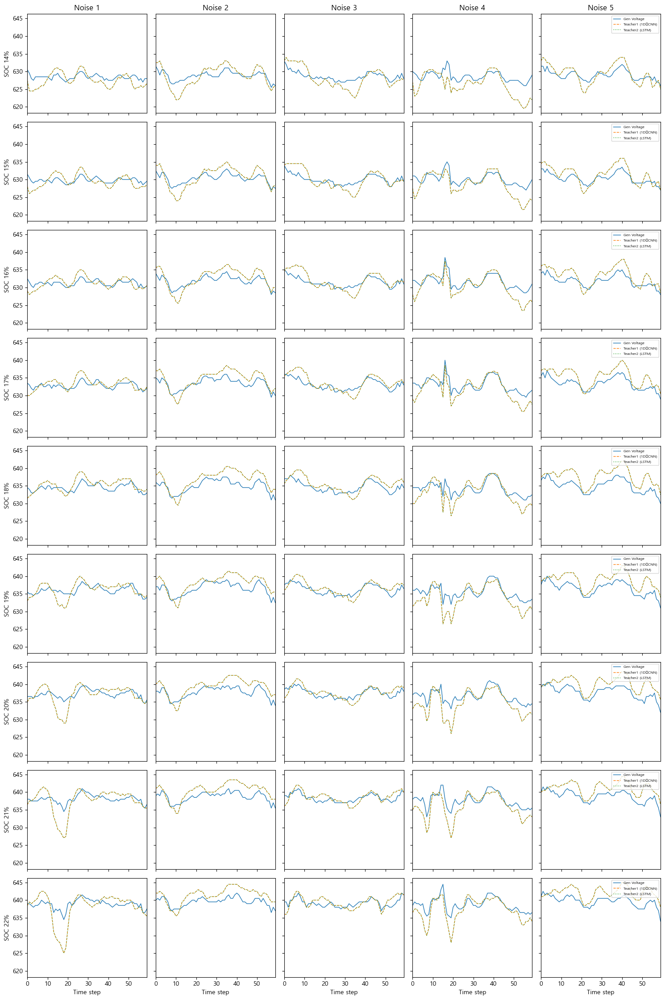

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# --- 사전 정의된 것들 ---
# window_size, latent_dim
# data_min, data_max: 채널별 Min/Max (np.array, 길이 4)
# generator_model: [noise, cond] → (batch, window_size, 3)
# combine_output: generator output + cond → (batch, window_size, 4)
# teacher_model, teacher_model_2: 정규화된 [Current,SOC,ΔI] → 정규화된 Voltage
# denorm_feature(arr, feature_index): 정규화 → 실제값 복원

def make_cond_batch(soc_value, window_size, data_min, data_max, batch_size):
    soc_norm = (soc_value - data_min[1]) / (data_max[1] - data_min[1] + 1e-7)
    return tf.fill([batch_size, window_size, 1], soc_norm)

n_rows = len(masked_socs)
n_cols = n_noise

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*2.5), sharex=True, sharey=True)

for i, soc in enumerate(masked_socs):
    # 조건 배치 생성
    cond_batch = make_cond_batch(soc, window_size, data_min, data_max, n_noise)
    # 생성 및 combine
    latent_out = generator_model([noise_fixed, cond_batch], training=False)
    gen_seq = combine_output(latent_out, cond_batch).numpy()  # (n_noise, window_size, 4)

    # Teacher 입력 ([Current,SOC,ΔI])
    teacher_in = gen_seq[..., [0,1,3]]  # (n_noise, window_size, 3)
    t1_pred = teacher_model.predict(teacher_in)    # (n_noise, window_size, 1)
    t2_pred = teacher_model_2.predict(teacher_in)  # (n_noise, window_size, 1)

    for j in range(n_noise):
        ax = axes[i, j] if n_rows>1 else axes[j]

        # Generator 전압(channel 2)과 Teacher 전압 예측 모두 denormalize
        gv = denorm_feature(gen_seq[j,:,2], 2)
        t1 = denorm_feature(t1_pred[j,:,0], 2)
        t2 = denorm_feature(t2_pred[j,:,0], 2)

        ax.plot(gv,   label="Gen Voltage", linewidth=1)
        ax.plot(t1,  '--', label="Teacher1 (1D‑CNN)", linewidth=1)
        ax.plot(t2,  ':', label="Teacher2 (LSTM)", linewidth=1)

        # 첫 행에만 제목, 첫 열에만 y축 레이블
        if i == 0:
            ax.set_title(f"Noise {j+1}")
        if j == 0:
            ax.set_ylabel(f"SOC {soc}%")
        if i == n_rows-1:
            ax.set_xlabel("Time step")

        ax.set_xlim(0, window_size-1)
        if j==n_cols-1:
            ax.legend(loc='upper right', fontsize=6)

plt.tight_layout()
plt.show()


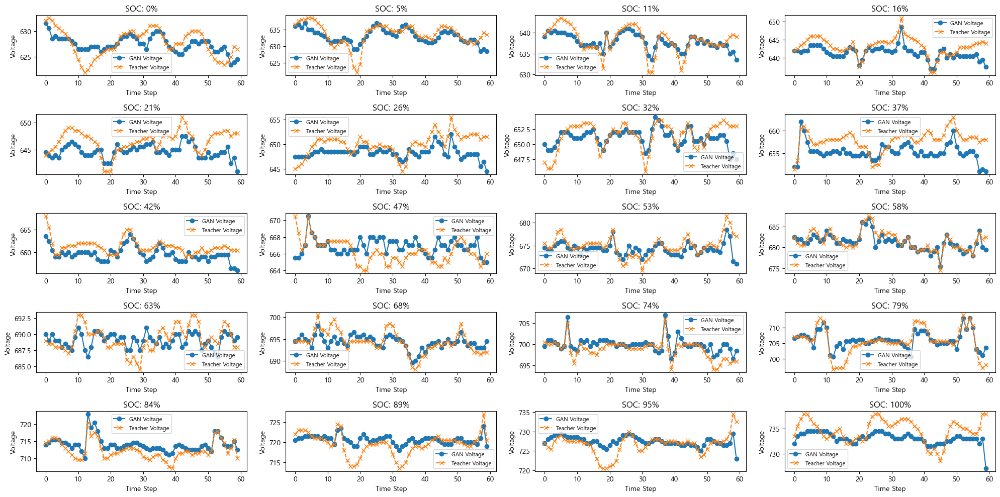

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# -----------------------------------------------------
# 1. 동일한 noise를 생성 (모든 조건에 대해 동일하게 사용)
# -----------------------------------------------------
noise = tf.random.normal([1, window_size, latent_dim], dtype=tf.float32)

# -----------------------------------------------------
# 2. SOC 값 0% ~ 100% (정규화: 0.0 ~ 1.0)로 20개 샘플 생성
# -----------------------------------------------------
num_samples = 20
soc_values = np.linspace(0, 1, num=num_samples)  # normalized SOC from 0 to 1

# 저장할 리스트들
generated_voltages = []     # Generator가 생성한 전압 (denorm된 값)
teacher_voltages = []       # Teacher 모델이 추정한 전압 (denorm된 값)

# -----------------------------------------------------
# 3. 각 SOC 조건에 대해 Generator와 Teacher 모델 출력을 계산
# -----------------------------------------------------
for soc in soc_values:
    # condition 텐서: (1, window_size, 1), 모든 값이 해당 SOC (정규화 상태)
    cond = tf.constant(soc, shape=[1, window_size, 1], dtype=tf.float32)

    # Generator 실행: noise와 condition을 입력 (출력 shape: (1, window_size, 3))
    latent_output = generator_model([noise, cond], training=False)
    # 생성된 전체 시퀀스: combine_output을 통해 최종 4채널 시퀀스 생성
    # 최종 순서: [Current, SOC, Voltage, ΔI]
    generated_seq = combine_output(latent_output, cond)

    # Generator 전압: index 2 (정규화 상태)
    gen_voltage_norm = generated_seq[0, :, 2].numpy()
    gen_voltage_denorm = denorm(gen_voltage_norm, 2)

    # Teacher 모델의 입력 구성: [Current, SOC, ΔI] → 인덱스 [0, 1, 3]
    teacher_input = tf.gather(generated_seq, indices=[0, 1, 3], axis=-1)
    # Teacher 모델 실행: teacher_model (또는 teacher_model_2, 둘은 동일 인스턴스임)
    teacher_pred = teacher_model(teacher_input, training=False)  # 출력 shape: (1, window_size, 1)
    teacher_voltage_norm = teacher_pred[0, :, 0].numpy()
    teacher_voltage_denorm = denorm(teacher_voltage_norm, 2)

    generated_voltages.append(gen_voltage_denorm)
    teacher_voltages.append(teacher_voltage_denorm)

# -----------------------------------------------------
# 4. 5행 4열로 플롯: 각 subplot에 Generator vs. Teacher 예측 전압 비교
# -----------------------------------------------------
n_rows = 5
n_cols = 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10))
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < num_samples:
        ax.plot(generated_voltages[i], marker='o', linestyle='-', label='GAN Voltage')
        ax.plot(teacher_voltages[i], marker='x', linestyle='--', label='Teacher Voltage')
        ax.set_title(f"SOC: {soc_values[i]*100:.0f}%")
        ax.set_xlabel("Time Step")
        ax.set_ylabel("Voltage")
        ax.legend(fontsize=8, loc='best')
    else:
        ax.axis('off')
plt.tight_layout()
plt.show()


1/1 [==============================] - 0s 22ms/step


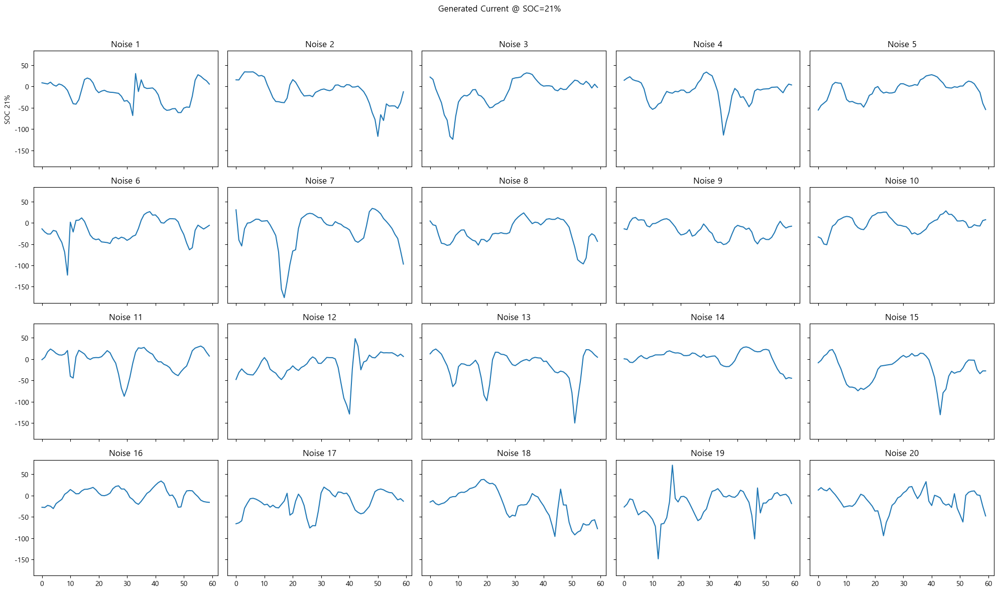

c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\ipykernel_launcher.py:73: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.


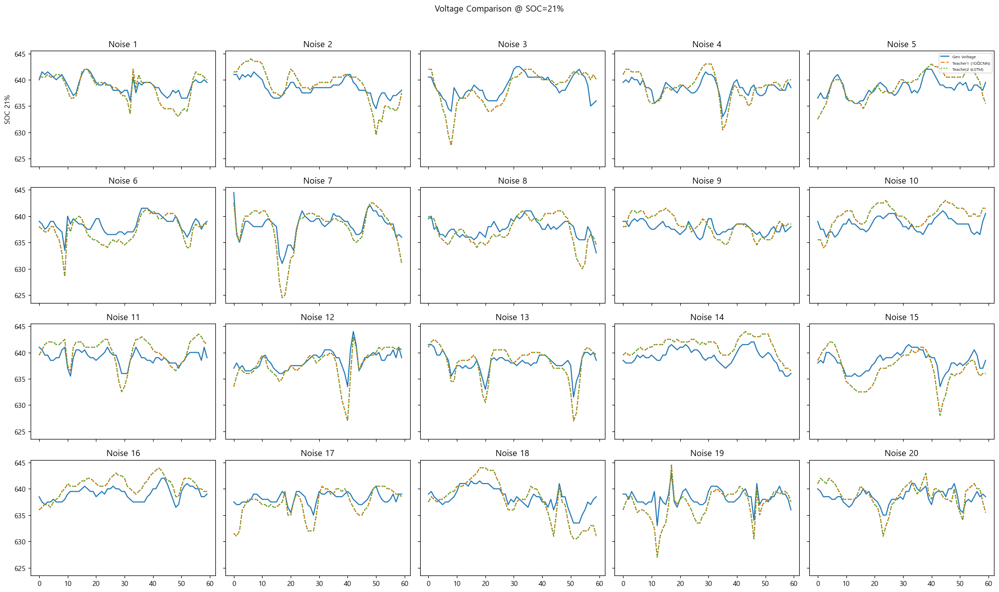

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# =====================================================================
# 사전 정의된 것들:
# - all_sequences: (N, window_size, 4) 정규화된 [Current,SOC,Voltage,ΔI]
# - generator_model, teacher_model, teacher_model_2
# - data_min, data_max, latent_dim, window_size
# - get_condition(seq): (1,window_size,1) SOC 채널 추출
# - combine_output, denorm_feature
# =====================================================================

# 1) 원하는 SOC 값 (정수 %) 지정
target_soc = 21

# 2) all_sequences 중 마지막 시점 SOC이 target_soc%인 윈도우 인덱스들 찾기
#    all_sequences[...,1] 채널이 정규화된 SOC
soc_norm_target = (target_soc - data_min[1]) / (data_max[1] - data_min[1] + 1e-7)
# 마지막 타임스텝의 SOC만 추출
end_socs = all_sequences[:, -1, 1]
indices = np.where(np.isclose(end_socs, soc_norm_target, atol=1e-3))[0]

if len(indices) == 0:
    raise ValueError(f"SOC={target_soc}% 에 해당하는 윈도우가 없습니다.")

# 3) 그 중 첫 번째 윈도우 선택
sel_idx = indices[0]
real_window = all_sequences[sel_idx:sel_idx+1]  # shape (1, window_size, 4)

# 4) cond 생성
cond = get_condition(real_window)

# 5) 노이즈 샘플 수
num_noise = 20
noise = tf.random.normal([num_noise, window_size, latent_dim])

# 6) generator → 4채널 시퀀스
latent_out = generator_model([noise, tf.repeat(cond, num_noise, axis=0)], training=False)
gen_seq = combine_output(latent_out, tf.repeat(cond, num_noise, axis=0)).numpy()  # (num_noise, w,4)

# 7) Teacher 입력
teacher_in = gen_seq[..., [0,1,3]]  # (num_noise, w,3)
t1 = teacher_model.predict(teacher_in)    # (num_noise, w,1)
t2 = teacher_model_2.predict(teacher_in)  # (num_noise, w,1)

# 8) Denormalize 전류 & 전압
gen_current = denorm_feature(gen_seq[...,0], 0)
gen_voltage = denorm_feature(gen_seq[...,2], 2)
t1_voltage = denorm_feature(t1[...,0], 2)
t2_voltage = denorm_feature(t2[...,0], 2)

# 9) 5×4 그리드로 전류
fig, axes = plt.subplots(4, 5, figsize=(20,12), sharex=True, sharey=True)
for i, ax in enumerate(axes.flatten()):
    ax.plot(gen_current[i], label="Gen Current")
    ax.set_title(f"Noise {i+1}")
    if i==0: ax.set_ylabel(f"SOC {target_soc}%")
plt.suptitle(f"Generated Current @ SOC={target_soc}%")
plt.tight_layout(rect=[0,0,1,0.96])
plt.show()

# 10) 5×4 그리드로 전압 비교 (Gen vs T1 vs T2)
fig, axes = plt.subplots(4, 5, figsize=(20,12), sharex=True, sharey=True)
for i, ax in enumerate(axes.flatten()):
    ax.plot(gen_voltage[i], '-',   label="Gen Voltage")
    ax.plot(t1_voltage[i], '--',  label="Teacher1 (1D‑CNN)")
    ax.plot(t2_voltage[i], ':',   label="Teacher2 (LSTM)")
    if i==0: ax.set_ylabel(f"SOC {target_soc}%")
    if i==4: ax.legend(loc="upper right", fontsize=6)
    ax.set_title(f"Noise {i+1}")
plt.suptitle(f"Voltage Comparison @ SOC={target_soc}%")
plt.tight_layout(rect=[0,0,1,0.96])
plt.show()


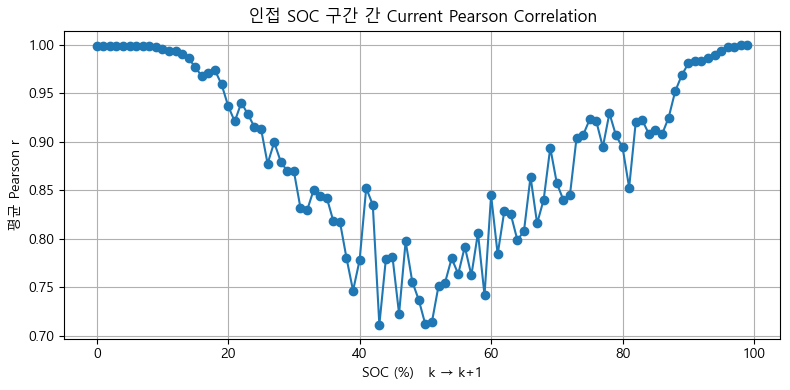

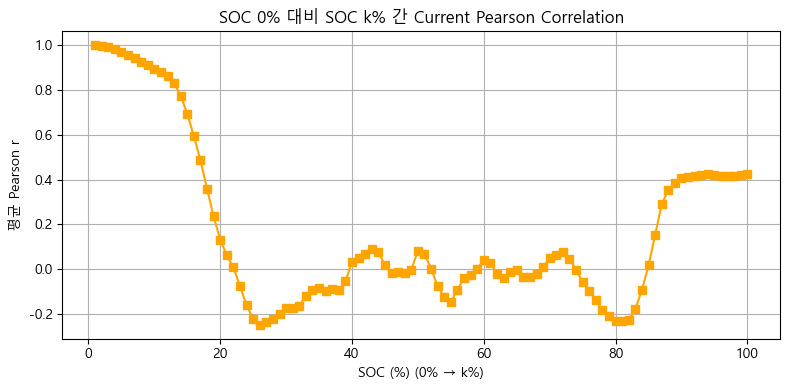

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# — 사전 정의된 것들 —
# generator_model, latent_dim, window_size,
# data_min, data_max, get_condition(),
# combine_output(), denorm_feature(arr, feature_index)
# —————————————————————————

# 1) 고정된 노이즈 20개
num_noise = 20
noise_batch = tf.random.normal([num_noise, window_size, latent_dim])

# 2) SOC 0~100% 구간 생성 전류 수집
soc_values = np.arange(0, 101)
all_currents = []  # 리스트에 (num_noise, window_size) 배열을 담음
for soc in soc_values:
    # 조건 배치 생성
    cond_val = (soc - data_min[1]) / (data_max[1] - data_min[1] + 1e-7)
    cond_batch = tf.fill([num_noise, window_size, 1], cond_val)
    # 생성
    latent = generator_model([noise_batch, cond_batch], training=False)    # (num_noise, window_size, 3)
    seq = combine_output(latent, cond_batch)                               # (num_noise, window_size, 4)
    # Current 채널(인덱스 0) 꺼내서 denorm
    curr_norm = seq[:, :, 0].numpy()
    curr_denorm = denorm_feature(curr_norm, 0)  # 실제 단위로 복원
    all_currents.append(curr_denorm)

# 3) 인접 SOC 구간 k→k+1 상관관계 (평균 Pearson r)
pearson_adj = []
for i in range(len(soc_values)-1):
    c1 = all_currents[i]
    c2 = all_currents[i+1]
    # 각 노이즈 샘플별 corr, 그 평균
    rs = [ np.corrcoef(c1[j], c2[j])[0,1] for j in range(num_noise) ]
    pearson_adj.append(np.mean(rs))

# 4) SOC 0% 대비 SOC k% 상관관계 (k=1…100)
pearson_zero = []
c0 = all_currents[0]
for i in range(1, len(soc_values)):
    ci = all_currents[i]
    rs = [ np.corrcoef(c0[j], ci[j])[0,1] for j in range(num_noise) ]
    pearson_zero.append(np.mean(rs))

# 5) 결과 플롯
plt.figure(figsize=(8,4))
plt.plot(soc_values[:-1], pearson_adj, marker='o')
plt.title('인접 SOC 구간 간 Current Pearson Correlation')
plt.xlabel('SOC (%)   k → k+1')
plt.ylabel('평균 Pearson r')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(8,4))
plt.plot(soc_values[1:], pearson_zero, marker='s', color='orange')
plt.title('SOC 0% 대비 SOC k% 간 Current Pearson Correlation')
plt.xlabel('SOC (%) (0% → k%)')
plt.ylabel('평균 Pearson r')
plt.grid(True)
plt.tight_layout()
plt.show()


Selected window index: 2702
SOC (denormalized): 70.00


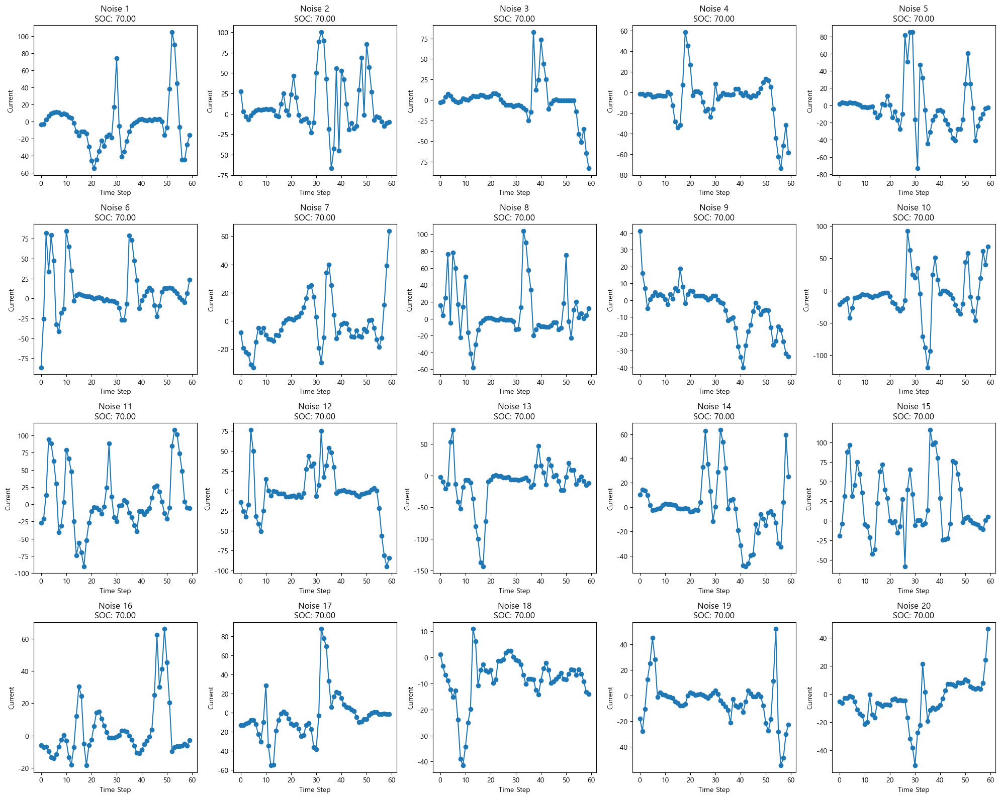

-------------------------------------------------
[Debug] Noise Sample #1
generated_seq.shape = (1, 60, 4)
  - generated_seq[0, :print_count, 0] (Current): [0.611  0.612  0.6216 0.6196 0.629 ]
  - generated_seq[0, :print_count, 1] (SOC): [0.7705 0.7705 0.7705 0.7705 0.7705]
  - generated_seq[0, :print_count, 2] (Voltage): [0.71   0.712  0.715  0.71   0.7144]
  - generated_seq[0, :print_count, 3] (ΔI): [0.468  0.467  0.474  0.4646 0.474 ]
teacher_input.shape = (1, 60, 3)
  - teacher_input[0, :print_count, :] = [[0.611  0.7705 0.468 ]
 [0.612  0.7705 0.467 ]
 [0.6216 0.7705 0.474 ]
 [0.6196 0.7705 0.4646]
 [0.629  0.7705 0.474 ]]
teacher_pred1.shape = (1, 60, 1)
teacher_pred2.shape = (1, 60, 1)
  - teacher_pred1[0, :print_count, 0] = [0.705 0.702 0.705 0.706 0.71 ]
  - teacher_pred2[0, :print_count, 0] = [0.705 0.702 0.705 0.706 0.71 ]
-------------------------------------------------



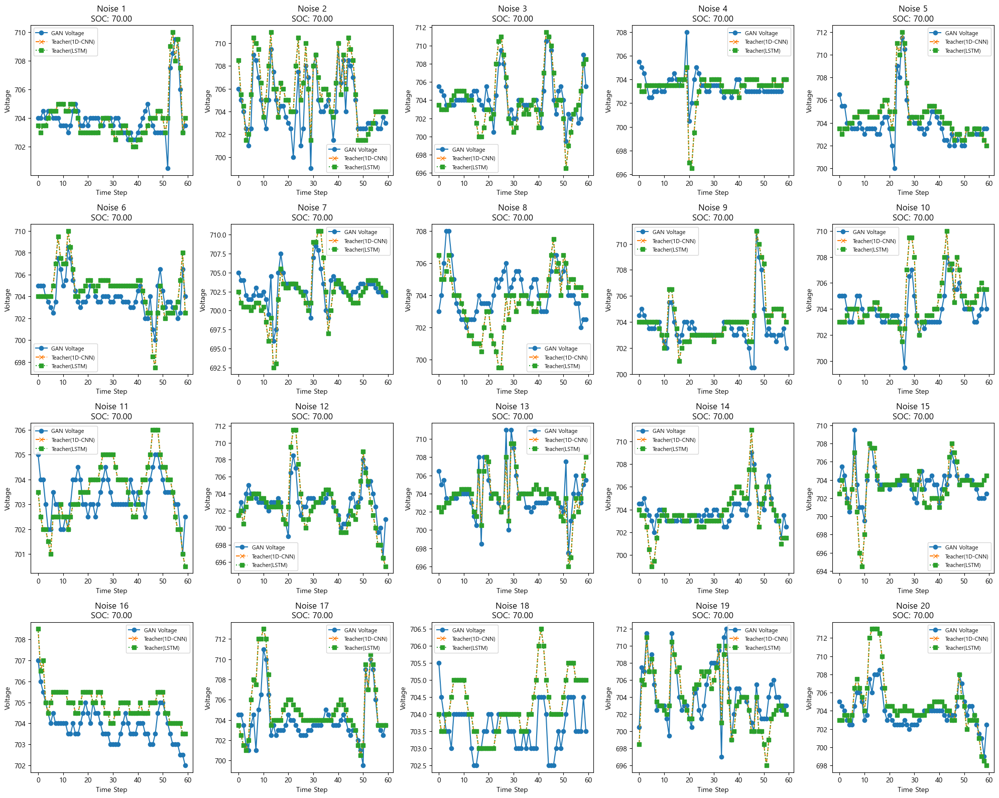

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# =====================================================================
# 가정: 아래 변수와 함수들은 이미 정의되어 있음
#   - all_sequences: (N, window_size, 4) → [Current, SOC, Voltage, ΔI] (정규화 상태)
#   - get_condition: 입력 시퀀스에서 (1, window_size, 1) 형태로 SOC 채널 추출
#   - generator_model: Generator 모델, 입력: [노이즈, cond], 출력: (batch, window_size, 3)
#         출력 순서는 [Current, ΔI, Voltage]
#   - teacher_model: 1D-CNN Teacher, teacher_model_2: LSTM Teacher
#         이들 모두 정규화된 데이터를 입력받아 정규화된 전압을 출력
#   - data_min, data_max: 각 채널([Current, SOC, Voltage, ΔI])의 최소/최대값 (예: NumPy array)
#   - latent_dim, window_size: Generator의 입력 노이즈 차원과 시퀀스 길이
# =====================================================================

# -----------------------------
# 1. denorm 함수: 정규화된 값을 실제 값으로 복원
# -----------------------------
def denorm(arr, feature_index):
    return arr * (data_max[feature_index] - data_min[feature_index] + 1e-7) + data_min[feature_index]

# -----------------------------
# 2. combine_output 함수: Generator의 출력과 조건(SOC)을 결합하여 4채널 시퀀스 생성
#    Generator 출력 순서: [Current, ΔI, Voltage]
#    cond (SOC): shape (batch, window_size, 1)
#    최종 채널 순서: [Current, SOC, Voltage, ΔI]
# -----------------------------

# -----------------------------
# 3. 디버깅용 출력 함수: 중간 텐서들의 shape와 일부 값들을 확인
# -----------------------------
def debug_print(sample_idx, generated_seq, teacher_input, teacher_pred1, teacher_pred2, print_count=5):
    print("-------------------------------------------------")
    print(f"[Debug] Noise Sample #{sample_idx}")
    # generated_seq: (1, window_size, 4)
    print("generated_seq.shape =", generated_seq.shape)
    print("  - generated_seq[0, :print_count, 0] (Current):", generated_seq[0, :print_count, 0].numpy())
    print("  - generated_seq[0, :print_count, 1] (SOC):",     generated_seq[0, :print_count, 1].numpy())
    print("  - generated_seq[0, :print_count, 2] (Voltage):", generated_seq[0, :print_count, 2].numpy())
    print("  - generated_seq[0, :print_count, 3] (ΔI):",      generated_seq[0, :print_count, 3].numpy())

    print("teacher_input.shape =", teacher_input.shape)
    print("  - teacher_input[0, :print_count, :] =", teacher_input[0, :print_count, :].numpy())

    print("teacher_pred1.shape =", teacher_pred1.shape)
    print("teacher_pred2.shape =", teacher_pred2.shape)
    print("  - teacher_pred1[0, :print_count, 0] =", teacher_pred1[0, :print_count, 0].numpy())
    print("  - teacher_pred2[0, :print_count, 0] =", teacher_pred2[0, :print_count, 0].numpy())
    print("-------------------------------------------------\n")

# -----------------------------
# 4. 윈도우(조건) 선택 및 SOC denormalize
# -----------------------------
num_noise_samples = 20
selected_idx = np.random.choice(len(all_sequences), size=1)[0]
print("Selected window index:", selected_idx)

# 선택된 윈도우 (shape: (window_size, 4), 정규화 상태)
real_window = all_sequences[selected_idx]
# cond: (1, window_size, 1)
cond = get_condition(real_window[np.newaxis, ...])
# 마지막 타임스텝 SOC 정규화 값 및 denormalize
last_soc_norm = cond[0, -1, 0]
last_soc_denorm = denorm(last_soc_norm, 1)
print(f"SOC (denormalized): {last_soc_denorm:.2f}")

# -----------------------------
# 5. 전류 시계열 시각화 (5×4 Subplot)
# -----------------------------
generated_currents_denorm = []

for i in range(num_noise_samples):
    noise = tf.random.normal([1, window_size, latent_dim])
    latent_output = generator_model([noise, cond], training=False)  # (1, window_size, 3)
    generated_seq = combine_output(latent_output, cond)             # (1, window_size, 4)

    # 전류 채널(index=0)
    gen_current_norm = generated_seq[0, :, 0].numpy()
    gen_current_denorm = denorm(gen_current_norm, 0)
    generated_currents_denorm.append(gen_current_denorm)

fig, axes = plt.subplots(4, 5, figsize=(20, 16))
for i, ax in enumerate(axes.flatten()):
    if i < num_noise_samples:
        ax.plot(generated_currents_denorm[i], marker='o', linestyle='-')
        ax.set_title(f"Noise {i+1}\nSOC: {last_soc_denorm:.2f}")
        ax.set_xlabel("Time Step")
        ax.set_ylabel("Current")
    else:
        ax.axis('off')
plt.tight_layout()
plt.show()

# -----------------------------
# 6. 전압 비교: Generator vs. Teacher(1D-CNN) vs. Teacher(LSTM) (5×4 Subplot)
# -----------------------------
generated_voltages_denorm = []
teacher_voltages_1d_denorm = []
teacher_voltages_lstm_denorm = []

for i in range(num_noise_samples):
    noise = tf.random.normal([1, window_size, latent_dim])
    latent_output = generator_model([noise, cond], training=False)  # (1, window_size, 3)
    generated_seq = combine_output(latent_output, cond)             # (1, window_size, 4)

    # Generator 전압 (정규화 상태, index=2)
    gen_voltage_norm = generated_seq[0, :, 2].numpy()

    # Teacher 입력: [Current, SOC, ΔI] → 인덱스 [0,1,3]
    teacher_input = tf.gather(generated_seq, indices=[0, 1, 3], axis=-1)  # (1, window_size, 3)

    # Teacher 예측 (정규화 상태)
    teacher_pred1 = teacher_model(teacher_input, training=False)   # (1, window_size, 1)
    teacher_pred2 = teacher_model_2(teacher_input, training=False) # (1, window_size, 1)

    # 디버깅: 첫 번째 노이즈 샘플에 대해 출력
    if i == 0:
        debug_print(sample_idx=i+1,
                    generated_seq=generated_seq,
                    teacher_input=teacher_input,
                    teacher_pred1=teacher_pred1,
                    teacher_pred2=teacher_pred2,
                    print_count=5)

    # Denormalize (전압, feature_index=2)
    gen_voltage_denorm = denorm(gen_voltage_norm, 2)
    teacher_voltage_denorm1 = denorm(teacher_pred1[0, :, 0].numpy(), 2)
    teacher_voltage_denorm2 = denorm(teacher_pred2[0, :, 0].numpy(), 2)

    generated_voltages_denorm.append(gen_voltage_denorm)
    teacher_voltages_1d_denorm.append(teacher_voltage_denorm1)
    teacher_voltages_lstm_denorm.append(teacher_voltage_denorm2)

fig, axes = plt.subplots(4, 5, figsize=(20, 16))
for i, ax in enumerate(axes.flatten()):
    if i < num_noise_samples:
        ax.plot(generated_voltages_denorm[i], marker='o', linestyle='-', label='GAN Voltage')
        ax.plot(teacher_voltages_1d_denorm[i], marker='x', linestyle='--', label='Teacher(1D-CNN)')
        ax.plot(teacher_voltages_lstm_denorm[i], marker='s', linestyle=':', label='Teacher(LSTM)')
        ax.set_title(f"Noise {i+1}\nSOC: {last_soc_denorm:.2f}")
        ax.set_xlabel("Time Step")
        ax.set_ylabel("Voltage")
        ax.legend(fontsize=8, loc='best')
    else:
        ax.axis('off')
plt.tight_layout()
plt.show()


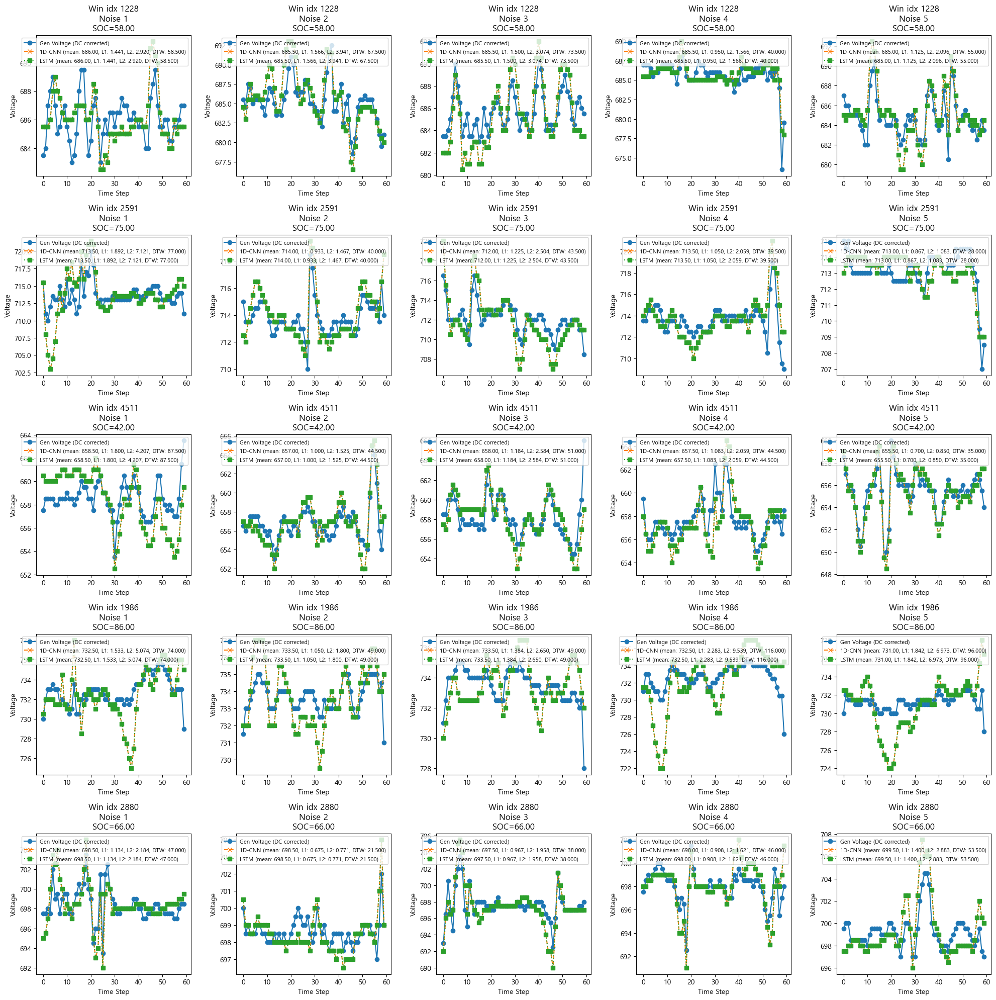

In [ ]:
def dtw_distance(x, y):
    """
    x, y: 1D numpy arrays (예: 전압 시계열)
    DTW distance를 계산합니다.
    """
    n = len(x)
    m = len(y)
    dtw = np.full((n+1, m+1), np.inf)
    dtw[0, 0] = 0
    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = abs(x[i-1] - y[j-1])
            dtw[i, j] = cost + min(dtw[i-1, j],    # insertion
                                   dtw[i, j-1],    # deletion
                                   dtw[i-1, j-1])  # match
    return dtw[n, m]
# Noise 샘플 개수
num_noise_samples = 5

# 각 noise 샘플은 매번 랜덤하게 생성 (latent_dim, window_size 전역 변수 사용)
noise_list = [ tf.random.normal([1, window_size, latent_dim]) for _ in range(num_noise_samples) ]
# 결과 저장:
# 각 윈도우(cond_list) x 각 Noise 샘플(noise_list)에 대해:
#  - gen_current
#  - gen_voltage
#  - teacher_voltage1 (1-D CNN)
#  - teacher_voltage2 (LSTM)
results_current = []
results_voltage = []
results_teacher1 = []
results_teacher2 = []

for soc_cond in cond_list:
    current_list = []
    voltage_list = []
    teacher1_list = []
    teacher2_list = []

    for noise_sample in noise_list:
        latent_output = generator_model([noise_sample, soc_cond], training=False)  # (1, window_size, 3)
        generated_seq = combine_output(latent_output, soc_cond)                   # (1, window_size, 4)

        # 전류 (index=0)와 전압 (index=2) 추출
        gen_current = generated_seq[0, :, 0].numpy()
        gen_voltage = generated_seq[0, :, 2].numpy()

        # Teacher 모델 입력: [전류, SOC, ΔI] (인덱스 [0,1,3])
        teacher_input = tf.gather(generated_seq, indices=[0,1,3], axis=-1)  # (1, window_size, 3)
        t_v1 = teacher_model(teacher_input, training=False)[0, :, 0].numpy()
        t_v2 = teacher_model_2(teacher_input, training=False)[0, :, 0].numpy()

        current_list.append(gen_current)
        voltage_list.append(gen_voltage)
        teacher1_list.append(t_v1)
        teacher2_list.append(t_v2)

    results_current.append(current_list)
    results_voltage.append(voltage_list)
    results_teacher1.append(teacher1_list)
    results_teacher2.append(teacher2_list)
# 결과 denormalization
results_current_denorm = []
results_voltage_denorm = []
results_teacher1_denorm = []
results_teacher2_denorm = []

for w in range(len(cond_list)):
    curr_denorm_list = []
    volt_denorm_list = []
    teach1_denorm_list = []
    teach2_denorm_list = []

    for n in range(num_noise_samples):
        denorm_current = denorm(results_current[w][n], 0)
        denorm_voltage = denorm(results_voltage[w][n], 2)
        denorm_t1      = denorm(results_teacher1[w][n], 2)
        denorm_t2      = denorm(results_teacher2[w][n], 2)

        curr_denorm_list.append(denorm_current)
        volt_denorm_list.append(denorm_voltage)
        teach1_denorm_list.append(denorm_t1)
        teach2_denorm_list.append(denorm_t2)

    results_current_denorm.append(curr_denorm_list)
    results_voltage_denorm.append(volt_denorm_list)
    results_teacher1_denorm.append(teach1_denorm_list)
    results_teacher2_denorm.append(teach2_denorm_list)

plt.figure(figsize=(num_noise_samples * 4, num_windows * 4))
for w in range(num_windows):
    for n in range(num_noise_samples):
        plt.subplot(num_windows, num_noise_samples, w*num_noise_samples + n + 1)

        # 원본 denormalized 전압 데이터 (shape: (window_size,))
        gen_voltage = results_voltage_denorm[w][n]
        teacher1_voltage = results_teacher1_denorm[w][n]
        teacher2_voltage = results_teacher2_denorm[w][n]

        # 각 Teacher의 평균 전압 계산
        teacher1_mean = np.mean(teacher1_voltage)
        teacher2_mean = np.mean(teacher2_voltage)
        # target_offset = (teacher1_mean + teacher2_mean) / 2.0
        target_offset = teacher2_mean

        # 생성된 전압의 평균 계산 후, DC offset 보정
        gen_voltage_mean = np.mean(gen_voltage)
        gen_voltage_corrected = gen_voltage - gen_voltage_mean + target_offset
        # gen_voltage_corrected = gen_voltage

        # 보정된 생성 전압과 각 Teacher 전압 사이의 L1, L2 Loss 계산
        teacher1_l1 = np.mean(np.abs(gen_voltage_corrected - teacher1_voltage))
        teacher1_l2 = np.mean(np.square(gen_voltage_corrected - teacher1_voltage))
        teacher2_l1 = np.mean(np.abs(gen_voltage_corrected - teacher2_voltage))
        teacher2_l2 = np.mean(np.square(gen_voltage_corrected - teacher2_voltage))

        # 보정된 생성 전압과 Teacher 전압 사이의 Pearson 상관 계수 계산
        teacher1_corr = np.corrcoef(gen_voltage_corrected, teacher1_voltage)[0, 1]
        teacher2_corr = np.corrcoef(gen_voltage_corrected, teacher2_voltage)[0, 1]

        # DTW Distance 계산 (1D 배열 간 DTW)
        teacher1_dtw = dtw_distance(gen_voltage_corrected, teacher1_voltage)
        teacher2_dtw = dtw_distance(gen_voltage_corrected, teacher2_voltage)

        # 플롯: offset 보정된 생성 전압 및 원본 Teacher 전압 개형
        plt.plot(gen_voltage_corrected, marker='o', linestyle='-',
                 label="Gen Voltage (DC corrected)")
        plt.plot(teacher1_voltage, marker='x', linestyle='--',
                 label=f"1D-CNN (mean: {teacher1_mean:.2f}, L1: {teacher1_l1:.3f}, L2: {teacher1_l2:.3f}, DTW: {teacher1_dtw:.3f})")
        plt.plot(teacher2_voltage, marker='s', linestyle=':',
                 label=f"LSTM (mean: {teacher2_mean:.2f}, L1: {teacher2_l1:.3f}, L2: {teacher2_l2:.3f}, DTW: {teacher2_dtw:.3f})")

        plt.title(f"Win idx {random_indices[w]}\nNoise {n+1}\nSOC={soc_last_list[w]:.2f}")
        plt.xlabel("Time Step")
        plt.ylabel("Voltage")
        plt.legend(loc='upper right', fontsize=8)
plt.tight_layout()
plt.show()


Selected window indices: [1019 3812 3023 4549 1686]


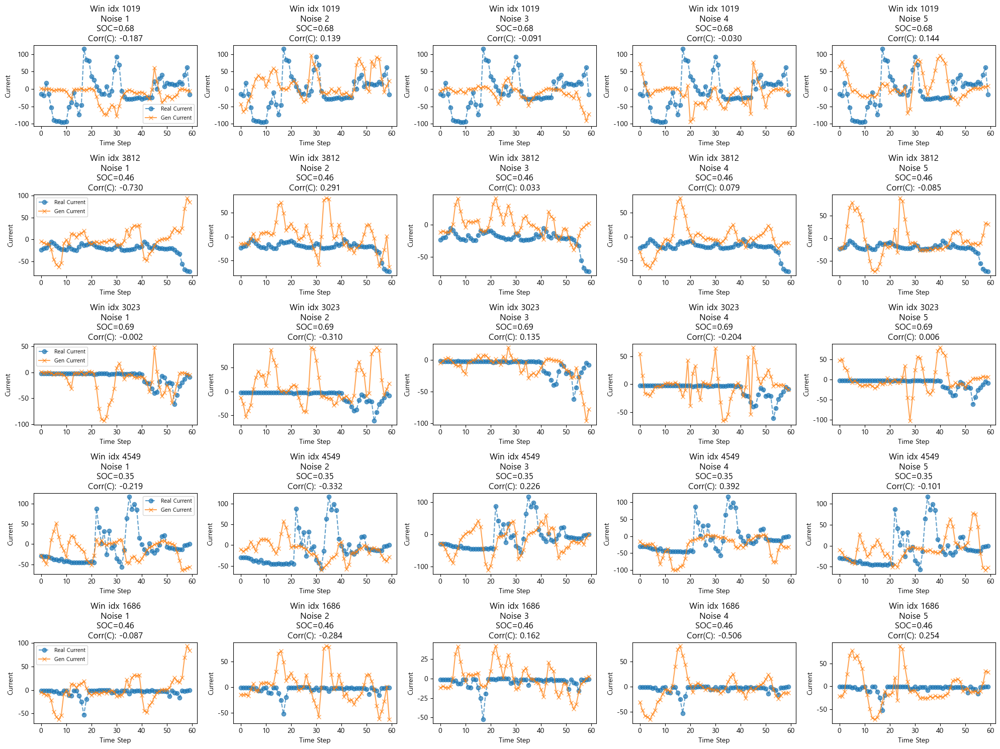

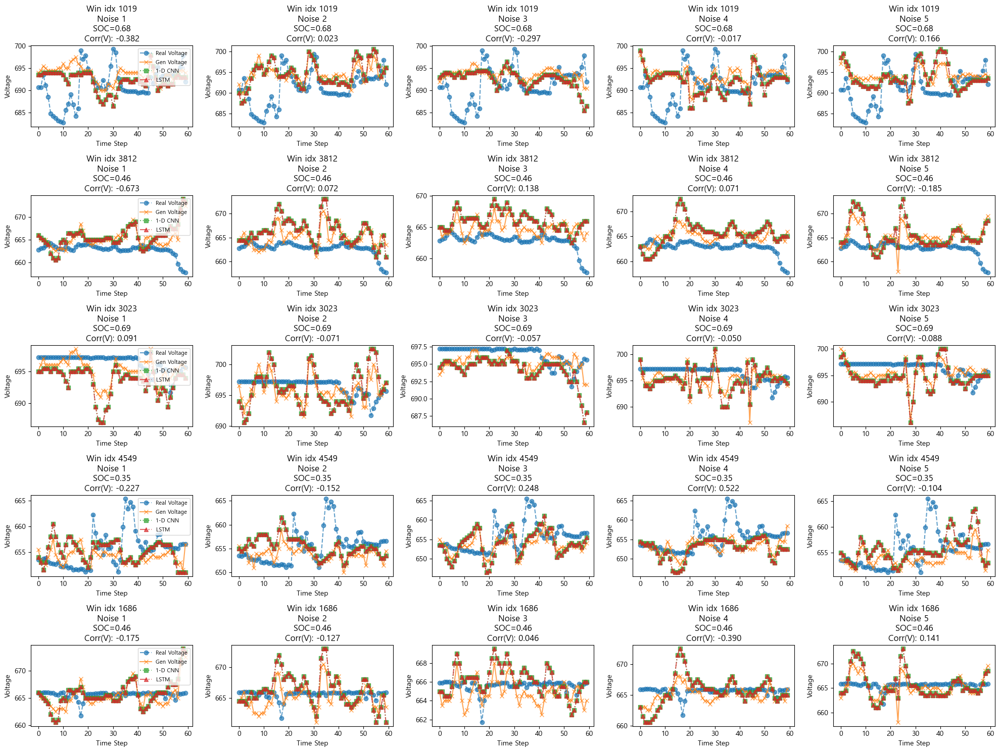

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# --- 전역 설정 ---
# all_sequences: (N, window_size, 4) → [전류, SOC, 전압, ΔI]
# window_size, latent_dim, data_min, data_max, generator_cond, get_condition, denormalize_feature 등이 이미 정의되어 있다고 가정
# data_min, data_max 배열은 채널 순서 [전류, SOC, 전압, ΔI]에 맞게 정의됨

# 예시: 단일 Generator 모델 경로 (250317 모델)
# generator_path는 전역 변수로 정의되어 있다고 가정합니다.

# 랜덤하게 5개의 윈도우 인덱스 선택
random_indices = np.random.choice(len(all_sequences), size=5, replace=False)
print("Selected window indices:", random_indices)

# 각 윈도우마다 별도의 noise 샘플 생성 (총 5개)
num_noise_samples = 5
noise_list = [ tf.random.normal([1, window_size, latent_dim]) for _ in range(num_noise_samples) ]

# Denormalization 함수 (원본 데이터 ordering: [전류, SOC, 전압, ΔI])
def denorm(arr, feature_index):
    # arr: 1D array (window_size,)
    return arr * (data_max[feature_index] - data_min[feature_index] + 1e-7) + data_min[feature_index]

# --- 평가를 위한 결과 저장 ---
# 각 선택된 윈도우에 대해, 각 noise 샘플마다 생성된 결과를 저장합니다.
# 각 결과는 튜플:
# (gen_current, gen_voltage, teacher_voltage1, teacher_voltage2, corr_current, corr_voltage, avg_SOC)
results = []
real_results = []  # 실제 window의 전류, 전압 (denormalized) 저장

for idx in random_indices:
    # 고정 윈도우 추출 (shape: (window_size, 4)) - [전류, SOC, 전압, ΔI]
    real_window = all_sequences[idx]
    real_current_norm = real_window[:, 0]  # index 0: 전류
    real_voltage_norm = real_window[:, 2]  # index 2: 전압
    real_current = denorm(real_current_norm, 0)
    real_voltage = denorm(real_voltage_norm, 2)
    real_results.append((real_current, real_voltage))

    window_results = []
    # 해당 윈도우의 SOC 추출 (shape: (1, window_size, 1))
    soc = real_window[:, 1:2][np.newaxis, ...]
    # 윈도우의 마지막 SOC 값 (denormalized) 사용
    last_soc = soc[0, -1, 0]  # scalar (정규화된 값)
    last_soc_denorm = last_soc * (data_max[1] - data_min[1] + 1e-7) + data_min[1]

    for noise_sample in noise_list:
        # Generator 실행: 입력은 (noise_sample, soc)
        latent_output = generator_model([noise_sample, soc], training=False)  # shape: (1, window_size, 3)
        generated_seq = combine_output(latent_output, soc)                   # shape: (1, window_size, 4)

        # 전류와 전압 추출 (전류: index 0, 전압: index 2)
        gen_current_norm = generated_seq[0, :, 0].numpy()
        gen_voltage_norm = generated_seq[0, :, 2].numpy()
        gen_current = denorm(gen_current_norm, 0)
        gen_voltage = denorm(gen_voltage_norm, 2)

        # Teacher 모델 입력: 생성된 시퀀스에서 [전류, SOC, ΔI] (인덱스 [0,1,3])
        teacher_input = tf.gather(generated_seq, indices=[0,1,3], axis=-1)  # shape: (1, window_size, 3)
        teacher_voltage1_norm = teacher_model(teacher_input, training=False)[0, :, 0].numpy()
        teacher_voltage2_norm = teacher_model_2(teacher_input, training=False)[0, :, 0].numpy()
        teacher_voltage1 = denorm(teacher_voltage1_norm, 2)
        teacher_voltage2 = denorm(teacher_voltage2_norm, 2)

        # Correlation 계산 (실제와 생성된 값 사이)
        corr_current = np.corrcoef(real_current, gen_current)[0, 1]
        corr_voltage = np.corrcoef(real_voltage, gen_voltage)[0, 1]

        window_results.append((gen_current, gen_voltage, teacher_voltage1, teacher_voltage2,
                               corr_current, corr_voltage, last_soc))
    results.append(window_results)

# --- Plotting ---
# 플롯: 각 윈도우마다 noise 샘플별 subplot을 구성합니다.
num_windows = len(random_indices)
num_noises = num_noise_samples

# (1) 전류 플롯
plt.figure(figsize=(num_noises * 4, num_windows * 3))
for w in range(num_windows):
    for n in range(num_noises):
        plt.subplot(num_windows, num_noises, w*num_noises + n + 1)
        gen_current = results[w][n][0]
        plt.plot(real_results[w][0], marker='o', linestyle='--', alpha=0.7, label='Real Current')
        plt.plot(gen_current, marker='x', linestyle='-', alpha=0.7, label='Gen Current')
        plt.title(f"Win idx {random_indices[w]}\nNoise {n+1}\nSOC={results[w][n][6]:.2f}\nCorr(C): {results[w][n][4]:.3f}")
        plt.xlabel("Time Step")
        plt.ylabel("Current")
        if n == 0:
            plt.legend(fontsize=8)
plt.tight_layout()
plt.show()

# (2) 전압 플롯 (Teacher 모델 포함)
plt.figure(figsize=(num_noises * 4, num_windows * 3))
for w in range(num_windows):
    for n in range(num_noises):
        plt.subplot(num_windows, num_noises, w*num_noises + n + 1)
        gen_voltage = results[w][n][1]
        teacher_voltage1 = results[w][n][2]
        teacher_voltage2 = results[w][n][3]
        plt.plot(real_results[w][1], marker='o', linestyle='--', alpha=0.7, label='Real Voltage')
        plt.plot(gen_voltage, marker='x', linestyle='-', alpha=0.7, label='Gen Voltage')
        plt.plot(teacher_voltage1, marker='s', linestyle=':', alpha=0.7, label='1-D CNN')
        plt.plot(teacher_voltage2, marker='^', linestyle='-.', alpha=0.7, label='LSTM')
        plt.title(f"Win idx {random_indices[w]}\nNoise {n+1}\nSOC={results[w][n][6]:.2f}\nCorr(V): {results[w][n][5]:.3f}")
        plt.xlabel("Time Step")
        plt.ylabel("Voltage")
        if n == 0:
            plt.legend(loc='upper right', fontsize=8)
plt.tight_layout()
plt.show()


Processing SOC 13% (1/75)
SOC=13%: Valid Samples = 5 / 1000
Processing SOC 14% (2/75)
SOC=14%: Valid Samples = 14 / 1000
Processing SOC 15% (3/75)
SOC=15%: Valid Samples = 36 / 1000
Processing SOC 16% (4/75)
SOC=16%: Valid Samples = 96 / 1000
Processing SOC 17% (5/75)
SOC=17%: Valid Samples = 138 / 1000
Processing SOC 18% (6/75)
SOC=18%: Valid Samples = 133 / 1000
Processing SOC 19% (7/75)
SOC=19%: Valid Samples = 137 / 1000
Processing SOC 20% (8/75)
SOC=20%: Valid Samples = 107 / 1000
Processing SOC 21% (9/75)
SOC=21%: Valid Samples = 102 / 1000
Processing SOC 22% (10/75)
SOC=22%: Valid Samples = 126 / 1000
Processing SOC 23% (11/75)
SOC=23%: Valid Samples = 108 / 1000
Processing SOC 24% (12/75)
SOC=24%: Valid Samples = 99 / 1000
Processing SOC 25% (13/75)
SOC=25%: Valid Samples = 87 / 1000
Processing SOC 26% (14/75)
SOC=26%: Valid Samples = 80 / 1000
Processing SOC 27% (15/75)
SOC=27%: Valid Samples = 73 / 1000
Processing SOC 28% (16/75)
SOC=28%: Valid Samples = 86 / 1000
Processing 

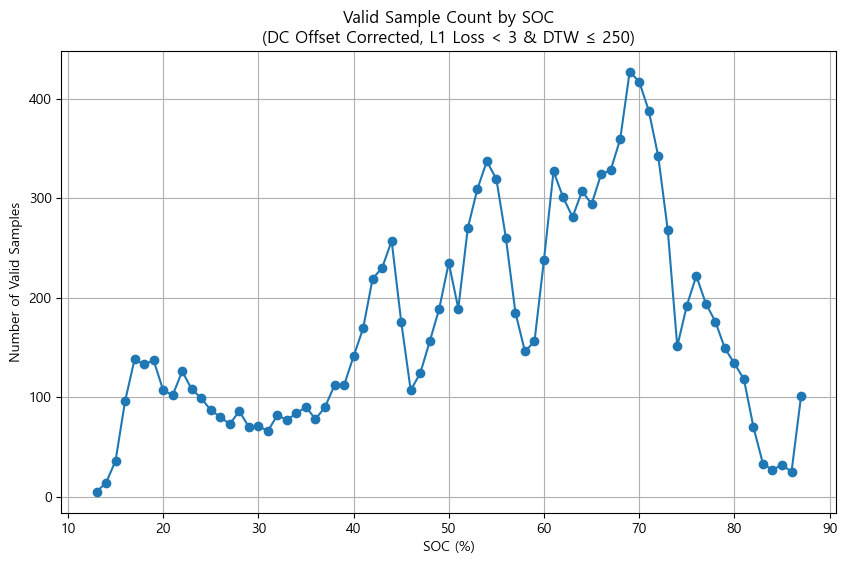

No valid samples exist for the following SOC values:


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# --- 기본 설정 (window_size, latent_dim, data_min, data_max, generator_model, teacher_model, teacher_model_2, denorm, combine_output 등은 미리 정의되었다고 가정) ---

def make_cond_batch(soc_value, window_size, data_min, data_max, batch_size):
    soc_norm = (soc_value - data_min[1]) / (data_max[1] - data_min[1] + 1e-7)
    return tf.fill([batch_size, window_size, 1], soc_norm)

# soc_values = range(1, 101)  # 1% ~ 100%
soc_values = range(int(data_min[1]), int(data_max[1])+1)
noise_per_soc = 1000

# DTW Distance 계산 함수 (1D 배열, 개형 비교)
def dtw_distance(x, y):
    n = len(x)
    m = len(y)
    dtw = np.full((n+1, m+1), np.inf)
    dtw[0, 0] = 0
    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = abs(x[i-1] - y[j-1])
            dtw[i, j] = cost + min(dtw[i-1, j],    # insertion
                                   dtw[i, j-1],    # deletion
                                   dtw[i-1, j-1])  # match
    return dtw[n, m]

counts_per_soc = {}
valid_windows = []   # 각 valid 윈도우: (X_sample, y_sample)
total_soc = len(list(soc_values))
current_soc_index = 0

for soc_value in soc_values:
    current_soc_index += 1
    print(f"Processing SOC {soc_value}% ({current_soc_index}/{total_soc})")

    # (1) cond_batch: (noise_per_soc, window_size, 1)
    cond_batch = make_cond_batch(soc_value, window_size, data_min, data_max, noise_per_soc)
    # (2) noise_batch: (noise_per_soc, window_size, latent_dim)
    noise_batch = tf.random.normal([noise_per_soc, window_size, latent_dim])
    # (3) Generator 호출: (noise_per_soc, window_size, 3)
    latent_output = generator_model([noise_batch, cond_batch], training=False)
    # (4) combine_output: (noise_per_soc, window_size, 4)
    generated_seq = combine_output(latent_output, cond_batch)

    # (5) Teacher 모델 입력: [전류, SOC, ΔI] → (noise_per_soc, window_size, 3)
    teacher_input = tf.gather(generated_seq, indices=[0,1,3], axis=-1)
    t_v1 = teacher_model(teacher_input, training=False)
    t_v2 = teacher_model_2(teacher_input, training=False)

    # (6) 전압 채널 추출 (index=2): (noise_per_soc, window_size)
    gen_voltage = generated_seq[:, :, 2]
    teacher1_voltage = t_v1[:, :, 0]
    teacher2_voltage = t_v2[:, :, 0]

    # (7) Denormalize 전압 (feature_index=2)
    gen_voltage_denorm = denorm(gen_voltage, 2)
    teacher1_voltage_denorm = denorm(teacher1_voltage, 2)
    teacher2_voltage_denorm = denorm(teacher2_voltage, 2)

    # (8) DC offset 보정: 각 샘플별 생성 전압 평균 제거 후, 두 Teacher의 평균(target_offset)으로 평행이동
    teacher1_mean = tf.reduce_mean(teacher1_voltage_denorm, axis=1)  # (noise_per_soc,)
    teacher2_mean = tf.reduce_mean(teacher2_voltage_denorm, axis=1)  # (noise_per_soc,)
    target_offset = (teacher1_mean + teacher2_mean) / 2.0            # (noise_per_soc,)

    gen_voltage_mean = tf.reduce_mean(gen_voltage_denorm, axis=1)     # (noise_per_soc,)
    gen_voltage_corrected = gen_voltage_denorm - tf.reshape(gen_voltage_mean, (-1, 1)) \
                            + tf.reshape(target_offset, (-1, 1))  # (noise_per_soc, window_size)

    # (9) 각 샘플별 L1 Loss 계산 (보정 후)
    l1_1d_all = tf.reduce_mean(tf.abs(gen_voltage_corrected - teacher1_voltage_denorm), axis=1)  # (noise_per_soc,)
    l1_lstm_all = tf.reduce_mean(tf.abs(gen_voltage_corrected - teacher2_voltage_denorm), axis=1)  # (noise_per_soc,)

    # (10) 각 샘플별 DTW Distance 계산 (개별 반복)
    dtw_1d_all = []
    dtw_lstm_all = []
    for i in range(noise_per_soc):
        sample_gen = gen_voltage_corrected[i].numpy()
        sample_teacher1 = teacher1_voltage_denorm[i].numpy()
        sample_teacher2 = teacher2_voltage_denorm[i].numpy()
        dtw_1d_all.append(dtw_distance(sample_gen, sample_teacher1))
        dtw_lstm_all.append(dtw_distance(sample_gen, sample_teacher2))
    dtw_1d_all = np.array(dtw_1d_all)
    dtw_lstm_all = np.array(dtw_lstm_all)

    # (11) valid mask: L1 Loss < 3.0 AND DTW Distance ≤ 250 for both Teacher models
    valid_mask = tf.logical_and(tf.logical_and(l1_1d_all < 5.0, l1_lstm_all < 1.0),
                                tf.logical_and(tf.constant(dtw_1d_all, dtype=tf.float32) <= 300.0,
                                               tf.constant(dtw_lstm_all, dtype=tf.float32) <= 100.0))
    valid_mask_np = valid_mask.numpy()  # (noise_per_soc,)

    # (12) 조건을 만족하는 각 샘플에 대해, 생성된 윈도우 저장
    for i in range(noise_per_soc):
        if valid_mask_np[i]:
            window = generated_seq[i].numpy()  # (window_size, 4)
            X_sample = window[:, [0,1,3]]         # 입력: [전류, SOC, ΔI]
            y_sample = gen_voltage_corrected[i].numpy()  # 출력: 보정된 전압
            valid_windows.append((X_sample, y_sample))

    valid_count = np.sum(valid_mask_np)
    counts_per_soc[soc_value] = valid_count
    print(f"SOC={soc_value}%: Valid Samples = {valid_count} / {noise_per_soc}")

# 최종 결과 출력
total_valid = len(valid_windows)
print(f"Total valid samples: {total_valid}")

# SOC별 valid sample 개수를 플롯
soc_keys = sorted(counts_per_soc.keys())
valid_counts = [counts_per_soc[soc] for soc in soc_keys]

plt.figure(figsize=(10, 6))
plt.plot(soc_keys, valid_counts, marker='o', linestyle='-')
plt.xlabel("SOC (%)")
plt.ylabel("Number of Valid Samples")
plt.title("Valid Sample Count by SOC\n(DC Offset Corrected, L1 Loss < 3 & DTW ≤ 250)")
plt.grid(True)
plt.show()

# valid sample이 0인 SOC 영역 추출
no_valid_soc = {soc: count for soc, count in counts_per_soc.items() if count == 0}

print("No valid samples exist for the following SOC values:")
for soc, count in no_valid_soc.items():
    print(f"SOC = {soc}%: {count} valid samples")


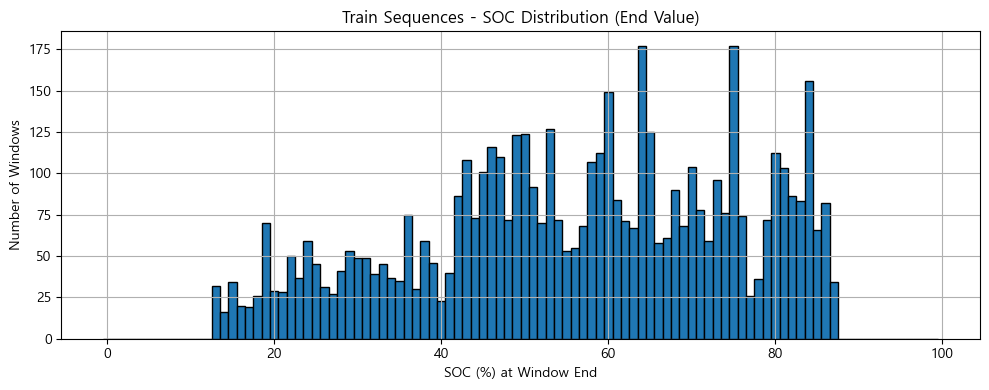

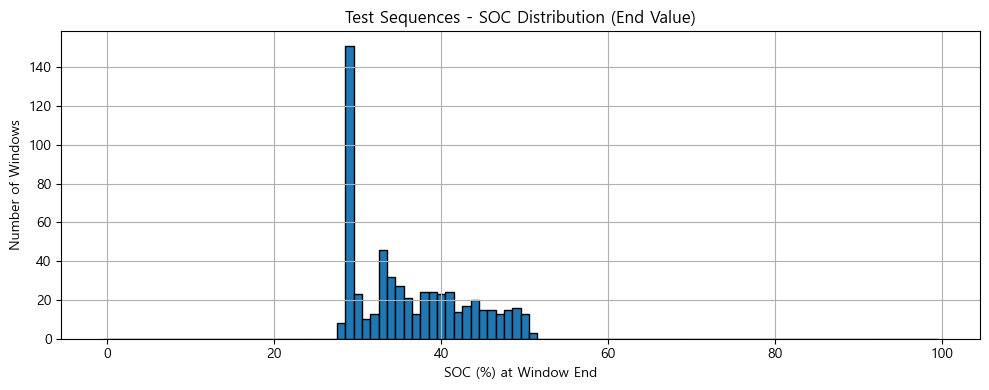

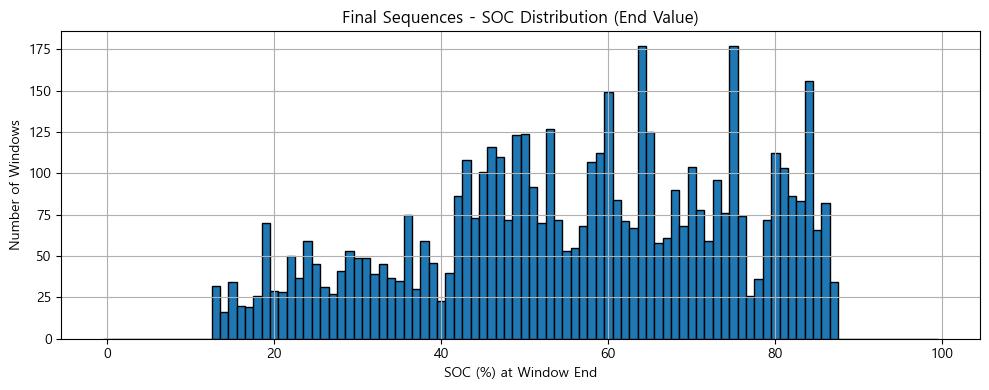

Train Sequences: SOC values with zero windows: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
Test Sequences: SOC values with zero windows: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
Final Sequences: SOC values with zero windows: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]


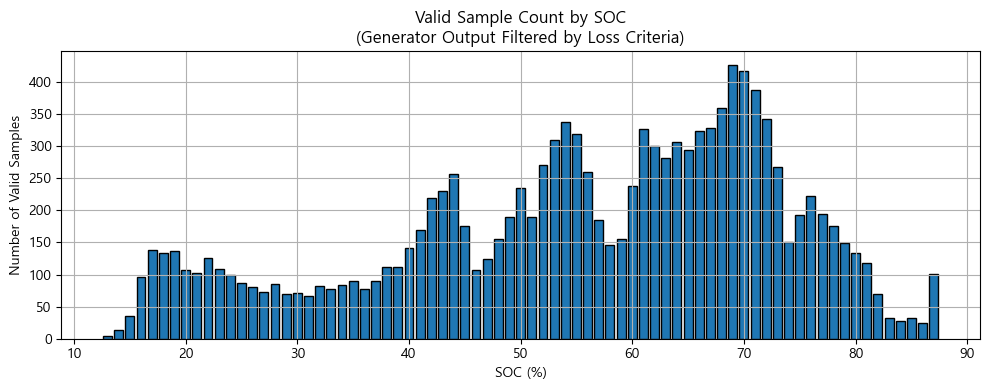

Valid Sequences: SOC values with zero valid windows:


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------------
# 전제: 아래 변수들은 이미 정의되어 있음
# - train_sequences, test_sequences, final_sequences:
#       각각 (N_train, window_size, 4), (N_test, window_size, 4), (N_final, window_size, 4)
#       최종 컬럼 순서: [Current, SOC, Voltage, △I]
# - data_min, data_max: 각 채널의 최소/최대값 (NumPy array)
# - feature_names: ['Current', 'SOC', 'Voltage', '△I']
# - counts_per_soc: CGAN 생성 시 valid 데이터의 SOC별 윈도우 수를 담은 dictionary (예: {SOC: count})
# -----------------------------------------

# (1) 마지막 시점의 SOC를 추출하는 함수
def extract_end_soc(sequences):
    """
    sequences: shape (num_windows, window_size, 4)
    마지막 시점의 SOC 값(채널 'SOC'의 값)을 1D array로 반환
    """
    end_index = sequences.shape[1] - 1
    soc_index = feature_names.index('SOC')
    return sequences[:, end_index, soc_index]  # shape (num_windows,)

# (2) 역정규화 함수: 정규화된 값(scaled_val)을 원래 스케일로 복원
def inverse_minmax(scaled_val, original_min, original_max):
    return scaled_val * (original_max - original_min + 1e-7) + original_min

soc_min = data_min[1]
soc_max = data_max[1]

# (3) 각 데이터셋에 대해 마지막 SOC 값 복원
train_soc_ends = inverse_minmax(extract_end_soc(train_sequences), soc_min, soc_max)
test_soc_ends  = inverse_minmax(extract_end_soc(test_sequences), soc_min, soc_max)
final_soc_ends = inverse_minmax(extract_end_soc(final_sequences), soc_min, soc_max)

# (4) 히스토그램 플롯 함수 (각 데이터셋에서 SOC 분포: 1% 간격 bin 사용)
def plot_real_soc_histogram(soc_ends, title):
    plt.figure(figsize=(10, 4))
    # bin: 0부터 101까지 1씩 증가 (SOC %)
    bins = np.arange(0, 101, 1)
    plt.hist(soc_ends, bins=bins, edgecolor='k', align='left')
    plt.title(title)
    plt.xlabel('SOC (%) at Window End')
    plt.ylabel('Number of Windows')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# (5) 각 데이터셋에 대한 히스토그램 플롯
plot_real_soc_histogram(train_soc_ends, "Train Sequences - SOC Distribution (End Value)")
plot_real_soc_histogram(test_soc_ends, "Test Sequences - SOC Distribution (End Value)")
plot_real_soc_histogram(final_soc_ends, "Final Sequences - SOC Distribution (End Value)")

# (6) 각 데이터셋에서 "윈도우가 단 한 개도 없는 SOC" 값을 찾기 위해,
#     먼저 각 데이터셋의 SOC를 정수(percent) 단위로 반올림 후 히스토그램을 구함.
def find_zero_count_soc(soc_ends):
    # 각 SOC를 정수로 반올림 (예: 62.3 → 62)
    soc_int = np.round(soc_ends).astype(int)
    # bin: 0부터 100까지 (SOC 퍼센트)
    bins = np.arange(0, 101, 1)
    counts, bin_edges = np.histogram(soc_int, bins=bins)
    # bin_edges는 0부터 100 미만까지, counts 배열의 각 원소가 해당 구간의 창 수
    zero_soc = []
    for i, c in enumerate(counts):
        if c == 0:
            zero_soc.append(i)
    return zero_soc, counts

train_zero_soc, train_counts = find_zero_count_soc(train_soc_ends)
test_zero_soc, test_counts = find_zero_count_soc(test_soc_ends)
final_zero_soc, final_counts = find_zero_count_soc(final_soc_ends)

print("Train Sequences: SOC values with zero windows:", train_zero_soc)
print("Test Sequences: SOC values with zero windows:", test_zero_soc)
print("Final Sequences: SOC values with zero windows:", final_zero_soc)

# (7) valid 데이터에 대한 히스토그램은 보통 CGAN 생성시 계산한 counts_per_soc dictionary를 사용합니다.
#     예를 들어, counts_per_soc = {soc_value: valid_count, ...} 형태라면:

if 'counts_per_soc' in globals():
    valid_soc_keys = sorted(counts_per_soc.keys())
    valid_counts = [counts_per_soc[soc] for soc in valid_soc_keys]
    plt.figure(figsize=(10, 4))
    plt.bar(valid_soc_keys, valid_counts, width=0.8, edgecolor='k')
    plt.xlabel("SOC (%)")
    plt.ylabel("Number of Valid Samples")
    plt.title("Valid Sample Count by SOC\n(Generator Output Filtered by Loss Criteria)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    valid_zero_soc = {soc: count for soc, count in counts_per_soc.items() if count == 0}
    print("Valid Sequences: SOC values with zero valid windows:")
    for soc, count in valid_zero_soc.items():
        print(f"SOC = {soc}%: {count} valid samples")
else:
    print("counts_per_soc 변수는 정의되어 있지 않습니다. (Valid 데이터의 SOC별 창 수를 계산하지 않았습니다.)")


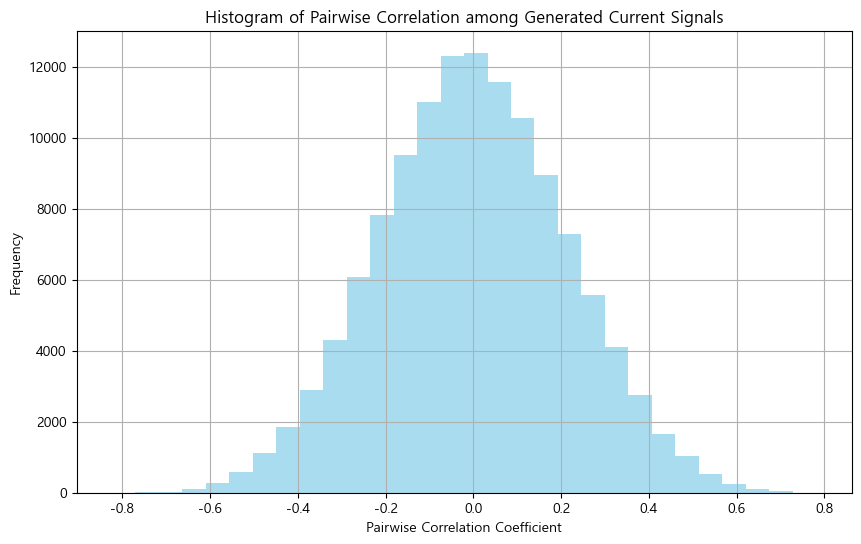

Average pairwise correlation: -0.00035201672972435833


c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
c:\Users\user\anaconda3\envs\hjjang\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


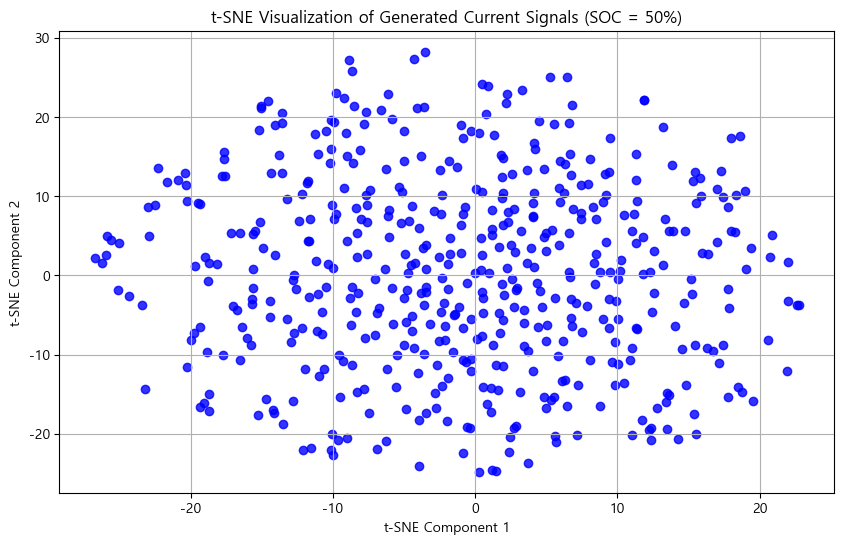

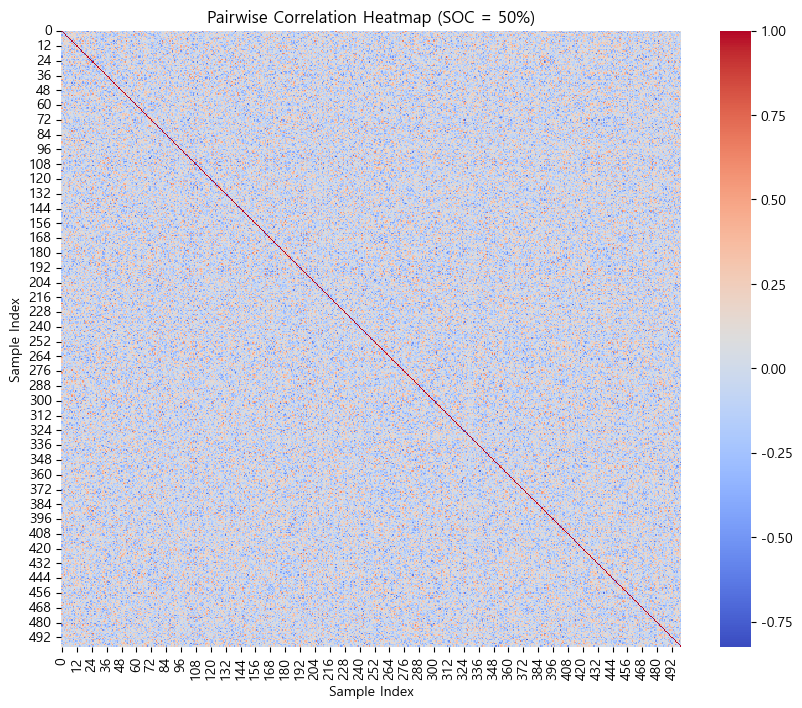

KMeans Cluster Distribution (SOC = 50%):
  Cluster 1: 223 samples
  Cluster 0: 128 samples
  Cluster 2: 149 samples


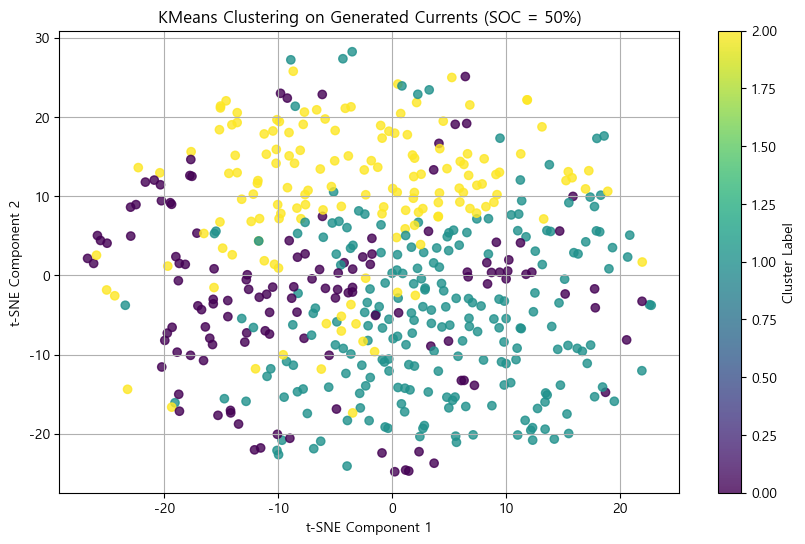

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.cluster import KMeans
from collections import Counter

# 전제: 아래 변수 및 함수들은 이미 정의되어 있음
# window_size, latent_dim, data_min, data_max,
# generator_model, combine_output, denorm, make_cond_batch

# =============================================================================
# 1. 특정 SOC(예: 31%)에서 데이터 생성 및 전류 시계열 복원
# =============================================================================
desired_soc = 50
batch_size = 500  # 10행 5열

# 조건 텐서 생성: (batch_size, window_size, 1)
cond = make_cond_batch(desired_soc, window_size, data_min, data_max, batch_size)

# 노이즈 배치 생성: (batch_size, window_size, latent_dim)
noise = tf.random.normal([batch_size, window_size, latent_dim])

# Generator 호출: (batch_size, window_size, 3)
latent_output = generator_model([noise, cond], training=False)

# combine_output: 최종 시퀀스 구성 (순서: [Current, SOC, Voltage, ΔI])
generated_seq = combine_output(latent_output, cond)

# 전류(Current) 채널 추출 (인덱스 0)
current_series = generated_seq[:, :, 0]  # shape: (batch_size, window_size)

# 원래 스케일로 복원: current_denorm의 shape = (batch_size, window_size)
current_denorm = denorm(current_series, 0)

# # =============================================================================
# # 2. 10행 5열 그리드로 전류 시계열 플롯
# # =============================================================================
# fig, axes = plt.subplots(10, 5, figsize=(20, 40), sharex=True, sharey=True)
# axes = axes.flatten()
# for i in range(batch_size):
#     axes[i].plot(current_denorm[i], marker='o', markersize=2, linewidth=1)
#     axes[i].set_title(f"Sample {i+1}\nSOC = {desired_soc}%")
#     axes[i].set_xlabel("Time Step")
#     axes[i].set_ylabel("Current")
# plt.tight_layout()
# plt.show()

# =============================================================================
# 3. 샘플 간 Pairwise Correlation 히스토그램
# =============================================================================
pairwise_corr = []
for i in range(batch_size):
    for j in range(i+1, batch_size):
        # 각 샘플은 1D 시계열 (window_size,)
        corr_matrix = np.corrcoef(current_denorm[i], current_denorm[j])
        corr = corr_matrix[0, 1]
        pairwise_corr.append(corr)
pairwise_corr = np.array(pairwise_corr)

plt.figure(figsize=(10, 6))
plt.hist(pairwise_corr, bins=30, color='skyblue', alpha=0.7)
plt.xlabel("Pairwise Correlation Coefficient")
plt.ylabel("Frequency")
plt.title("Histogram of Pairwise Correlation among Generated Current Signals")
plt.grid(True)
plt.show()

print("Average pairwise correlation:", np.mean(pairwise_corr))

# =============================================================================
# 4. 다양성 분석: t-SNE, 상관관계 히트맵, KMeans 클러스터링
# =============================================================================

# 4-1. t-SNE 시각화
tsne = TSNE(n_components=2, perplexity=15, random_state=42)
tsne_result = tsne.fit_transform(current_denorm)  # (batch_size, 2)

plt.figure(figsize=(10, 6))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c='blue', alpha=0.8)
plt.title(f"t-SNE Visualization of Generated Current Signals (SOC = {desired_soc}%)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.grid(True)
plt.show()

# 4-2. Pairwise Correlation Heatmap
corr_matrix_full = np.corrcoef(current_denorm)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_full, cmap="coolwarm", annot=False)
plt.title(f"Pairwise Correlation Heatmap (SOC = {desired_soc}%)")
plt.xlabel("Sample Index")
plt.ylabel("Sample Index")
plt.show()

# 4-3. KMeans 클러스터링
n_clusters = 3  # 클러스터 수는 데이터 특성에 맞게 조정 가능
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(current_denorm)

# 클러스터 분포 출력
cluster_counts = Counter(cluster_labels)
print(f"KMeans Cluster Distribution (SOC = {desired_soc}%):")
for cid, count in cluster_counts.items():
    print(f"  Cluster {cid}: {count} samples")

# t-SNE 결과에 클러스터 색상 입혀서 시각화
plt.figure(figsize=(10, 6))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=cluster_labels, cmap='viridis', alpha=0.8)
plt.title(f"KMeans Clustering on Generated Currents (SOC = {desired_soc}%)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.colorbar(label="Cluster Label")
plt.grid(True)
plt.show()


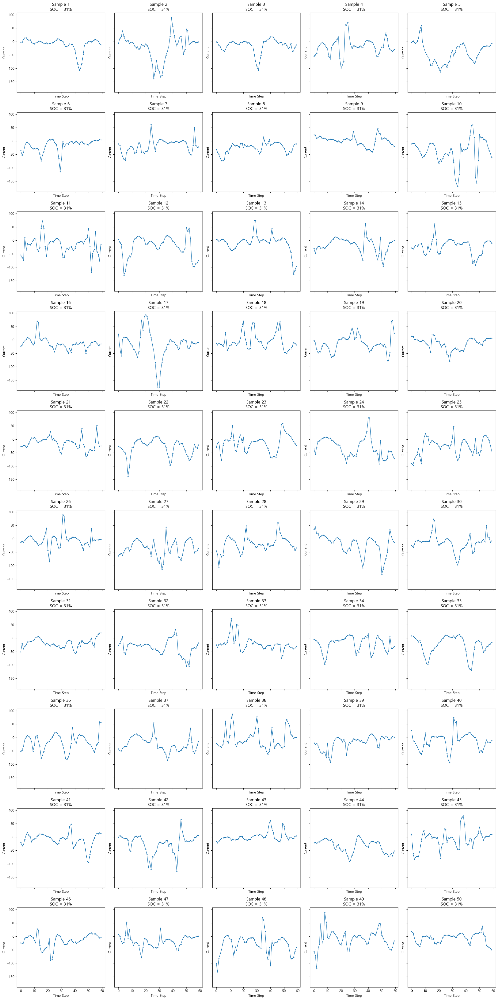

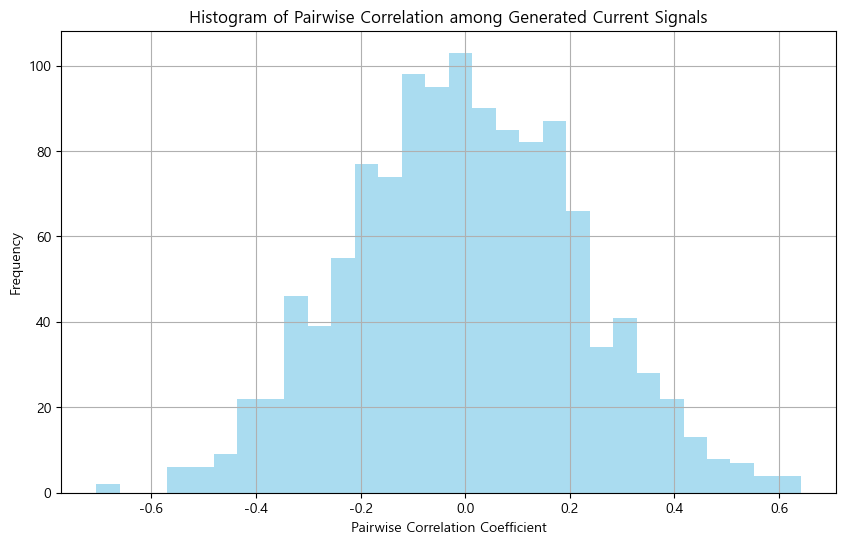

Average pairwise correlation: -0.0006951688042296978


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# 원하는 SOC 값을 직접 입력 (예: 50%)
desired_soc = 31
batch_size = 50  # 10행 5열

# 1. 조건 텐서 생성: (batch_size, window_size, 1)
cond = make_cond_batch(desired_soc, window_size, data_min, data_max, batch_size)

# 2. 노이즈 배치 생성: (batch_size, window_size, latent_dim)
noise = tf.random.normal([batch_size, window_size, latent_dim])

# 3. Generator 호출: (batch_size, window_size, 3)
latent_output = generator_model([noise, cond], training=False)

# 4. combine_output을 통해 최종 시퀀스 구성: (batch_size, window_size, 4)
# 최종 순서: [Current, SOC, Voltage, ΔI]
generated_seq = combine_output(latent_output, cond)

# 5. 생성된 시퀀스에서 전류(Current) 채널 추출 (인덱스 0)
current_series = generated_seq[:, :, 0]  # shape: (batch_size, window_size)

# 6. 필요하다면 denorm 함수를 사용하여 current를 원래 scale로 복원 (feature index 0)
current_denorm = denorm(current_series, 0)

# 7. 10행 5열 그리드로 전류 시계열 플롯
fig, axes = plt.subplots(10, 5, figsize=(20, 40), sharex=True, sharey=True)
axes = axes.flatten()

for i in range(batch_size):
    axes[i].plot(current_denorm[i], marker='o', markersize=2, linewidth=1)
    axes[i].set_title(f"Sample {i+1}\nSOC = {desired_soc}%")
    axes[i].set_xlabel("Time Step")
    axes[i].set_ylabel("Current")
    # axes[i].set_ylim(-40, 0)  # y축 범위 고정

plt.tight_layout()
plt.show()

# 50개 샘플 간의 pairwise correlation 계산
pairwise_corr = []
for i in range(batch_size):
    for j in range(i+1, batch_size):
        # 각 샘플의 current_denorm는 1D 시계열 (window_size,)
        corr_matrix = np.corrcoef(current_denorm[i], current_denorm[j])
        corr = corr_matrix[0, 1]
        pairwise_corr.append(corr)

pairwise_corr = np.array(pairwise_corr)

# pairwise correlation의 히스토그램 플롯
plt.figure(figsize=(10, 6))
plt.hist(pairwise_corr, bins=30, color='skyblue', alpha=0.7)
plt.xlabel("Pairwise Correlation Coefficient")
plt.ylabel("Frequency")
plt.title("Histogram of Pairwise Correlation among Generated Current Signals")
plt.grid(True)
plt.show()

# 평균 correlation 출력 (높을수록 모드 콜랩스 가능성이 큼)
print("Average pairwise correlation:", np.mean(pairwise_corr))



In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, GRU, Dense
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, Callback

# =============================================================================
# 1. 데이터셋 구성: valid_windows의 모든 샘플 사용, 출력은 마지막 시점의 전압
# =============================================================================
def prepare_dataset_single_target(valid_windows):
    X_list = []
    y_list = []
    for window in valid_windows:
        # valid_windows의 각 요소는 (X_sample, y_sample, soc_value) 형식이라고 가정
        if len(window) == 3:
            X_sample, y_sample, soc = window
        else:
            X_sample, y_sample = window
        X_list.append(X_sample)            # X_sample: (window_size, 3)
        y_list.append(y_sample[-1])          # y_sample: (window_size,), 마지막 시점만 target으로 사용
    X_data = np.array(X_list)              # (num_samples, window_size, 3)
    y_data = np.array(y_list)              # (num_samples,)
    y_data = np.expand_dims(y_data, -1)      # (num_samples, 1)
    return X_data, y_data

X_data, y_data = prepare_dataset_single_target(valid_windows)
print("X_data shape:", X_data.shape)
print("y_data shape:", y_data.shape)

# 정규화: 전압은 feature index 2 사용 (data_min, data_max는 이미 계산된 값)
epsilon = 1e-7
y_data_norm = (y_data - data_min[2]) / (data_max[2] - data_min[2] + epsilon)
print("y_data_norm head:")
print(y_data_norm[:5])

# =============================================================================
# 2. GRU 모델 구성 (출력은 단일 시점 예측)
# =============================================================================
def build_gru_model_single_target(window_size, feature_dim):
    inp = Input(shape=(window_size, feature_dim))
    # 여러 GRU 레이어 쌓기, 마지막 레이어는 return_sequences=False로 마지막 시점만 반환
    x = GRU(64, return_sequences=True)(inp)
    x = GRU(64, return_sequences=True)(x)
    x = GRU(32, return_sequences=True)(x)
    x = GRU(32, return_sequences=False)(x)  # 마지막 시점의 출력만 반환
    # 출력층: 단일 값 예측, sigmoid 활성화 (정규화된 0~1 값)
    out = Dense(1, activation='sigmoid')(x)
    model = Model(inp, out, name="GRU_Voltage_Predictor_SingleTarget")
    return model

gru_model = build_gru_model_single_target(window_size, feature_dim=3)
gru_model.summary()

# =============================================================================
# 3. 콜백 및 학습 설정
# =============================================================================
class PrintLossCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 100 == 0:
            loss = logs.get("loss")
            val_loss = logs.get("val_loss")
            print(f"Epoch {epoch+1}: Loss = {loss:.4f}, Val Loss = {val_loss:.4f}")

def lr_decay(epoch, lr):
    if epoch > 0 and epoch % 100 == 0:
        return lr * 0.9
    return lr

lr_scheduler = LearningRateScheduler(lr_decay, verbose=1)
checkpoint = ModelCheckpoint("single_target_gru_voltage_model.h5", monitor='val_loss',
                             save_best_only=True, verbose=1)

# =============================================================================
# 4. 모델 컴파일 및 학습
# =============================================================================
gru_model.compile(optimizer=Adam(learning_rate=1e-4), loss='mse')
history = gru_model.fit(X_data, y_data, epochs=100, batch_size=64, validation_split=0.1,
                        callbacks=[lr_scheduler, checkpoint, PrintLossCallback()])

# =============================================================================
# 5. 학습 결과 평가 및 플롯
# =============================================================================
# 저장된 best 모델 불러오기
loaded_model = load_model("single_target_gru_voltage_model.h5")
y_pred_norm = loaded_model.predict(X_data)  # (num_samples, 1)

# Denormalization: 전압 복원 (feature index 2)
def denorm_vector(vec, feature_index, data_min, data_max):
    return vec * (data_max[feature_index] - data_min[feature_index] + epsilon) + data_min[feature_index]
def denorm(x, feature_index):
    return denorm_vector(x, feature_index, data_min, data_max)

y_pred = denorm(y_pred_norm, 2)
y_true = denorm(y_data_norm, 2)

# 샘플별 실제 전압과 예측 전압 플롯 (scatter plot)
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_true)), y_true, label="True Voltage", marker='o')
plt.scatter(range(len(y_pred)), y_pred, label="Predicted Voltage", marker='x')
plt.xlabel("Sample Index")
plt.ylabel("Voltage")
plt.title("True vs Predicted Voltage (Single Target)")
plt.legend()
plt.grid(True)
plt.show()

# 오차 히스토그램
error = y_true - y_pred
plt.figure(figsize=(10,6))
plt.hist(error, bins=30, color='orange', alpha=0.7)
plt.xlabel("Error (True - Predicted)")
plt.ylabel("Count")
plt.title("Error Histogram")
plt.grid(True)
plt.show()

print("Average Absolute Error:", np.mean(np.abs(error)))


X_data shape: (12758, 60, 3)
y_data shape: (12758, 1)
y_data_norm head:
[[0.1285]
 [0.0964]
 [0.1124]
 [0.0763]
 [0.0643]]
Model: "GRU_Voltage_Predictor_SingleTarget"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 60, 3)]           0         
                                                                 
 gru_48 (GRU)                (None, 60, 64)            13248     
                                                                 
 gru_49 (GRU)                (None, 60, 64)            24960     
                                                                 
 gru_50 (GRU)                (None, 60, 32)            9408      
                                                                 
 gru_51 (GRU)                (None, 32)                6336      
                                                                 
 dense_14 (Dense)            (None, 1)   

KeyboardInterrupt: 

Test X shape: (580, 60, 3)
Test Y shape: (580, 1)
19/19 [==============================] - 0s 6ms/step


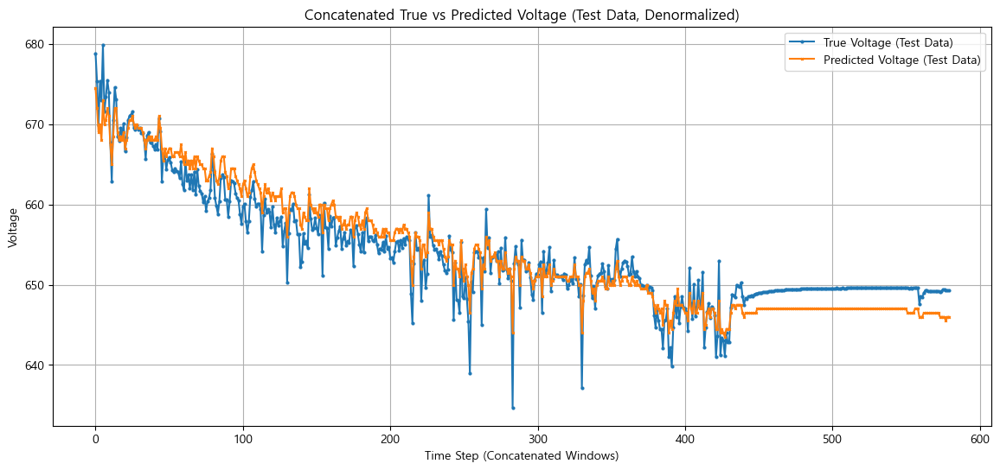

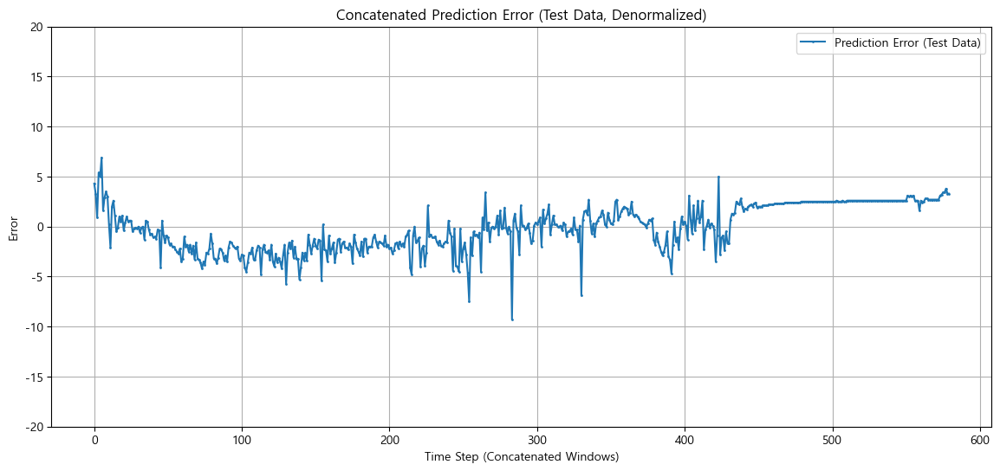

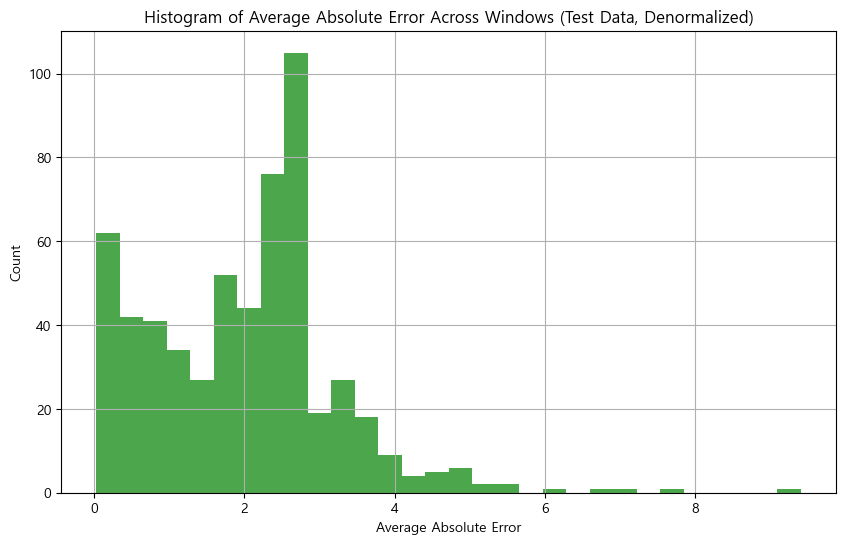

Average Absolute Error on Test Data (Denormalized): 1.9882
RMSE on Test Data (Denormalized): 2.2899
RMSE/192 on Test Data (Denormalized): 0.0119


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model

# ------------------------------------------------------
# 전제: 아래 변수들은 이미 정의되어 있음
# - window_size, data_min, data_max, denorm, loaded_model 등
# - test_sequences: shape = (N_test, window_size, 4)
#    최종 컬럼 순서: [Current, SOC, Voltage, △I]
# ------------------------------------------------------

# 1. 입력과 타깃 분리
# GRU 모델의 입력: [Current, SOC, △I] (인덱스: 0, 1, 3)
# 타깃: Voltage (인덱스: 2)
test_X = test_sequences[:, :, [0, 1, 3]]
test_Y = test_sequences[:, -1, 2]   # 마지막 시점 값만 선택
test_Y = np.expand_dims(test_Y, -1)

# test_X = train_sequences[:, :, [0, 1, 3]]
# test_Y = train_sequences[:, -1, 2]   # 마지막 시점 값만 선택
# test_Y = np.expand_dims(test_Y, -1)

print("Test X shape:", test_X.shape)
print("Test Y shape:", test_Y.shape)

# 2. 모델 예측
y_pred_test = loaded_model.predict(test_X)  # shape: (N_test, window_size, 1)
num_samples_test = test_X.shape[0]

# 3. 각 샘플의 시계열을 이어붙여 하나의 긴 시계열로 만듭니다.
concatenated_true_test = np.concatenate([np.atleast_1d(test_Y[i].squeeze()) for i in range(num_samples_test)])
concatenated_pred_test = np.concatenate([np.atleast_1d(y_pred_test[i].squeeze()) for i in range(num_samples_test)])
concatenated_error_test = concatenated_true_test - concatenated_pred_test


# 4. Denormalize (Voltage는 feature index 2)
concatenated_true_test_denorm = denorm(concatenated_true_test, 2)
concatenated_pred_test_denorm = denorm(concatenated_pred_test, 2)
concatenated_error_test_denorm = concatenated_true_test_denorm - concatenated_pred_test_denorm

# 5. 플롯: 실제 전압과 예측 전압
plt.figure(figsize=(14, 6))
plt.plot(concatenated_true_test_denorm, label="True Voltage (Test Data)",
         marker='o', markersize=2)
plt.plot(concatenated_pred_test_denorm, label="Predicted Voltage (Test Data)",
         marker='x', markersize=2)
plt.xlabel("Time Step (Concatenated Windows)")
plt.ylabel("Voltage")
plt.title("Concatenated True vs Predicted Voltage (Test Data, Denormalized)")
plt.legend()
plt.grid(True)
plt.show()

# 6. 플롯: 예측 오차 (실제 - 예측)
plt.figure(figsize=(14, 6))
plt.plot(concatenated_error_test_denorm, label="Prediction Error (Test Data)",
         marker='.', markersize=2)
plt.xlabel("Time Step (Concatenated Windows)")
plt.ylabel("Error")
plt.title("Concatenated Prediction Error (Test Data, Denormalized)")
plt.legend()
plt.ylim(-20,20)
plt.grid(True)
plt.show()

# 7. 각 윈도우별 평균 절대 오차 분포 히스토그램
window_abs_errors_test = [np.mean(np.abs(test_Y[i].squeeze() - y_pred_test[i].squeeze()))
                            for i in range(num_samples_test)]
window_abs_errors_test_denorm = [np.mean(np.abs(denorm(test_Y[i].squeeze(), 2) -
                                                   denorm(y_pred_test[i].squeeze(), 2)))
                                 for i in range(num_samples_test)]

plt.figure(figsize=(10, 6))
plt.hist(window_abs_errors_test_denorm, bins=30, color='green', alpha=0.7)
plt.title("Histogram of Average Absolute Error Across Windows (Test Data, Denormalized)")
plt.xlabel("Average Absolute Error")
plt.ylabel("Count")
plt.grid(True)
plt.show()

avg_abs_error_test = np.mean(window_abs_errors_test_denorm)
print("Average Absolute Error on Test Data (Denormalized): {:.4f}".format(avg_abs_error_test))

# RMSE 계산
rmse = np.sqrt(np.mean(np.square(concatenated_error_test_denorm)))
rmse_div_192 = rmse / 192

print("RMSE on Test Data (Denormalized): {:.4f}".format(rmse))
print("RMSE/192 on Test Data (Denormalized): {:.4f}".format(rmse_div_192))


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, GRU, Dense
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, Callback

# =============================================================================
# 1. 데이터셋 구성: valid_windows의 모든 샘플 사용, 출력은 마지막 시점의 전압
# =============================================================================
def prepare_dataset_single_target(valid_windows):
    X_list = []
    y_list = []
    for window in valid_windows:
        # valid_windows의 각 요소는 (X_sample, y_sample, soc_value) 형식이라고 가정
        if len(window) == 3:
            X_sample, y_sample, soc = window
        else:
            X_sample, y_sample = window
        X_list.append(X_sample)            # X_sample: (window_size, 3)
        y_list.append(y_sample[-1])          # y_sample: (window_size,), 마지막 시점만 target으로 사용
    X_data = np.array(X_list)              # (num_samples, window_size, 3)
    y_data = np.array(y_list)              # (num_samples,)
    y_data = np.expand_dims(y_data, -1)      # (num_samples, 1)
    return X_data, y_data

X_data, y_data = prepare_dataset_single_target(valid_windows)

epsilon = 1e-7

X_orig      = train_sequences[..., [0,1,3]]      # (N_orig, window_size, 3)
y_orig_norm = train_sequences[:, -1, 2:3]        # (N_orig, 1), 이미 정규화된 전압
X_data      = np.concatenate([X_orig, X_data], axis=0)
y_data_norm = np.concatenate([y_orig_norm, y_data_norm], axis=0)
print("X_data shape:", X_data.shape)
print("y_data shape:", y_data.shape)

# =============================================================================
# 2. GRU 모델 구성 (출력은 단일 시점 예측)
# =============================================================================
def build_gru_model_single_target(window_size, feature_dim):
    inp = Input(shape=(window_size, feature_dim))
    # 여러 GRU 레이어 쌓기, 마지막 레이어는 return_sequences=False로 마지막 시점만 반환
    x = GRU(64, return_sequences=True)(inp)
    x = GRU(64, return_sequences=True)(x)
    x = GRU(32, return_sequences=True)(x)
    x = GRU(32, return_sequences=False)(x)  # 마지막 시점의 출력만 반환
    # 출력층: 단일 값 예측, sigmoid 활성화 (정규화된 0~1 값)
    out = Dense(1, activation='sigmoid')(x)
    model = Model(inp, out, name="GRU_Voltage_Predictor_SingleTarget")
    return model

gru_model = build_gru_model_single_target(window_size, feature_dim=3)
gru_model.summary()

# =============================================================================
# 3. 콜백 및 학습 설정
# =============================================================================
class PrintLossCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 100 == 0:
            loss = logs.get("loss")
            val_loss = logs.get("val_loss")
            print(f"Epoch {epoch+1}: Loss = {loss:.4f}, Val Loss = {val_loss:.4f}")

def lr_decay(epoch, lr):
    if epoch > 0 and epoch % 100 == 0:
        return lr * 0.9
    return lr

lr_scheduler = LearningRateScheduler(lr_decay, verbose=1)
checkpoint = ModelCheckpoint("single_target_gru_voltage_model.h5", monitor='val_loss',
                             save_best_only=True, verbose=1)

# =============================================================================
# 4. 모델 컴파일 및 학습
# =============================================================================
gru_model.compile(optimizer=Adam(learning_rate=1e-4), loss='mse')
history = gru_model.fit(X_data, y_data_norm, epochs=100, batch_size=64, validation_split=0.1,
                        callbacks=[lr_scheduler, checkpoint, PrintLossCallback()])

# =============================================================================
# 5. 학습 결과 평가 및 플롯
# =============================================================================
# 저장된 best 모델 불러오기
loaded_model = load_model("single_target_gru_voltage_model.h5")
y_pred_norm = loaded_model.predict(X_data)  # (num_samples, 1)

# Denormalization: 전압 복원 (feature index 2)
def denorm_vector(vec, feature_index, data_min, data_max):
    return vec * (data_max[feature_index] - data_min[feature_index] + epsilon) + data_min[feature_index]
def denorm(x, feature_index):
    return denorm_vector(x, feature_index, data_min, data_max)

y_pred = denorm(y_pred_norm, 2)
y_true = denorm(y_data_norm, 2)

# 샘플별 실제 전압과 예측 전압 플롯 (scatter plot)
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_true)), y_true, label="True Voltage", marker='o')
plt.scatter(range(len(y_pred)), y_pred, label="Predicted Voltage", marker='x')
plt.xlabel("Sample Index")
plt.ylabel("Voltage")
plt.title("True vs Predicted Voltage (Single Target)")
plt.legend()
plt.grid(True)
plt.show()

# 오차 히스토그램
error = y_true - y_pred
plt.figure(figsize=(10,6))
plt.hist(error, bins=30, color='orange', alpha=0.7)
plt.xlabel("Error (True - Predicted)")
plt.ylabel("Count")
plt.title("Error Histogram")
plt.grid(True)
plt.show()

print("Average Absolute Error:", np.mean(np.abs(error)))


원본 데이터 개수: 5283
생성 데이터 개수: 12758
합친 학습 데이터: (18041, 60, 3) (18041, 60, 1)
Epoch 1/100
282/282 - 9s - loss: inf - val_loss: 0.0427 - 9s/epoch - 31ms/step
Epoch 2/100
282/282 - 4s - loss: inf - val_loss: 0.0456 - 4s/epoch - 15ms/step
Epoch 3/100
282/282 - 4s - loss: inf - val_loss: 0.0485 - 4s/epoch - 16ms/step
Epoch 4/100
282/282 - 4s - loss: inf - val_loss: 0.0516 - 4s/epoch - 16ms/step
Epoch 5/100
282/282 - 4s - loss: inf - val_loss: 0.0547 - 4s/epoch - 15ms/step
Epoch 6/100
282/282 - 4s - loss: inf - val_loss: 0.0581 - 4s/epoch - 15ms/step
Epoch 7/100
282/282 - 4s - loss: inf - val_loss: 0.0611 - 4s/epoch - 15ms/step
Epoch 8/100
282/282 - 4s - loss: inf - val_loss: 0.0647 - 4s/epoch - 15ms/step
Epoch 9/100
282/282 - 4s - loss: inf - val_loss: 0.0679 - 4s/epoch - 16ms/step
Epoch 10/100
282/282 - 4s - loss: inf - val_loss: 0.0714 - 4s/epoch - 15ms/step
Epoch 11/100
282/282 - 4s - loss: inf - val_loss: 0.0752 - 4s/epoch - 15ms/step
Epoch 12/100
282/282 - 4s - loss: inf - val_loss: 0.078

KeyboardInterrupt: 

X_train shape: (5283, 60, 3)
y_train shape: (5283, 1)
X_test shape: (580, 60, 3)
y_test shape: (580, 1)
Model: "GRU_Voltage_Predictor_SingleTarget"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 60, 3)]           0         
                                                                 
 gru_36 (GRU)                (None, 60, 64)            13248     
                                                                 
 gru_37 (GRU)                (None, 60, 64)            24960     
                                                                 
 gru_38 (GRU)                (None, 60, 32)            9408      
                                                                 
 gru_39 (GRU)                (None, 32)                6336      
                                                                 
 dense_11 (Dense)            (None, 1)                 33   

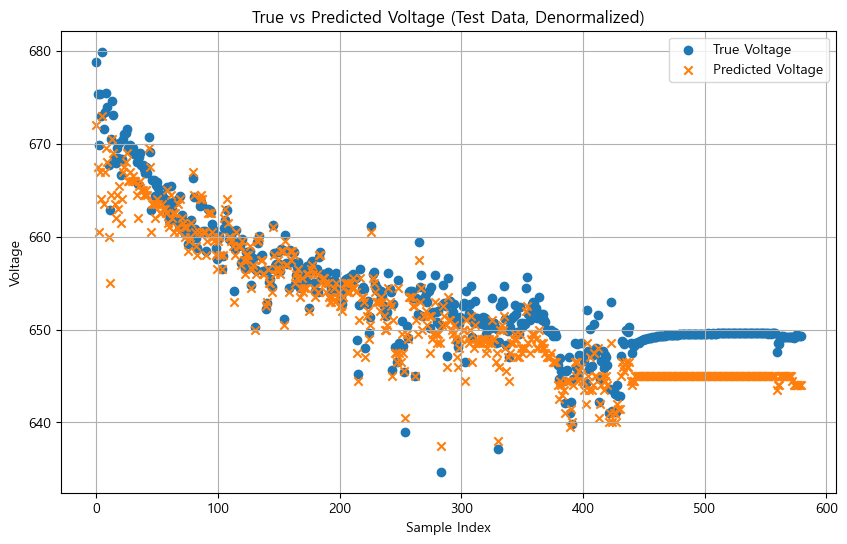

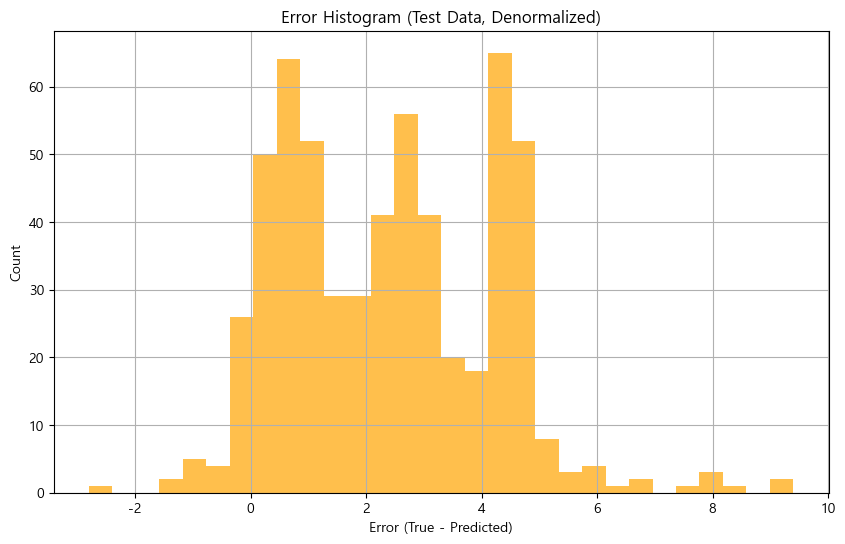

Average Absolute Error: 2.4415517241379345


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, GRU, Dense
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, Callback

# =============================================================================
# 전제 조건:
# - window_size: 정수, 윈도우 길이
# - train_sequences, test_sequences:
#       각각 (N_train, window_size, 4) 및 (N_test, window_size, 4)
#    최종 채널 순서: [Current, SOC, Voltage, ΔI]
# - data_min, data_max: 각 채널의 최소/최대값 (NumPy array)
# - denorm(arr, feature_index): 정규화된 값 arr를 실제 값으로 복원하는 함수(아래 구현 참고)
# =============================================================================

# 예시 denorm 함수: (정규화된 값을 실제 스케일로 복원)
epsilon = 1e-7
def denorm_vector(vec, feature_index, data_min, data_max):
    return vec * (data_max[feature_index] - data_min[feature_index] + epsilon) + data_min[feature_index]

def denorm(x, feature_index):
    return denorm_vector(x, feature_index, data_min, data_max)

# =============================================================================
# 1. 데이터셋 구성 함수:
# 각 윈도우에서 입력은 [Current, SOC, ΔI] (열 인덱스 [0,1,3]), 타깃은 마지막 시점의 Voltage (인덱스 2)
# =============================================================================
def prepare_dataset_single_target(sequences):
    X_list = []
    y_list = []
    for window in sequences:
        # window: shape (window_size, 4)
        X_sample = window[:, [0, 1, 3]]   # 입력: [Current, SOC, ΔI]
        y_sample = window[-1, 2]          # 타깃: 마지막 시점 Voltage
        X_list.append(X_sample)
        y_list.append(y_sample)
    X_data = np.array(X_list)
    y_data = np.array(y_list)
    y_data = np.expand_dims(y_data, -1)
    return X_data, y_data

# Train, Test 데이터셋 구성 (train_sequences, test_sequences는 이미 정규화되어 있음)
X_train, y_train = prepare_dataset_single_target(train_sequences)
X_test, y_test = prepare_dataset_single_target(test_sequences)

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

# ※ 추가 정규화할 필요는 없음(이미 정규화된 데이터 사용)

# =============================================================================
# 2. GRU Teacher 모델 구성 (단일 타깃 전압 예측)
# 입력: [Current, SOC, ΔI] (feature_dim = 3)
# 출력: Dense(1, activation='sigmoid') → 정규화된 전압, [0,1]
# =============================================================================
def build_gru_model_single_target(window_size, feature_dim):
    inp = Input(shape=(window_size, feature_dim))
    x = GRU(64, return_sequences=True)(inp)
    x = GRU(64, return_sequences=True)(x)
    x = GRU(32, return_sequences=True)(x)
    x = GRU(32, return_sequences=False)(x)
    out = Dense(1, activation='sigmoid')(x)
    model = Model(inp, out, name="GRU_Voltage_Predictor_SingleTarget")
    return model

gru_model = build_gru_model_single_target(window_size, feature_dim=3)
gru_model.summary()

# =============================================================================
# 3. 콜백 및 학습 설정
# =============================================================================
class PrintLossCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 100 == 0:
            loss = logs.get("loss")
            val_loss = logs.get("val_loss")
            print(f"Epoch {epoch+1}: Loss = {loss:.4f}, Val Loss = {val_loss:.4f}")

def lr_decay(epoch, lr):
    if epoch > 0 and epoch % 100 == 0:
        return lr * 0.9
    return lr

lr_scheduler = LearningRateScheduler(lr_decay, verbose=1)
checkpoint = ModelCheckpoint("teacher_gru_voltage_model.h5", monitor='val_loss',
                             save_best_only=True, verbose=1)

# =============================================================================
# 4. 모델 컴파일 및 학습
# =============================================================================
gru_model.compile(optimizer=Adam(learning_rate=1e-4), loss='mse')

history = gru_model.fit(X_train, y_train,
                        validation_data=(X_test, y_test),
                        epochs=100, batch_size=64,
                        callbacks=[lr_scheduler, checkpoint, PrintLossCallback()],
                        verbose=1)

gru_model.save("teacher_gru_voltage_model.h5")

# =============================================================================
# 5. 학습 결과 평가 및 플롯
# =============================================================================
loaded_model = load_model("teacher_gru_voltage_model.h5")
y_pred_norm = loaded_model.predict(X_test)  # shape: (N_test, 1)

# 예측한 정규화된 전압 y_pred_norm와 실제 y_test는 모두 [0,1] 범위값입니다.
# 이를 역정규화하여 실제 전압 값으로 복원합니다. (여기서 feature index 2: Voltage)
y_pred = denorm(y_pred_norm.squeeze(), 2)
y_true = denorm(y_test.squeeze(), 2)
error = y_true - y_pred

rmse = np.sqrt(np.mean(np.square(error)))
mae = np.mean(np.abs(error))
print("Test Data RMSE (Denorm): {:.4f}".format(rmse))
print("Test Data MAE (Denorm): {:.4f}".format(mae))

# 실제 전압과 예측 전압을 scatter plot으로 시각화
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_true)), y_true, label="True Voltage", marker='o')
plt.scatter(range(len(y_pred)), y_pred, label="Predicted Voltage", marker='x')
plt.xlabel("Sample Index")
plt.ylabel("Voltage")
plt.title("True vs Predicted Voltage (Test Data, Denormalized)")
plt.legend()
plt.grid(True)
plt.show()

# 오차 히스토그램
plt.figure(figsize=(10,6))
plt.hist(error, bins=30, color='orange', alpha=0.7)
plt.xlabel("Error (True - Predicted)")
plt.ylabel("Count")
plt.title("Error Histogram (Test Data, Denormalized)")
plt.grid(True)
plt.show()

print("Average Absolute Error:", np.mean(np.abs(error)))


Test X shape: (580, 60, 3)
Test Y shape: (580, 1)
19/19 [==============================] - 0s 7ms/step


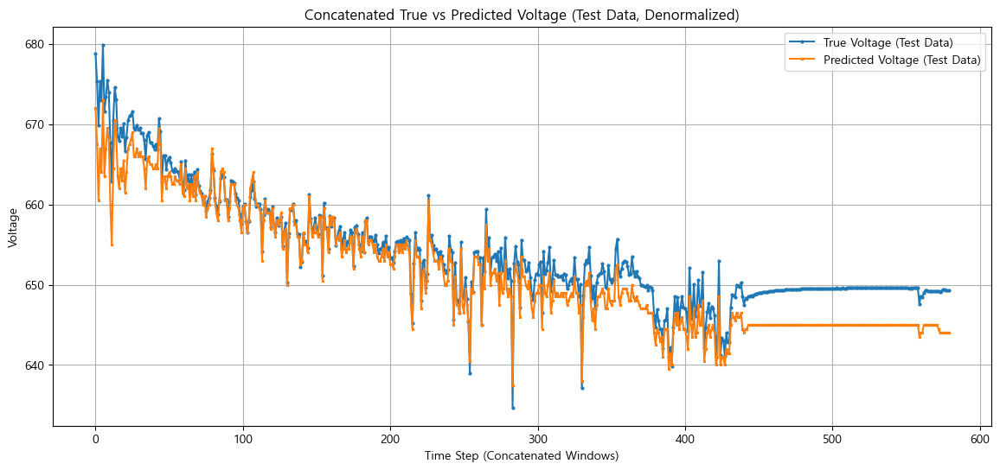

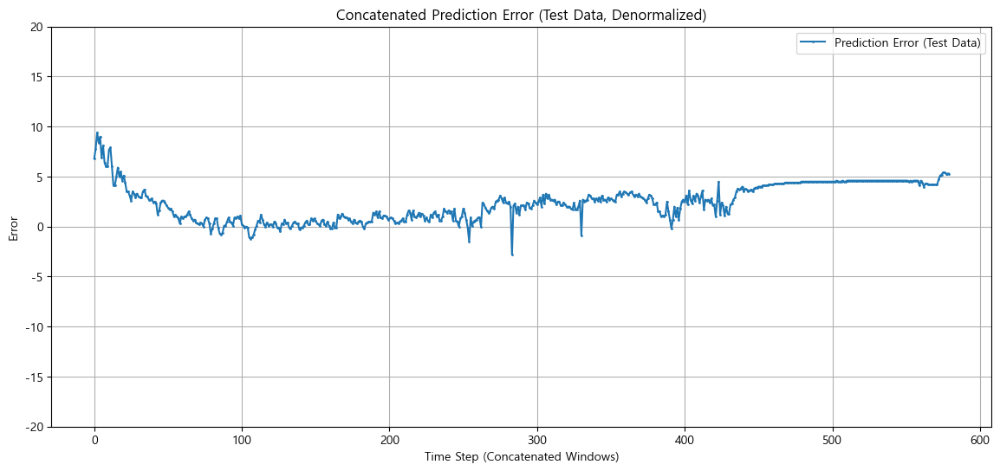

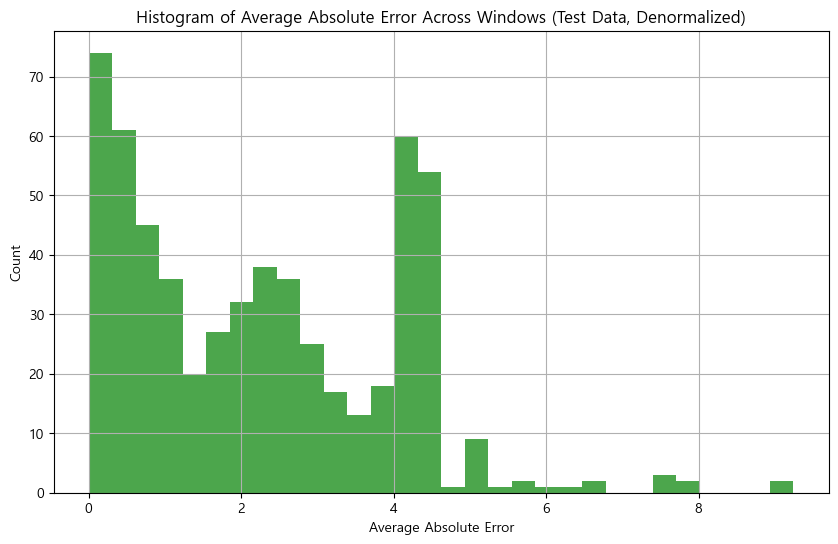

Average Absolute Error on Test Data (Denormalized): 2.2643
RMSE on Test Data (Denormalized): 3.0039
RMSE/192 on Test Data (Denormalized): 0.0156


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model

# =============================================================================
# 전제: 아래 변수들은 이미 정의되어 있다고 가정합니다.
# - window_size: 시퀀스 길이
# - data_min, data_max: 각 채널([Current, SOC, Voltage, ΔI])의 최소/최대값 (NumPy array)
# - denorm(arr, feature_index): 정규화된 값 arr를 실제 값으로 복원하는 함수
# - loaded_model: 학습된 모델 (예: GRU Teacher 모델)
# - test_sequences: shape = (N_test, window_size, 4), 최종 채널 순서: [Current, SOC, Voltage, ΔI]
# =============================================================================

# 예시 denorm 함수 (이미 정의되어 있을 경우 이 함수는 재사용)
epsilon = 1e-7
def denorm_vector(vec, feature_index, data_min, data_max):
    return vec * (data_max[feature_index] - data_min[feature_index] + epsilon) + data_min[feature_index]

def denorm(x, feature_index):
    return denorm_vector(x, feature_index, data_min, data_max)

# =============================================================================
# 1. 입력과 타깃 분리
#
# 여기서는 원래 코드에서
#    test_sequences를 사용했지만, 아래 예시에서는 동일하게 test_sequences를 사용합니다.
#
# GRU 모델의 입력: [Current, SOC, ΔI] (인덱스: 0, 1, 3)
# 타깃: Voltage (인덱스: 2) → 여기서는 각 윈도우의 마지막 시점만 사용
# =============================================================================

test_X = test_sequences[:, :, [0, 1, 3]]
test_Y = test_sequences[:, -1, 2]   # 각 윈도우의 마지막 시점 Voltage
test_Y = np.expand_dims(test_Y, -1)

print("Test X shape:", test_X.shape)
print("Test Y shape:", test_Y.shape)

# =============================================================================
# 2. 모델 예측
#
# loaded_model은 이미 학습된 모델 (예: GRU Teacher 모델)이며,
# predict 결과는 shape (N_test, 1) 혹은 (N_test, window_size, 1)로 나올 수 있습니다.
# (여기서는 각 윈도우의 마지막 시점을 예측한다고 가정하므로, (N_test, 1)로 나오면 됩니다.)
# =============================================================================

y_pred_test = loaded_model.predict(test_X)
# 만약 predict 결과가 (N_test, 1)이 아니라 (N_test, window_size, 1)이라면, 원하는 마지막 시점만 선택하세요.
if len(y_pred_test.shape) == 3:
    # 예: 마지막 시점을 선택
    y_pred_test = y_pred_test[:, -1, :]
num_samples_test = test_X.shape[0]

# =============================================================================
# 3. 각 샘플의 타깃 전압을 이어 붙여 하나의 긴 시계열로 만듭니다.
# =============================================================================

concatenated_true_test = np.concatenate([np.atleast_1d(test_Y[i].squeeze()) for i in range(num_samples_test)])
concatenated_pred_test = np.concatenate([np.atleast_1d(y_pred_test[i].squeeze()) for i in range(num_samples_test)])
concatenated_error_test = concatenated_true_test - concatenated_pred_test

# =============================================================================
# 4. Denormalize (Voltage는 채널 index 2)
# =============================================================================

concatenated_true_test_denorm = denorm(concatenated_true_test, 2)
concatenated_pred_test_denorm = denorm(concatenated_pred_test, 2)
concatenated_error_test_denorm = concatenated_true_test_denorm - concatenated_pred_test_denorm

# =============================================================================
# 5. 플롯: 실제 전압과 예측 전압 (Concatenated Line Plot)
# =============================================================================

plt.figure(figsize=(14, 6))
plt.plot(concatenated_true_test_denorm, label="True Voltage (Test Data)",
         marker='o', markersize=2, linestyle='-')
plt.plot(concatenated_pred_test_denorm, label="Predicted Voltage (Test Data)",
         marker='x', markersize=2, linestyle='-')
plt.xlabel("Time Step (Concatenated Windows)")
plt.ylabel("Voltage")
plt.title("Concatenated True vs Predicted Voltage (Test Data, Denormalized)")
plt.legend()
plt.grid(True)
plt.show()

# =============================================================================
# 6. 플롯: 예측 오차 (실제 - 예측) 라인 플롯
# =============================================================================

plt.figure(figsize=(14, 6))
plt.plot(concatenated_error_test_denorm, label="Prediction Error (Test Data)",
         marker='.', markersize=2, linestyle='-')
plt.xlabel("Time Step (Concatenated Windows)")
plt.ylabel("Error")
plt.title("Concatenated Prediction Error (Test Data, Denormalized)")
plt.legend()
plt.ylim(-20,20)
plt.grid(True)
plt.show()

# =============================================================================
# 7. 각 윈도우별 평균 절대 오차 분포 히스토그램
# =============================================================================
window_abs_errors_test = [
    np.mean(np.abs(test_Y[i].squeeze() - y_pred_test[i].squeeze()))
    for i in range(num_samples_test)
]
window_abs_errors_test_denorm = [
    np.mean(np.abs(denorm(test_Y[i].squeeze(), 2) - denorm(y_pred_test[i].squeeze(), 2)))
    for i in range(num_samples_test)
]

plt.figure(figsize=(10, 6))
plt.hist(window_abs_errors_test_denorm, bins=30, color='green', alpha=0.7)
plt.title("Histogram of Average Absolute Error Across Windows (Test Data, Denormalized)")
plt.xlabel("Average Absolute Error")
plt.ylabel("Count")
plt.grid(True)
plt.show()

avg_abs_error_test = np.mean(window_abs_errors_test_denorm)
print("Average Absolute Error on Test Data (Denormalized): {:.4f}".format(avg_abs_error_test))

# =============================================================================
# 8. RMSE 계산
# =============================================================================
rmse = np.sqrt(np.mean(np.square(concatenated_error_test_denorm)))
rmse_div_192 = rmse / 192

print("RMSE on Test Data (Denormalized): {:.4f}".format(rmse))
print("RMSE/192 on Test Data (Denormalized): {:.4f}".format(rmse_div_192))


In [ ]:
# import random

# # -----------------------------
# # 1. SOC 설정 및 real 윈도우 5개 무작위 선택
# # -----------------------------

# target_soc = 50

# end_soc = final_sequences[:, -1, 1]
# real_soc = inverse_minmax(end_soc, soc_min, soc_max)
# mask = (real_soc == target_soc)
# real_samples = final_sequences[mask]

# assert len(real_samples) >= 5, f"{target_soc}% SOC 윈도우가 5개 미만입니다."
# selected_indices = random.sample(range(len(real_samples)), 5)
# selected_real_samples = real_samples[selected_indices]

# # -----------------------------
# # 2. 각 real 윈도우에 대해 10개 fake 전류 오버랩 시각화
# # -----------------------------
# for sample_idx, real_sample in enumerate(selected_real_samples):
#     real_current = denorm(real_sample[:, 0], 0)  # 원본 전류

#     # 10개 fake 생성
#     num_gen = 20
#     cond = make_cond_batch(target_soc, window_size, data_min, data_max, num_gen)
#     noise = tf.random.normal([num_gen, window_size, latent_dim])
#     generated_seq = generator_model([noise, cond], training=False)
#     generated_currents = denorm(generated_seq[:, :, 0], 0)  # shape: (10, window_size)

#     # Plot: 2행 5열 subplot
#     fig, axes = plt.subplots(4, 5, figsize=(20, 12), sharex=True, sharey=True)
#     axes = axes.flatten()

#     for i in range(num_gen):
#         axes[i].plot(real_current, color='red', alpha=0.6, label='Real' if i==0 else "")
#         axes[i].plot(generated_currents[i], color='royalblue', linewidth=1.5, label='Generated' if i==0 else "")
#         axes[i].set_title(f"Sample {sample_idx+1} - Gen {i+1}")
#         axes[i].set_xlabel("Time Step")
#         axes[i].set_ylabel("Current")
#         # axes[i].set_ylim(-40,0)
#         if i == 0:
#             axes[i].legend()

#     fig.suptitle(f"Real vs Generated Currents @ SOC={target_soc}% (Sample {sample_idx+1})", fontsize=16)
#     plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#     plt.show()


In [ ]:
# import numpy as np
# import tensorflow as tf
# import matplotlib.pyplot as plt
# import matplotlib.animation as animation
# from IPython.display import HTML

# # --- 가정 ---
# # data_min, data_max, generator_model, combine_output, denorm, window_size, latent_dim
# # 은 이미 정의되어 있다고 가정합니다.
# # 예시:
# # target_soc = 50
# # window_size = 60
# # latent_dim = 5

# # ---------------------------------------------------------------------------
# # 1. 고정된 SOC 조건 텐서 생성 (condition)
# # ---------------------------------------------------------------------------
# target_soc = 50  # 고정 SOC 값 (예: 50%)
# steps = 501      # 0부터 1까지 101개 점 (100등분)
# soc_min = data_min[1]
# soc_max = data_max[1]
# scaled_soc = (target_soc - soc_min) / (soc_max - soc_min + 1e-7)
# # condition 텐서의 shape: (steps, window_size, 1)
# cond = tf.ones((steps, window_size, 1), dtype=tf.float32) * scaled_soc

# # ---------------------------------------------------------------------------
# # 2. 두 개의 noise 벡터 생성 후 선형 보간(interpolation)
# # ---------------------------------------------------------------------------
# z_start = tf.random.normal([1, window_size, latent_dim])
# z_end = tf.random.normal([1, window_size, latent_dim])
# alphas = np.linspace(0, 1, steps)  # 0부터 1까지 균등 분할
# interpolated_noise_list = []
# for alpha in alphas:
#     z_interp = (1 - alpha) * z_start + alpha * z_end
#     interpolated_noise_list.append(z_interp)
# # 보간된 noise 텐서의 shape: (steps, window_size, latent_dim)
# interpolated_noise = tf.concat(interpolated_noise_list, axis=0)

# # ---------------------------------------------------------------------------
# # 3. Generator에 보간된 noise와 고정된 condition을 입력하여 시퀀스 생성 및 역정규화
# # ---------------------------------------------------------------------------
# latent_output = generator_model([interpolated_noise, cond], training=False)
# generated_seq = combine_output(latent_output, cond)
# # generated_seq의 shape: (steps, window_size, 4); 여기서 Current는 index 0
# generated_currents = generated_seq[:, :, 0]
# # 역정규화: denorm 함수 사용 (예: feature_index 0)
# generated_currents_denorm = denorm(generated_currents.numpy(), 0)

# # ---------------------------------------------------------------------------
# # 4. α=0와 α=1일 때의 결과를 별도의 그림으로 표시
# # ---------------------------------------------------------------------------
# alpha0_current = generated_currents_denorm[0]    # α = 0 (기준)
# alpha1_current = generated_currents_denorm[-1]   # α = 1 (최종)

# x = np.arange(window_size)
# plt.figure(figsize=(12, 5))

# plt.subplot(1, 2, 1)
# plt.plot(x, alpha0_current, marker='o', lw=1, color='blue')
# plt.title("Alpha = 0 (Baseline)")
# plt.xlabel("Time Step")
# plt.ylabel("Current")
# plt.grid(True)

# plt.subplot(1, 2, 2)
# plt.plot(x, alpha1_current, marker='o', lw=1, color='red')
# plt.title("Alpha = 1 (Final)")
# plt.xlabel("Time Step")
# plt.ylabel("Current")
# plt.grid(True)

# plt.tight_layout()
# plt.show()

# # ---------------------------------------------------------------------------
# # 5. 전체 보간 과정을 애니메이션(GIF)으로 생성
# # ---------------------------------------------------------------------------
# fig, ax = plt.subplots(figsize=(10, 5))
# line, = ax.plot([], [], marker='o', lw=1)
# ax.set_xlim(0, window_size - 1)
# ax.set_ylim(np.min(generated_currents_denorm) - 10, np.max(generated_currents_denorm) + 10)
# ax.set_xlabel("Time Step")
# ax.set_ylabel("Current")
# ax.set_title("Noise Interpolation Animation")
# ax.grid(True)

# def init():
#     line.set_data([], [])
#     return line,

# def animate(i):
#     y = generated_currents_denorm[i]
#     line.set_data(x, y)
#     ax.set_title(f"Alpha = {alphas[i]:.3f}")
#     return line,

# anim = animation.FuncAnimation(fig, animate, init_func=init,
#                                frames=steps, interval=100, blit=True)

# # 애니메이션을 Jupyter Notebook에서 바로 확인하려면:
# HTML(anim.to_jshtml())

# # GIF로 저장하려면 (ImageMagick 설치 필요):
# # anim.save('noise_interpolation.gif', writer='imagemagick', fps=10)


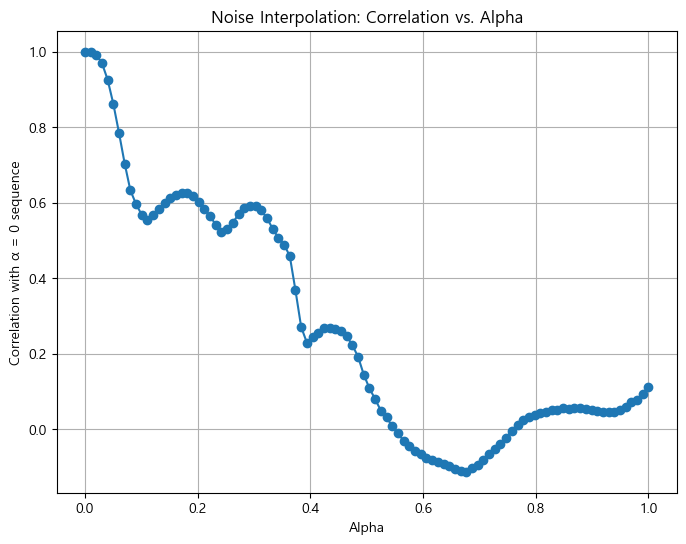

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# 하이퍼파라미터 설정
target_soc = 30        # 고정 SOC 값 (예: 50%)
steps = 100           # 100등분: 0부터 1까지 101개 점

# data_min과 data_max는 이미 계산된 값이라고 가정합니다.
# 예: data_min = [current_min, soc_min, voltage_min, delta_I_min]
#     data_max = [current_max, soc_max, voltage_max, delta_I_max]

# generator_model: 학습된 Generator 모델 (입력: [noise, condition], 출력: latent vector)
# combine_output: Generator의 출력을 최종 시퀀스로 변환하는 함수 ([Current, SOC, Voltage, △I])
# denorm: 특정 피처에 대해 역정규화를 수행하는 함수 (예: denorm(x, feature_index))

# -----------------------------------------------------------------------------
# 1. 고정된 SOC 조건 텐서 생성 (condition)
# -----------------------------------------------------------------------------
soc_min = data_min[1]
soc_max = data_max[1]
# target_soc를 스케일링합니다.
scaled_soc = (target_soc - soc_min) / (soc_max - soc_min + 1e-7)
# Generator는 condition 텐서의 shape가 (batch, window_size, 1)이어야 하므로, steps 개 만큼 생성합니다.
cond = tf.ones((steps, window_size, 1), dtype=tf.float32) * scaled_soc

# -----------------------------------------------------------------------------
# 2. 두 개의 noise 벡터 생성 후 보간(interpolation) 수행
# -----------------------------------------------------------------------------
# 두 개의 noise 벡터 생성 (shape: (1, window_size, latent_dim))
z_start = tf.random.normal([1, window_size, latent_dim])
z_end = tf.random.normal([1, window_size, latent_dim])

# 0부터 1까지의 α 값을 steps 단계로 생성합니다.
alphas = np.linspace(0, 1, steps)
interpolated_noise_list = []
for alpha in alphas:
    # 선형 보간: (1 - α)*z_start + α*z_end
    z_interp = (1 - alpha) * z_start + alpha * z_end
    interpolated_noise_list.append(z_interp)

# 보간된 noise 텐서를 하나로 합칩니다. 최종 shape는 (steps, window_size, latent_dim)
interpolated_noise = tf.concat(interpolated_noise_list, axis=0)

# -----------------------------------------------------------------------------
# 3. Generator에 보간된 noise와 고정된 condition을 입력하여 시퀀스 생성
# -----------------------------------------------------------------------------
latent_output = generator_model([interpolated_noise, cond], training=False)
generated_seq = combine_output(latent_output, cond)
# generated_seq의 shape는 (steps, window_size, 4)입니다.
# 여기서 현재(Current) 채널은 index 0이라고 가정합니다.
generated_currents = generated_seq[:, :, 0]

# 역정규화: denorm 함수를 사용하여 원래 scale로 복원합니다.
generated_currents_denorm = denorm(generated_currents.numpy(), 0)

# -----------------------------------------------------------------------------
# 4. α=0인 결과와 각 단계의 결과 간 상관계수 계산
# -----------------------------------------------------------------------------
# α=0일 때의 current 시퀀스 (기준)
base_current = generated_currents_denorm[0]
corrs = []
for i in range(steps):
    current_i = generated_currents_denorm[i]
    # numpy의 corrcoef를 이용하여 상관계수 계산 (두 시퀀스가 1차원 배열이라 가정)
    corr = np.corrcoef(base_current, current_i)[0, 1]
    corrs.append(corr)

# -----------------------------------------------------------------------------
# 5. 상관계수 결과 시각화 (α에 따른 변화)
# -----------------------------------------------------------------------------
plt.figure(figsize=(8, 6))
plt.plot(alphas, corrs, marker='o', linestyle='-')
plt.xlabel("Alpha")
plt.ylabel("Correlation with α = 0 sequence")
plt.title("Noise Interpolation: Correlation vs. Alpha")
plt.grid(True)
plt.show()


In [ ]:
# import matplotlib.pyplot as plt

# # 이미 train_data와 test_data는 아래와 같이 전처리되어 있습니다.
# # 최종 컬럼 순서: ['Current', 'SOC', 'Voltage', '△I']

# # 각 피쳐별로 원본 데이터를 플롯합니다.
# feature_names = ['Current', 'SOC', 'Voltage', '△I']

# plt.figure(figsize=(14, 12))
# for i, feature in enumerate(feature_names):
#     plt.subplot(len(feature_names), 1, i+1)
#     plt.plot(train_data[feature], label=f"Test {feature}", color='blue', alpha=0.7)
#     plt.plot(test_data[feature], label=f"Train {feature}", color='red', alpha=0.7)
#     plt.title(f"Original {feature} Values (Before Normalization)")
#     plt.xlabel("Time Step")
#     plt.ylabel(feature)
#     plt.legend(loc='best')
# plt.tight_layout()
# plt.show()
